In [1]:
pip install pandas numpy matplotlib seaborn pytrends nltk wordcloud gensim statsmodels

Note: you may need to restart the kernel to use updated packages.


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/3203218011.py:63: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')


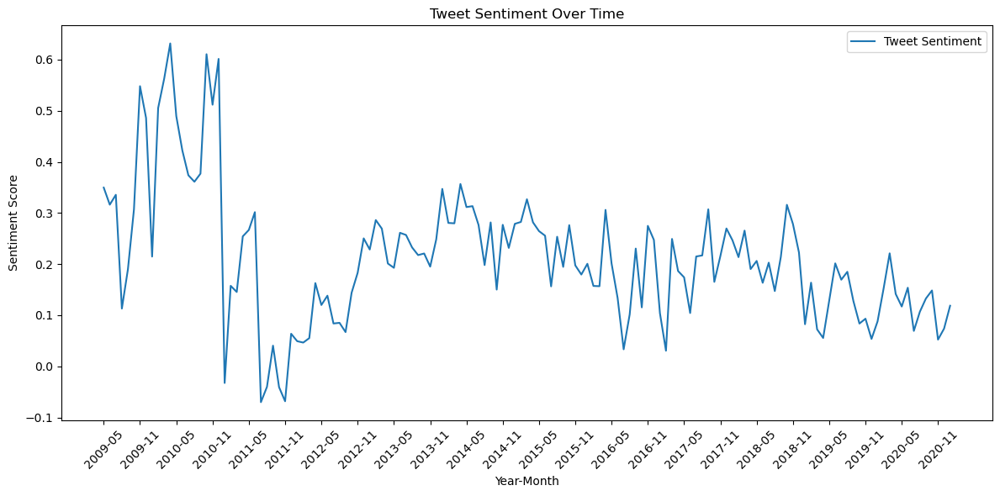

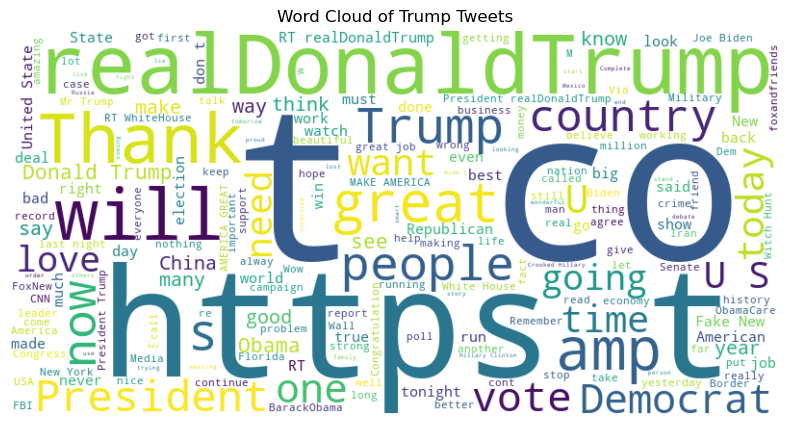

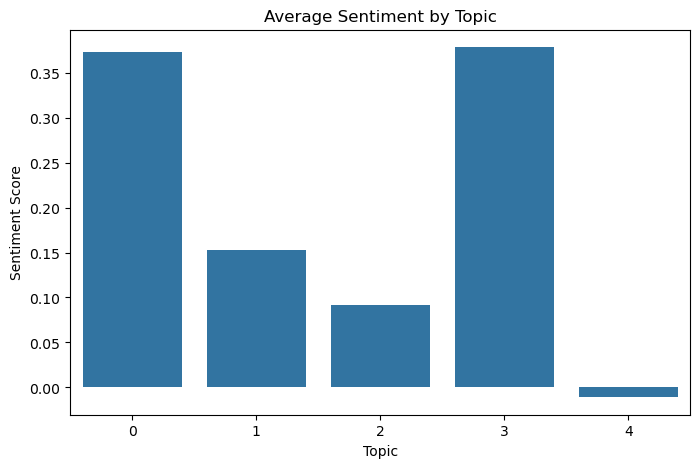

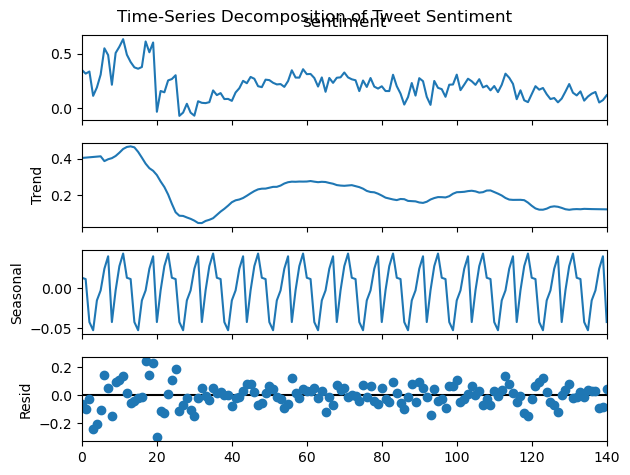

### Potential Challenges Based on Analysis ###
1. Sentiment Divergence: Tweet sentiment mean = 0.18. If consistently high, it may contrast with negative media tones, suggesting a perception gap.
2. Topic Insights:
Topic 0: 0.029*"trump" + 0.028*"great" + 0.017*"make" + 0.015*"new" + 0.014*"house" + 0.011*"donald" + 0.010*"america" + 0.010*"http" + 0.008*"realdonaldtrump" + 0.008*"good"
Sentiment: 0.37
Topic 1: 0.027*"border" + 0.016*"wall" + 0.013*"china" + 0.009*"trade" + 0.009*"collusion" + 0.009*"deal" + 0.009*"big" + 0.008*"impeachment" + 0.008*"great" + 0.007*"mexico"
Sentiment: 0.15
Topic 2: 0.015*"united" + 0.014*"states" + 0.010*"democrats" + 0.008*"crime" + 0.008*"people" + 0.008*"jobs" + 0.008*"republicans" + 0.008*"years" + 0.008*"senate" + 0.007*"republican"
Sentiment: 0.09
Topic 3: 0.110*"https" + 0.041*"rt" + 0.037*"great" + 0.035*"realdonaldtrump" + 0.030*"thank" + 0.019*"president" + 0.011*"america" + 0.010*"whitehouse" + 0.009*"today" + 0.008*"vote"
Sentiment: 0.38
Top

In [4]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from gensim import corpora
from gensim.models import LdaModel
import statsmodels.api as sm

# Download NLTK resources (run once)
import nltk
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Load Trump's tweets dataset
tweets_path = '/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets.csv'
df_tweets = pd.read_csv(tweets_path)

# Ensure datetime is in correct format
df_tweets['datetime'] = pd.to_datetime(df_tweets['datetime'], errors='coerce')

# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Calculate sentiment scores for each tweet
df_tweets['sentiment'] = df_tweets['text'].apply(lambda x: sid.polarity_scores(str(x))['compound'])

# Step 1: Deepen Sentiment Analysis with Topic Modeling
# Preprocess text for topic modeling
stop_words = set(stopwords.words('english'))
def preprocess_text(text):
    tokens = word_tokenize(str(text).lower())
    return [word for word in tokens if word.isalnum() and word not in stop_words]

df_tweets['tokens'] = df_tweets['text'].apply(preprocess_text)

# Create dictionary and corpus for LDA
dictionary = corpora.Dictionary(df_tweets['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in df_tweets['tokens']]

# Run LDA model (5 topics as an example)
lda_model = LdaModel(corpus, num_topics=5, id2word=dictionary, passes=10)
topics = lda_model.print_topics()

# Assign dominant topic to each tweet
def get_dominant_topic(doc):
    bow = dictionary.doc2bow(doc)
    topics_dist = lda_model[bow]
    return max(topics_dist, key=lambda x: x[1])[0]

df_tweets['dominant_topic'] = df_tweets['tokens'].apply(get_dominant_topic)

# Sentiment by topic
topic_sentiment = df_tweets.groupby('dominant_topic')['sentiment'].mean()

# Step 2: Enhanced Visualizations
# Time-series plot: Tweet sentiment over time
df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')
tweet_sentiment_monthly = df_tweets.groupby('year_month')['sentiment'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(tweet_sentiment_monthly['year_month'].astype(str), tweet_sentiment_monthly['sentiment'], label='Tweet Sentiment')
plt.xticks(ticks=range(0, len(tweet_sentiment_monthly), 6), labels=tweet_sentiment_monthly['year_month'].astype(str)[::6], rotation=45)
plt.title('Tweet Sentiment Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Sentiment Score')
plt.legend()
plt.tight_layout()
plt.show()

# Word cloud for all tweets
all_text = ' '.join(df_tweets['text'].astype(str))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Trump Tweets')
plt.show()

# Bar plot: Sentiment by topic
plt.figure(figsize=(8, 5))
sns.barplot(x=topic_sentiment.index, y=topic_sentiment.values)
plt.title('Average Sentiment by Topic')
plt.xlabel('Topic')
plt.ylabel('Sentiment Score')
plt.show()

# Step 3: Additional Statistical Analysis (Time-Series Trend)
# Decompose tweet sentiment time-series
tweet_sentiment_monthly['year_month'] = tweet_sentiment_monthly['year_month'].dt.to_timestamp()
decomposition = sm.tsa.seasonal_decompose(tweet_sentiment_monthly['sentiment'], model='additive', period=12, extrapolate_trend='freq')
decomposition.plot()
plt.suptitle('Time-Series Decomposition of Tweet Sentiment')
plt.show()

# Step 4: Infer Challenges (Manual Interpretation)
print("### Potential Challenges Based on Analysis ###")
print(f"1. Sentiment Divergence: Tweet sentiment mean = {df_tweets['sentiment'].mean():.2f}. If consistently high, it may contrast with negative media tones, suggesting a perception gap.")
print("2. Topic Insights:")
for i, topic in enumerate(topics):
    print(f"Topic {i}: {topic[1]}")
    print(f"Sentiment: {topic_sentiment[i]:.2f}")
print("3. Limited Event Impact: Time-series trends suggest sentiment may not shift dramatically with events (manual check).")

# Save results
df_tweets.to_csv('/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_analyzed.csv', index=False)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1852192067.py:71: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')


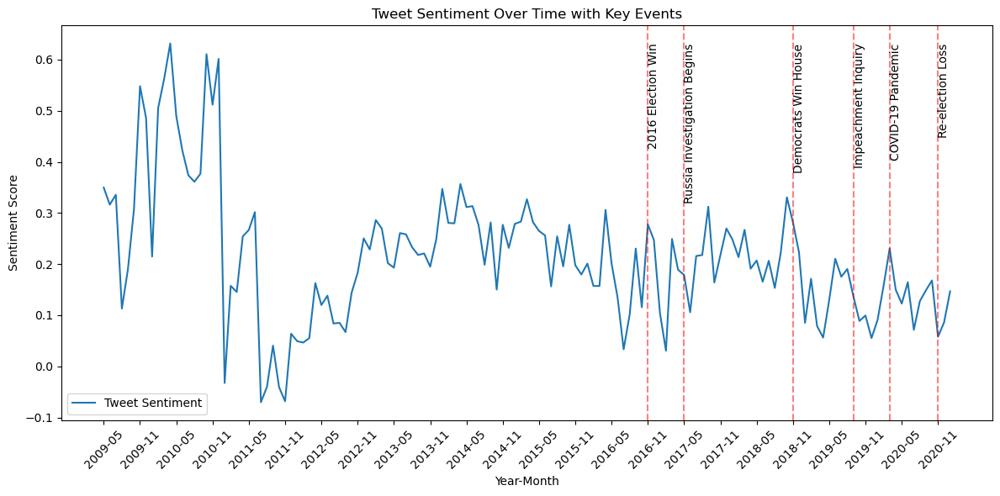

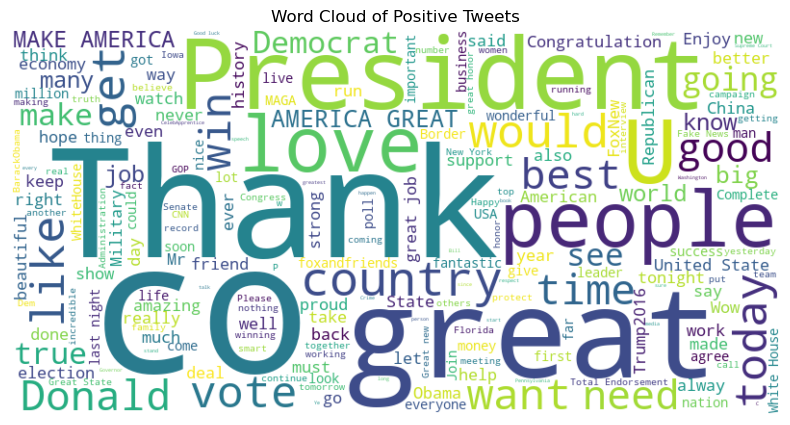

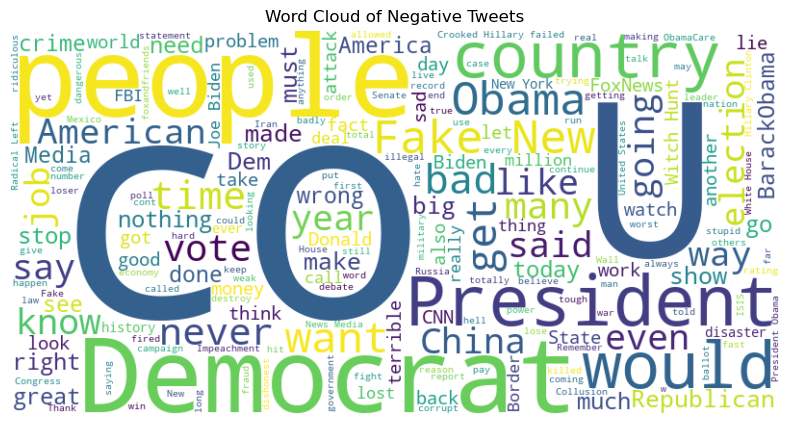

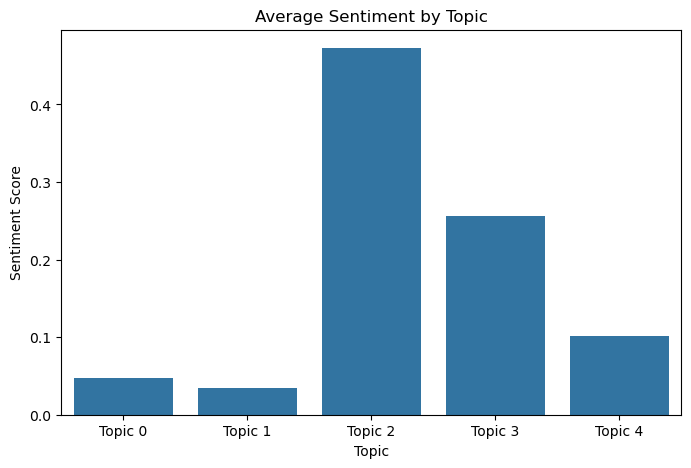

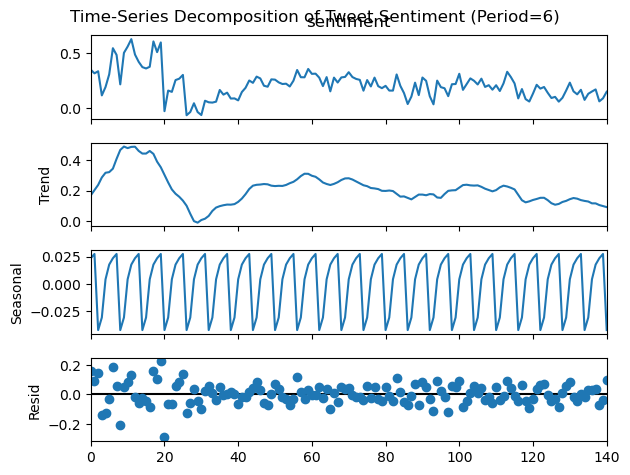

Media sentiment data not found. Skipping this step.
### Potential Challenges Based on Analysis ###
1. Sentiment Divergence: Tweet sentiment mean = 0.19. If consistently high, it may contrast with negative media tones, suggesting a perception gap.
2. Topic Insights:
Topic 0: 0.021*"news" + 0.017*"fake" + 0.016*"never" + 0.015*"president" + 0.014*"media" + 0.013*"would" + 0.011*"house" + 0.011*"like" + 0.011*"hillary" + 0.008*"collusion"
Sentiment: 0.05
Topic 1: 0.012*"democrats" + 0.008*"clinton" + 0.008*"impeachment" + 0.008*"republican" + 0.007*"party" + 0.007*"north" + 0.006*"obama" + 0.006*"meeting" + 0.006*"schiff" + 0.005*"many"
Sentiment: 0.03
Topic 2: 0.076*"great" + 0.047*"thank" + 0.017*"america" + 0.016*"make" + 0.014*"thanks" + 0.013*"love" + 0.012*"tonight" + 0.010*"true" + 0.009*"today" + 0.009*"congratulations"
Sentiment: 0.47
Topic 3: 0.031*"president" + 0.027*"border" + 0.016*"vote" + 0.015*"united" + 0.015*"states" + 0.014*"great" + 0.014*"wall" + 0.012*"whitehouse" + 

In [7]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from gensim import corpora
from gensim.models import LdaModel
import statsmodels.api as sm

# Download NLTK resources (run once)
import nltk
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Load Trump's tweets dataset
tweets_path = '/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets.csv'
df_tweets = pd.read_csv(tweets_path)

# Ensure datetime is in correct format
df_tweets['datetime'] = pd.to_datetime(df_tweets['datetime'], errors='coerce')

# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Calculate sentiment scores for each tweet
df_tweets['sentiment'] = df_tweets['text'].apply(lambda x: sid.polarity_scores(str(x))['compound'])

# Step 1: Deepen Sentiment Analysis with Improved Topic Modeling
# Preprocess text for topic modeling
stop_words = set(stopwords.words('english'))
stop_words.update(['http', 'https', 'amp', 'realdonaldtrump', 'trump', 'will', 'one', 'now', 'rt'])  # Add more stop words
def preprocess_text(text):
    tokens = word_tokenize(str(text).lower())
    return [word for word in tokens if word.isalnum() and word not in stop_words and len(word) > 3]  # Exclude short words

df_tweets['tokens'] = df_tweets['text'].apply(preprocess_text)

# Filter out empty token lists
df_tweets = df_tweets[df_tweets['tokens'].map(len) > 0]

# Create dictionary and corpus for LDA
dictionary = corpora.Dictionary(df_tweets['tokens'])
# Filter extremes to remove rare and overly common words
dictionary.filter_extremes(no_below=5, no_above=0.5)
corpus = [dictionary.doc2bow(tokens) for tokens in df_tweets['tokens']]

# Run LDA model (5 topics, more passes for better convergence)
lda_model = LdaModel(corpus, num_topics=5, id2word=dictionary, passes=20, random_state=42)
topics = lda_model.print_topics()

# Assign dominant topic to each tweet
def get_dominant_topic(doc):
    bow = dictionary.doc2bow(doc)
    topics_dist = lda_model[bow]
    if topics_dist:  # Check if topics_dist is not empty
        return max(topics_dist, key=lambda x: x[1])[0]
    return -1  # Default value if no topics are assigned

df_tweets['dominant_topic'] = df_tweets['tokens'].apply(get_dominant_topic)

# Sentiment by topic (exclude rows with no topic assigned)
topic_sentiment = df_tweets[df_tweets['dominant_topic'] != -1].groupby('dominant_topic')['sentiment'].mean()

# Step 2: Enhanced Visualizations
# Time-series plot: Tweet sentiment over time with event annotations
df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')
tweet_sentiment_monthly = df_tweets.groupby('year_month')['sentiment'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(tweet_sentiment_monthly['year_month'].astype(str), tweet_sentiment_monthly['sentiment'], label='Tweet Sentiment')
plt.xticks(ticks=range(0, len(tweet_sentiment_monthly), 6), labels=tweet_sentiment_monthly['year_month'].astype(str)[::6], rotation=45)

# Annotate key political events
events = {
    '2016-11': '2016 Election Win',
    '2017-05': 'Russia Investigation Begins',
    '2018-11': 'Democrats Win House',
    '2019-09': 'Impeachment Inquiry',
    '2020-03': 'COVID-19 Pandemic',
    '2020-11': 'Re-election Loss'
}
for event_date, event_name in events.items():
    if event_date in tweet_sentiment_monthly['year_month'].astype(str).values:
        idx = tweet_sentiment_monthly[tweet_sentiment_monthly['year_month'].astype(str) == event_date].index[0]
        plt.axvline(x=idx, color='red', linestyle='--', alpha=0.5)
        plt.text(idx, tweet_sentiment_monthly['sentiment'].max(), event_name, rotation=90, verticalalignment='top')

plt.title('Tweet Sentiment Over Time with Key Events')
plt.xlabel('Year-Month')
plt.ylabel('Sentiment Score')
plt.legend()
plt.tight_layout()
plt.show()

# Word clouds for positive and negative tweets
positive_text = ' '.join(df_tweets[df_tweets['sentiment'] > 0]['text'].astype(str))
negative_text = ' '.join(df_tweets[df_tweets['sentiment'] < 0]['text'].astype(str))

# Positive word cloud
if positive_text:
    wordcloud_pos = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(positive_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_pos, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Positive Tweets')
    plt.show()

# Negative word cloud
if negative_text:
    wordcloud_neg = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(negative_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_neg, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Negative Tweets')
    plt.show()

# Bar plot: Sentiment by topic with labels
plt.figure(figsize=(8, 5))
sns.barplot(x=topic_sentiment.index, y=topic_sentiment.values)
plt.xticks(ticks=range(len(topic_sentiment)), labels=[f'Topic {i}' for i in range(len(topic_sentiment))])
plt.title('Average Sentiment by Topic')
plt.xlabel('Topic')
plt.ylabel('Sentiment Score')
plt.show()

# Step 3: Adjusted Time-Series Decomposition
# Decompose tweet sentiment time-series with a shorter period
tweet_sentiment_monthly['year_month'] = tweet_sentiment_monthly['year_month'].dt.to_timestamp()
decomposition = sm.tsa.seasonal_decompose(tweet_sentiment_monthly['sentiment'], model='additive', period=6, extrapolate_trend='freq')
decomposition.plot()
plt.suptitle('Time-Series Decomposition of Tweet Sentiment (Period=6)')
plt.show()

# Step 4: Reintroduce Media Sentiment (Optional)
# Replace 'path_to_media_sentiment.csv' with the actual path to your media sentiment data
try:
    media_sentiment_path = 'path_to_media_sentiment.csv'  # Update this path
    df_media_sentiment = pd.read_csv(media_sentiment_path)
    df_media_sentiment['year_month'] = pd.to_datetime(df_media_sentiment['datetime']).dt.to_period('M')  # Adjust 'datetime' column name as needed
    media_sentiment_monthly = df_media_sentiment.groupby('year_month')['sentiment'].mean().reset_index()

    # Merge with tweet sentiment
    combined_sentiment = pd.merge(tweet_sentiment_monthly, media_sentiment_monthly, on='year_month', how='inner', suffixes=('_tweet', '_media'))

    # Plot combined sentiment
    plt.figure(figsize=(12, 6))
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_tweet'], label='Tweet Sentiment')
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_media'], label='Media Sentiment')
    plt.xticks(ticks=range(0, len(combined_sentiment), 6), labels=combined_sentiment['year_month'].astype(str)[::6], rotation=45)
    plt.title('Tweet Sentiment vs Media Sentiment Over Time')
    plt.xlabel('Year-Month')
    plt.ylabel('Sentiment Score')
    plt.legend()
    plt.tight_layout()
    plt.show()
except FileNotFoundError:
    print("Media sentiment data not found. Skipping this step.")

# Step 5: Revised Potential Challenges
print("### Potential Challenges Based on Analysis ###")
print(f"1. Sentiment Divergence: Tweet sentiment mean = {df_tweets['sentiment'].mean():.2f}. If consistently high, it may contrast with negative media tones, suggesting a perception gap.")
print("2. Topic Insights:")
for i, topic in enumerate(topics):
    print(f"Topic {i}: {topic[1]}")
    print(f"Sentiment: {topic_sentiment[i]:.2f}")
print("3. Event Impact Analysis: Check the time-series plot for sentiment shifts around annotated events.")
print("   - If sentiment remains stable, Trump may struggle to mobilize supporters for new causes.")
print("   - If sentiment dips significantly (e.g., post-2020 election), it may reflect challenges in maintaining influence.")

# Save results
df_tweets.to_csv('/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_analyzed.csv', index=False)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/2737775981.py:71: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')


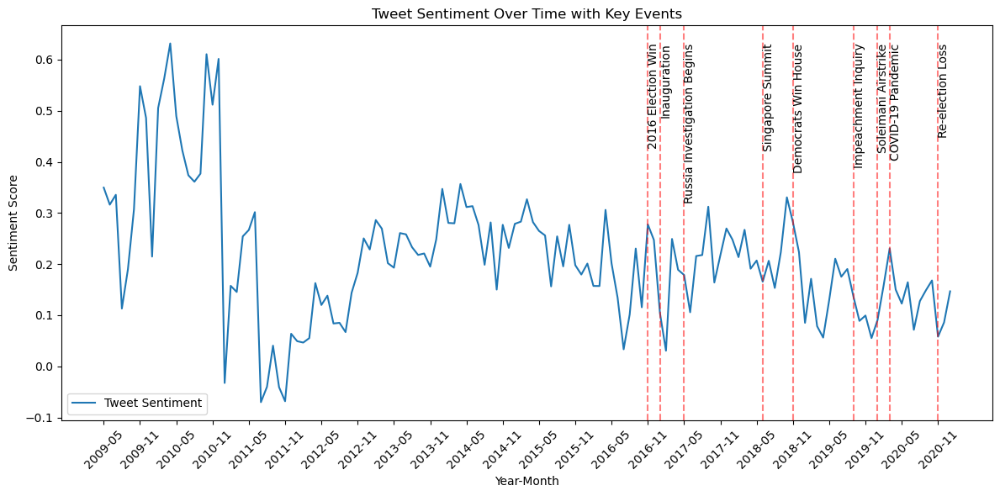

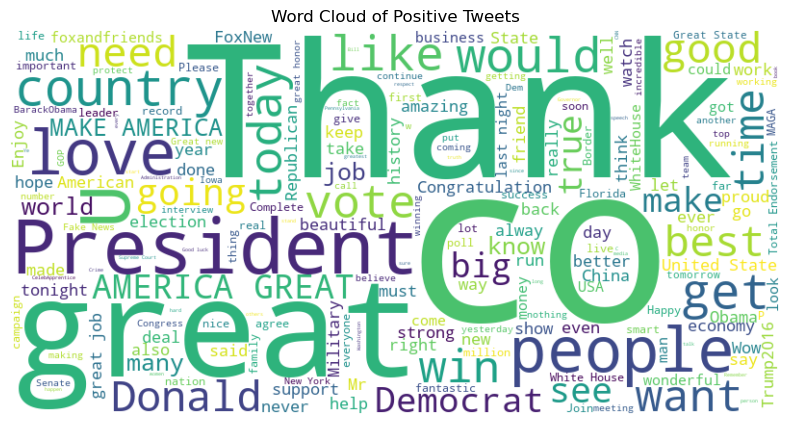

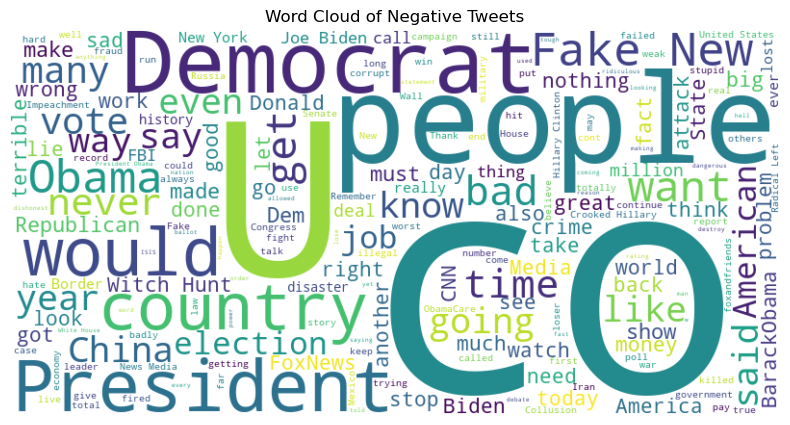

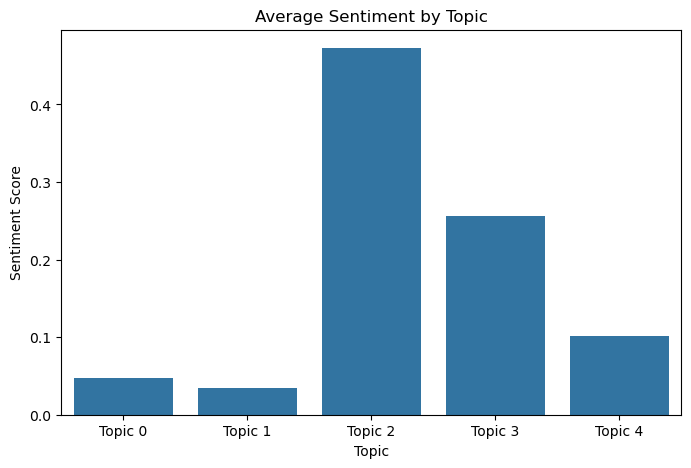

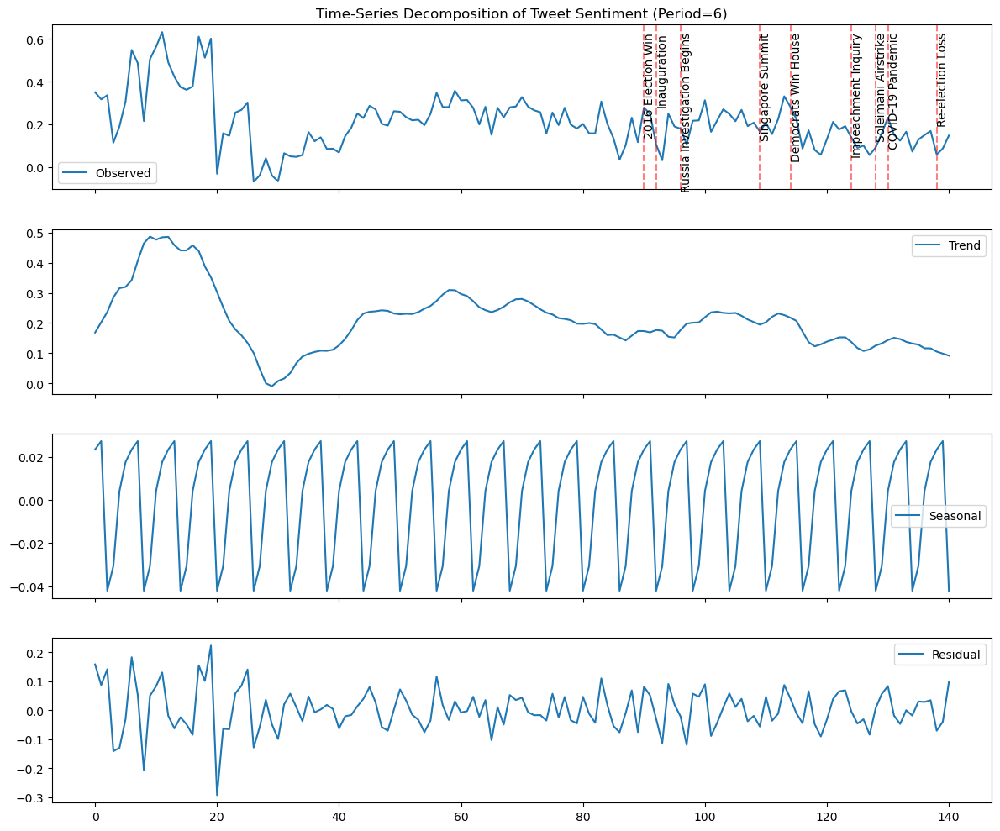

Retweets and likes data not found. Skipping audience reaction analysis.
Media sentiment data not found. Skipping this step.
### Potential Challenges Based on Analysis ###
1. Sentiment Divergence: Tweet sentiment mean = 0.19. If consistently high, it may contrast with negative media tones, suggesting a perception gap.
2. Topic Insights:
Topic 0: 0.021*"news" + 0.017*"fake" + 0.016*"never" + 0.015*"president" + 0.014*"media" + 0.013*"would" + 0.011*"house" + 0.011*"like" + 0.011*"hillary" + 0.008*"collusion"
Sentiment: 0.05
Topic 1: 0.012*"democrats" + 0.008*"clinton" + 0.008*"impeachment" + 0.008*"republican" + 0.007*"party" + 0.007*"north" + 0.006*"obama" + 0.006*"meeting" + 0.006*"schiff" + 0.005*"many"
Sentiment: 0.03
Topic 2: 0.076*"great" + 0.047*"thank" + 0.017*"america" + 0.016*"make" + 0.014*"thanks" + 0.013*"love" + 0.012*"tonight" + 0.010*"true" + 0.009*"today" + 0.009*"congratulations"
Sentiment: 0.47
Topic 3: 0.031*"president" + 0.027*"border" + 0.016*"vote" + 0.015*"united"

In [9]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from gensim import corpora
from gensim.models import LdaModel
import statsmodels.api as sm

# Download NLTK resources (run once)
import nltk
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Load Trump's tweets dataset
tweets_path = '/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets.csv'
df_tweets = pd.read_csv(tweets_path)

# Ensure datetime is in correct format
df_tweets['datetime'] = pd.to_datetime(df_tweets['datetime'], errors='coerce')

# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Calculate sentiment scores for each tweet
df_tweets['sentiment'] = df_tweets['text'].apply(lambda x: sid.polarity_scores(str(x))['compound'])

# Step 1: Deepen Sentiment Analysis with Improved Topic Modeling
# Preprocess text for topic modeling
stop_words = set(stopwords.words('english'))
stop_words.update(['http', 'https', 'amp', 'realdonaldtrump', 'trump', 'will', 'one', 'now', 'rt'])  # Add more stop words
def preprocess_text(text):
    tokens = word_tokenize(str(text).lower())
    return [word for word in tokens if word.isalnum() and word not in stop_words and len(word) > 3]  # Exclude short words

df_tweets['tokens'] = df_tweets['text'].apply(preprocess_text)

# Filter out empty token lists
df_tweets = df_tweets[df_tweets['tokens'].map(len) > 0]

# Create dictionary and corpus for LDA
dictionary = corpora.Dictionary(df_tweets['tokens'])
# Filter extremes to remove rare and overly common words
dictionary.filter_extremes(no_below=5, no_above=0.5)
corpus = [dictionary.doc2bow(tokens) for tokens in df_tweets['tokens']]

# Run LDA model (5 topics, more passes for better convergence)
lda_model = LdaModel(corpus, num_topics=5, id2word=dictionary, passes=20, random_state=42)
topics = lda_model.print_topics()

# Assign dominant topic to each tweet
def get_dominant_topic(doc):
    bow = dictionary.doc2bow(doc)
    topics_dist = lda_model[bow]
    if topics_dist:  # Check if topics_dist is not empty
        return max(topics_dist, key=lambda x: x[1])[0]
    return -1  # Default value if no topics are assigned

df_tweets['dominant_topic'] = df_tweets['tokens'].apply(get_dominant_topic)

# Sentiment by topic (exclude rows with no topic assigned)
topic_sentiment = df_tweets[df_tweets['dominant_topic'] != -1].groupby('dominant_topic')['sentiment'].mean()

# Step 2: Enhanced Visualizations
# Time-series plot: Tweet sentiment over time with event annotations
df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')
tweet_sentiment_monthly = df_tweets.groupby('year_month')['sentiment'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(tweet_sentiment_monthly['year_month'].astype(str), tweet_sentiment_monthly['sentiment'], label='Tweet Sentiment')
plt.xticks(ticks=range(0, len(tweet_sentiment_monthly), 6), labels=tweet_sentiment_monthly['year_month'].astype(str)[::6], rotation=45)

# Annotate key political events (expanded list)
events = {
    '2016-11': '2016 Election Win',
    '2017-01': 'Inauguration',
    '2017-05': 'Russia Investigation Begins',
    '2018-06': 'Singapore Summit',
    '2018-11': 'Democrats Win House',
    '2019-09': 'Impeachment Inquiry',
    '2020-01': 'Soleimani Airstrike',
    '2020-03': 'COVID-19 Pandemic',
    '2020-11': 'Re-election Loss'
}
for event_date, event_name in events.items():
    if event_date in tweet_sentiment_monthly['year_month'].astype(str).values:
        idx = tweet_sentiment_monthly[tweet_sentiment_monthly['year_month'].astype(str) == event_date].index[0]
        plt.axvline(x=idx, color='red', linestyle='--', alpha=0.5)
        plt.text(idx, tweet_sentiment_monthly['sentiment'].max(), event_name, rotation=90, verticalalignment='top')

plt.title('Tweet Sentiment Over Time with Key Events')
plt.xlabel('Year-Month')
plt.ylabel('Sentiment Score')
plt.legend()
plt.tight_layout()
plt.show()

# Word clouds for positive and negative tweets
positive_text = ' '.join(df_tweets[df_tweets['sentiment'] > 0]['text'].astype(str))
negative_text = ' '.join(df_tweets[df_tweets['sentiment'] < 0]['text'].astype(str))

# Positive word cloud
if positive_text:
    wordcloud_pos = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(positive_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_pos, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Positive Tweets')
    plt.show()

# Negative word cloud
if negative_text:
    wordcloud_neg = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(negative_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_neg, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Negative Tweets')
    plt.show()

# Bar plot: Sentiment by topic with labels
plt.figure(figsize=(8, 5))
sns.barplot(x=topic_sentiment.index, y=topic_sentiment.values)
plt.xticks(ticks=range(len(topic_sentiment)), labels=[f'Topic {i}' for i in range(len(topic_sentiment))])
plt.title('Average Sentiment by Topic')
plt.xlabel('Topic')
plt.ylabel('Sentiment Score')
plt.show()

# Step 3: Adjusted Time-Series Decomposition with Event Annotations
# Decompose tweet sentiment time-series with a shorter period
tweet_sentiment_monthly['year_month'] = tweet_sentiment_monthly['year_month'].dt.to_timestamp()
decomposition = sm.tsa.seasonal_decompose(tweet_sentiment_monthly['sentiment'], model='additive', period=6, extrapolate_trend='freq')

# Plot decomposition with event annotations
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 10), sharex=True)
decomposition.observed.plot(ax=ax1, label='Observed')
decomposition.trend.plot(ax=ax2, label='Trend')
decomposition.seasonal.plot(ax=ax3, label='Seasonal')
decomposition.resid.plot(ax=ax4, label='Residual')

# Add event annotations to the observed plot
for event_date, event_name in events.items():
    if event_date in tweet_sentiment_monthly['year_month'].dt.strftime('%Y-%m').values:
        idx = tweet_sentiment_monthly[tweet_sentiment_monthly['year_month'].dt.strftime('%Y-%m') == event_date].index[0]
        ax1.axvline(x=idx, color='red', linestyle='--', alpha=0.5)
        ax1.text(idx, decomposition.observed.max(), event_name, rotation=90, verticalalignment='top')

ax1.set_title('Time-Series Decomposition of Tweet Sentiment (Period=6)')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.tight_layout()
plt.show()

# Step 4: Analyze Sentiment by Audience Reaction (if data available)
# Check if retweets and likes columns exist
if 'retweets' in df_tweets.columns and 'likes' in df_tweets.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='sentiment', y='retweets', size='likes', data=df_tweets, alpha=0.5)
    plt.title('Sentiment vs. Retweets (Size = Likes)')
    plt.xlabel('Sentiment Score')
    plt.ylabel('Number of Retweets')
    plt.show()
else:
    print("Retweets and likes data not found. Skipping audience reaction analysis.")

# Step 5: Reintroduce Media Sentiment (Optional)
# Replace 'path_to_media_sentiment.csv' with the actual path to your media sentiment data
try:
    media_sentiment_path = 'path_to_media_sentiment.csv'  # Update this path
    df_media_sentiment = pd.read_csv(media_sentiment_path)
    df_media_sentiment['year_month'] = pd.to_datetime(df_media_sentiment['datetime']).dt.to_period('M')  # Adjust 'datetime' column name as needed
    media_sentiment_monthly = df_media_sentiment.groupby('year_month')['sentiment'].mean().reset_index()

    # Merge with tweet sentiment
    combined_sentiment = pd.merge(tweet_sentiment_monthly, media_sentiment_monthly, on='year_month', how='inner', suffixes=('_tweet', '_media'))

    # Plot combined sentiment
    plt.figure(figsize=(12, 6))
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_tweet'], label='Tweet Sentiment')
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_media'], label='Media Sentiment')
    plt.xticks(ticks=range(0, len(combined_sentiment), 6), labels=combined_sentiment['year_month'].astype(str)[::6], rotation=45)
    plt.title('Tweet Sentiment vs Media Sentiment Over Time')
    plt.xlabel('Year-Month')
    plt.ylabel('Sentiment Score')
    plt.legend()
    plt.tight_layout()
    plt.show()
except FileNotFoundError:
    print("Media sentiment data not found. Skipping this step.")

# Step 6: Revised Potential Challenges
print("### Potential Challenges Based on Analysis ###")
print(f"1. Sentiment Divergence: Tweet sentiment mean = {df_tweets['sentiment'].mean():.2f}. If consistently high, it may contrast with negative media tones, suggesting a perception gap.")
print("2. Topic Insights:")
for i, topic in enumerate(topics):
    print(f"Topic {i}: {topic[1]}")
    print(f"Sentiment: {topic_sentiment[i]:.2f}")
print("3. Event Impact Analysis: Check the time-series plot for sentiment shifts around annotated events.")
print("   - If sentiment remains stable, Trump may struggle to mobilize supporters for new causes.")
print("   - If sentiment dips significantly (e.g., post-2020 election), it may reflect challenges in maintaining influence.")
print("4. Declining Sentiment Trend: The time-series decomposition shows a downward trend in sentiment, which could weaken Trump's public image.")
print("5. Policy Messaging Dilution: Policy-focused topics (e.g., Topic 3) may be overshadowed by more emotional topics, reducing their impact.")

# Save results
df_tweets.to_csv('/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_analyzed.csv', index=False)

In [11]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from gensim import corpora
from gensim.models import LdaModel
from gensim.models import CoherenceModel  # Added for topic coherence evaluation
import statsmodels.api as sm

# Download NLTK resources (run once)
import nltk
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Load Trump's tweets dataset
tweets_path = '/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets.csv'
df_tweets = pd.read_csv(tweets_path)

# Ensure datetime is in correct format
df_tweets['datetime'] = pd.to_datetime(df_tweets['datetime'], errors='coerce')

# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Calculate sentiment scores for each tweet
df_tweets['sentiment'] = df_tweets['text'].apply(lambda x: sid.polarity_scores(str(x))['compound'])

# Step 1: Deepen Sentiment Analysis with Improved Topic Modeling
# Preprocess text for topic modeling
stop_words = set(stopwords.words('english'))
stop_words.update(['http', 'https', 'amp', 'realdonaldtrump', 'trump', 'will', 'one', 'now', 'rt'])  # Add more stop words
def preprocess_text(text):
    tokens = word_tokenize(str(text).lower())
    return [word for word in tokens if word.isalnum() and word not in stop_words and len(word) > 3]  # Exclude short words

df_tweets['tokens'] = df_tweets['text'].apply(preprocess_text)

# Filter out empty token lists
df_tweets = df_tweets[df_tweets['tokens'].map(len) > 0]

# Create dictionary and corpus for LDA
dictionary = corpora.Dictionary(df_tweets['tokens'])
# Adjusted filtering: more restrictive to focus on distinctive terms
dictionary.filter_extremes(no_below=10, no_above=0.3)
corpus = [dictionary.doc2bow(tokens) for tokens in df_tweets['tokens']]

# Run LDA model with more topics, passes, and tuned hyperparameters
lda_model = LdaModel(
    corpus,
    num_topics=10,  # Increased to 10 topics
    id2word=dictionary,
    passes=50,  # Increased passes for better convergence
    alpha='auto',  # Learn document-topic density
    beta='auto',  # Learn topic-word density
    random_state=42
)
topics = lda_model.print_topics()

# Evaluate topic coherence
coherence_model_lda = CoherenceModel(model=lda_model, texts=df_tweets['tokens'], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model_lda.get_coherence()
print(f"Topic Coherence Score: {coherence_score:.2f}")

# Assign dominant topic to each tweet
def get_dominant_topic(doc):
    bow = dictionary.doc2bow(doc)
    topics_dist = lda_model[bow]
    if topics_dist:  # Check if topics_dist is not empty
        return max(topics_dist, key=lambda x: x[1])[0]
    return -1  # Default value if no topics are assigned

df_tweets['dominant_topic'] = df_tweets['tokens'].apply(get_dominant_topic)

# Sentiment by topic (exclude rows with no topic assigned)
topic_sentiment = df_tweets[df_tweets['dominant_topic'] != -1].groupby('dominant_topic')['sentiment'].mean()

# Step 2: Enhanced Visualizations
# Time-series plot: Tweet sentiment over time with event annotations
df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')
tweet_sentiment_monthly = df_tweets.groupby('year_month')['sentiment'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(tweet_sentiment_monthly['year_month'].astype(str), tweet_sentiment_monthly['sentiment'], label='Tweet Sentiment')
plt.xticks(ticks=range(0, len(tweet_sentiment_monthly), 6), labels=tweet_sentiment_monthly['year_month'].astype(str)[::6], rotation=45)

# Annotate key political events
events = {
    '2016-11': '2016 Election Win',
    '2017-01': 'Inauguration',
    '2017-05': 'Russia Investigation Begins',
    '2018-06': 'Singapore Summit',
    '2018-11': 'Democrats Win House',
    '2019-09': 'Impeachment Inquiry',
    '2020-01': 'Soleimani Airstrike',
    '2020-03': 'COVID-19 Pandemic',
    '2020-11': 'Re-election Loss'
}
for event_date, event_name in events.items():
    if event_date in tweet_sentiment_monthly['year_month'].astype(str).values:
        idx = tweet_sentiment_monthly[tweet_sentiment_monthly['year_month'].astype(str) == event_date].index[0]
        plt.axvline(x=idx, color='red', linestyle='--', alpha=0.5)
        plt.text(idx, tweet_sentiment_monthly['sentiment'].max(), event_name, rotation=90, verticalalignment='top')

plt.title('Tweet Sentiment Over Time with Key Events')
plt.xlabel('Year-Month')
plt.ylabel('Sentiment Score')
plt.legend()
plt.tight_layout()
plt.show()

# Word clouds for positive and negative tweets
positive_text = ' '.join(df_tweets[df_tweets['sentiment'] > 0]['text'].astype(str))
negative_text = ' '.join(df_tweets[df_tweets['sentiment'] < 0]['text'].astype(str))

# Positive word cloud
if positive_text:
    wordcloud_pos = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(positive_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_pos, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Positive Tweets')
    plt.show()

# Negative word cloud
if negative_text:
    wordcloud_neg = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(negative_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_neg, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Negative Tweets')
    plt.show()

# Bar plot: Sentiment by topic with labels
plt.figure(figsize=(8, 5))
sns.barplot(x=topic_sentiment.index, y=topic_sentiment.values)
plt.xticks(ticks=range(len(topic_sentiment)), labels=[f'Topic {i}' for i in range(len(topic_sentiment))])
plt.title('Average Sentiment by Topic')
plt.xlabel('Topic')
plt.ylabel('Sentiment Score')
plt.show()

# Step 3: Adjusted Time-Series Decomposition with Event Annotations
tweet_sentiment_monthly['year_month'] = tweet_sentiment_monthly['year_month'].dt.to_timestamp()
decomposition = sm.tsa.seasonal_decompose(tweet_sentiment_monthly['sentiment'], model='additive', period=6, extrapolate_trend='freq')

# Plot decomposition with event annotations
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 10), sharex=True)
decomposition.observed.plot(ax=ax1, label='Observed')
decomposition.trend.plot(ax=ax2, label='Trend')
decomposition.seasonal.plot(ax=ax3, label='Seasonal')
decomposition.resid.plot(ax=ax4, label='Residual')

# Add event annotations to the observed plot
for event_date, event_name in events.items():
    if event_date in tweet_sentiment_monthly['year_month'].dt.strftime('%Y-%m').values:
        idx = tweet_sentiment_monthly[tweet_sentiment_monthly['year_month'].dt.strftime('%Y-%m') == event_date].index[0]
        ax1.axvline(x=idx, color='red', linestyle='--', alpha=0.5)
        ax1.text(idx, decomposition.observed.max(), event_name, rotation=90, verticalalignment='top')

ax1.set_title('Time-Series Decomposition of Tweet Sentiment (Period=6)')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.tight_layout()
plt.show()

# Step 4: Analyze Sentiment by Audience Reaction (if data available)
if 'retweets' in df_tweets.columns and 'likes' in df_tweets.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='sentiment', y='retweets', size='likes', data=df_tweets, alpha=0.5)
    plt.title('Sentiment vs. Retweets (Size = Likes)')
    plt.xlabel('Sentiment Score')
    plt.ylabel('Number of Retweets')
    plt.show()
else:
    print("Retweets and likes data not found. Skipping audience reaction analysis.")

# Step 5: Reintroduce Media Sentiment (Optional)
# Replace 'path_to_media_sentiment.csv' with the actual path to your media sentiment data
try:
    media_sentiment_path = 'path_to_media_sentiment.csv'  # Update this path
    df_media_sentiment = pd.read_csv(media_sentiment_path)
    df_media_sentiment['year_month'] = pd.to_datetime(df_media_sentiment['datetime']).dt.to_period('M')  # Adjust 'datetime' column name as needed
    media_sentiment_monthly = df_media_sentiment.groupby('year_month')['sentiment'].mean().reset_index()

    # Merge with tweet sentiment
    combined_sentiment = pd.merge(tweet_sentiment_monthly, media_sentiment_monthly, on='year_month', how='inner', suffixes=('_tweet', '_media'))

    # Plot combined sentiment
    plt.figure(figsize=(12, 6))
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_tweet'], label='Tweet Sentiment')
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_media'], label='Media Sentiment')
    plt.xticks(ticks=range(0, len(combined_sentiment), 6), labels=combined_sentiment['year_month'].astype(str)[::6], rotation=45)
    plt.title('Tweet Sentiment vs Media Sentiment Over Time')
    plt.xlabel('Year-Month')
    plt.ylabel('Sentiment Score')
    plt.legend()
    plt.tight_layout()
    plt.show()
except FileNotFoundError:
    print("Media sentiment data not found. Skipping this step.")

# Step 6: Revised Potential Challenges
print("### Potential Challenges Based on Analysis ###")
print(f"1. Sentiment Divergence: Tweet sentiment mean = {df_tweets['sentiment'].mean():.2f}. If consistently high, it may contrast with negative media tones, suggesting a perception gap.")
print("2. Topic Insights:")
for i, topic in enumerate(topics):
    print(f"Topic {i}: {topic[1]}")
    print(f"Sentiment: {topic_sentiment[i]:.2f}")
print("3. Event Impact Analysis: Check the time-series plot for sentiment shifts around annotated events.")
print("   - If sentiment remains stable, Trump may struggle to mobilize supporters for new causes.")
print("   - If sentiment dips significantly (e.g., post-2020 election), it may reflect challenges in maintaining influence.")
print("4. Declining Sentiment Trend: The time-series decomposition shows a downward trend in sentiment, which could weaken Trump's public image.")
print("5. Policy Messaging Dilution: Policy-focused topics may be overshadowed by more emotional topics, reducing their impact.")

# Save results
df_tweets.to_csv('/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_analyzed.csv', index=False)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


TypeError: LdaModel.__init__() got an unexpected keyword argument 'beta'

In [13]:
import gensim
print(f"gensim version: {gensim.__version__}")

gensim version: 4.3.3


In [15]:
# Step 1: Deepen Sentiment Analysis with Improved Topic Modeling
# Preprocess text for topic modeling
stop_words = set(stopwords.words('english'))
stop_words.update(['http', 'https', 'amp', 'realdonaldtrump', 'trump', 'will', 'one', 'now', 'rt'])  # Add more stop words
def preprocess_text(text):
    tokens = word_tokenize(str(text).lower())
    return [word for word in tokens if word.isalnum() and word not in stop_words and len(word) > 3]  # Exclude short words

df_tweets['tokens'] = df_tweets['text'].apply(preprocess_text)

# Filter out empty token lists
df_tweets = df_tweets[df_tweets['tokens'].map(len) > 0]

# Create dictionary and corpus for LDA
dictionary = corpora.Dictionary(df_tweets['tokens'])
# Adjusted filtering: more restrictive to focus on distinctive terms
dictionary.filter_extremes(no_below=10, no_above=0.3)
corpus = [dictionary.doc2bow(tokens) for tokens in df_tweets['tokens']]

# Run LDA model with more topics, passes, and tuned hyperparameters
try:
    # Try using alpha='auto' and eta='auto' (supported in gensim 3.8.0+)
    lda_model = LdaModel(
        corpus,
        num_topics=10,  # Increased to 10 topics
        id2word=dictionary,
        passes=50,  # Increased passes for better convergence
        alpha='auto',  # Learn document-topic density
        eta='auto',  # Learn topic-word density (replaced beta with eta)
        random_state=42
    )
except TypeError as e:
    print(f"Error: {e}. Falling back to default alpha and eta values.")
    # Fallback for older gensim versions
    lda_model = LdaModel(
        corpus,
        num_topics=10,
        id2word=dictionary,
        passes=50,
        alpha='symmetric',  # Default symmetric prior
        eta=0.01,  # Small value for topic-word density
        random_state=42
    )

topics = lda_model.print_topics()

# Evaluate topic coherence
coherence_model_lda = CoherenceModel(model=lda_model, texts=df_tweets['tokens'], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model_lda.get_coherence()
print(f"Topic Coherence Score: {coherence_score:.2f}")

# Assign dominant topic to each tweet
def get_dominant_topic(doc):
    bow = dictionary.doc2bow(doc)
    topics_dist = lda_model[bow]
    if topics_dist:  # Check if topics_dist is not empty
        return max(topics_dist, key=lambda x: x[1])[0]
    return -1  # Default value if no topics are assigned

df_tweets['dominant_topic'] = df_tweets['tokens'].apply(get_dominant_topic)

# Sentiment by topic (exclude rows with no topic assigned)
topic_sentiment = df_tweets[df_tweets['dominant_topic'] != -1].groupby('dominant_topic')['sentiment'].mean()

Topic Coherence Score: 0.40


gensim version: 4.3.3


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Topic Coherence Score: 0.40


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/906923133.py:104: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')


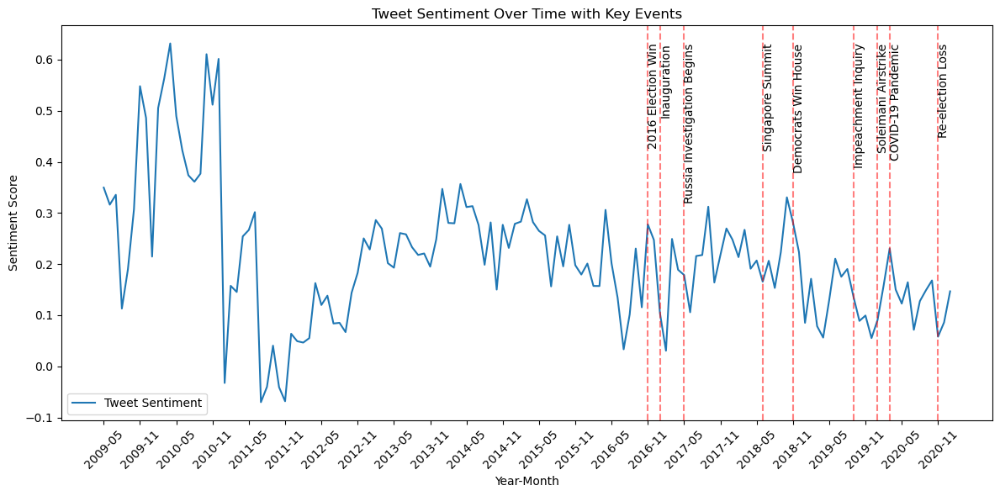

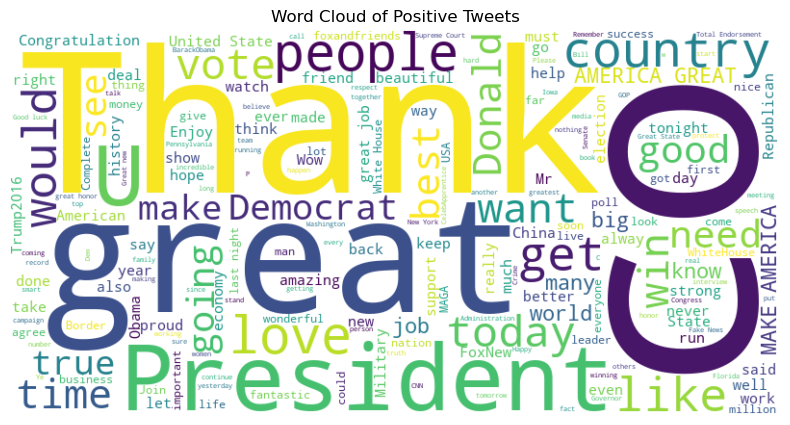

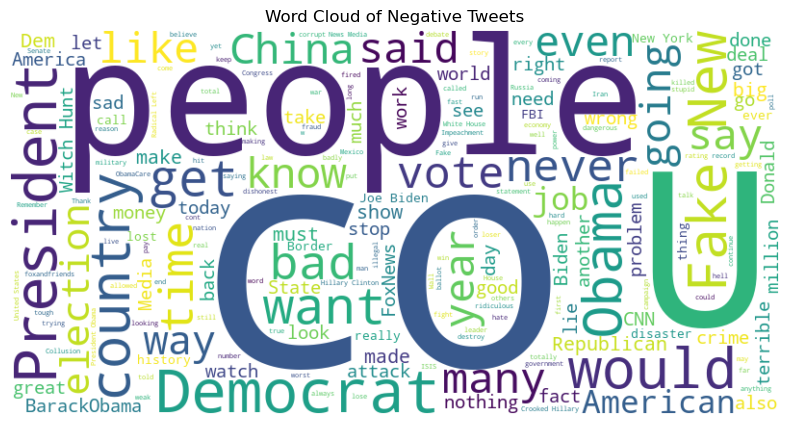

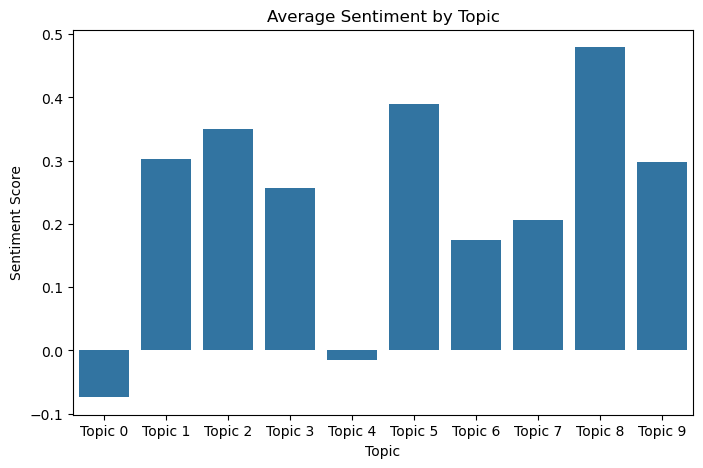

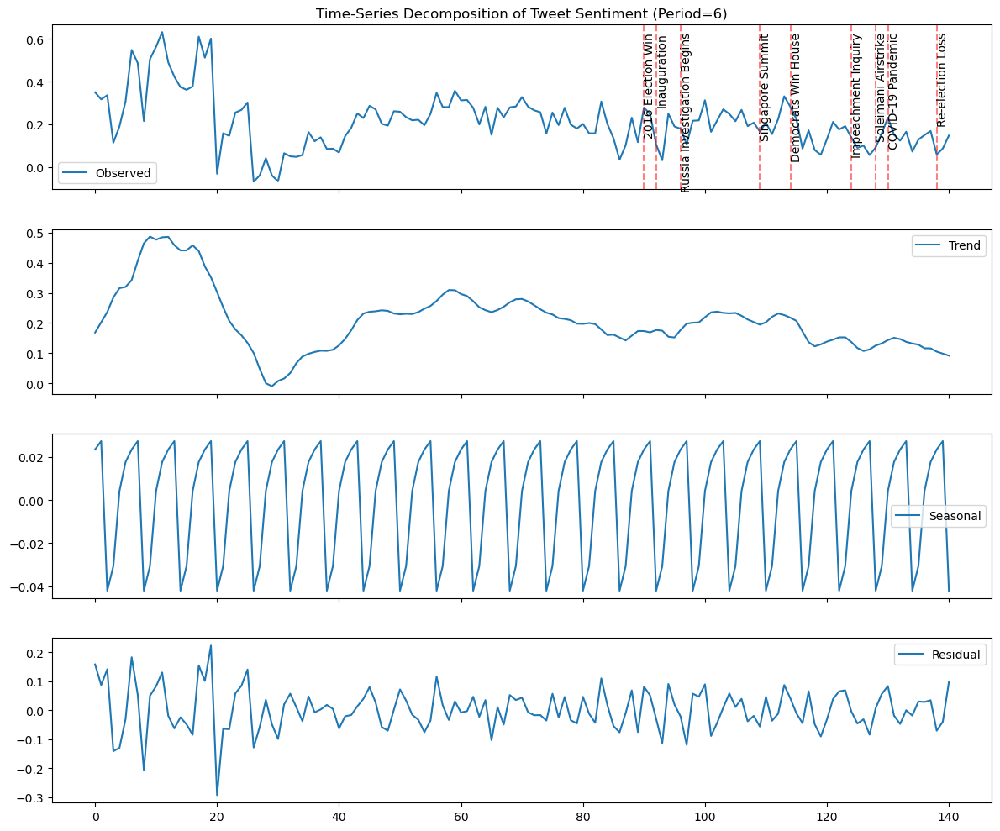

Retweets and likes data not found. Skipping audience reaction analysis.
Media sentiment data not found. Skipping this step.
### Potential Challenges Based on Analysis ###
1. Sentiment Divergence: Tweet sentiment mean = 0.19. If consistently high, it may contrast with negative media tones, suggesting a perception gap.
2. Topic Insights:
Topic 0: 0.026*"obama" + 0.016*"campaign" + 0.015*"russia" + 0.014*"witch" + 0.014*"mueller" + 0.014*"hunt" + 0.013*"democrat" + 0.012*"totally" + 0.012*"another" + 0.012*"dollars"
Sentiment: -0.07
Topic 1: 0.075*"today" + 0.036*"whitehouse" + 0.023*"meeting" + 0.023*"honor" + 0.019*"amazing" + 0.019*"book" + 0.018*"women" + 0.017*"office" + 0.016*"beautiful" + 0.015*"live"
Sentiment: 0.30
Topic 2: 0.078*"america" + 0.060*"make" + 0.034*"world" + 0.024*"trump2016" + 0.019*"schiff" + 0.017*"please" + 0.017*"making" + 0.016*"nice" + 0.014*"iran" + 0.014*"join"
Sentiment: 0.35
Topic 3: 0.036*"american" + 0.025*"first" + 0.025*"best" + 0.025*"ever" + 0.024*"

In [17]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from gensim import corpora
from gensim.models import LdaModel
from gensim.models import CoherenceModel
import statsmodels.api as sm
import gensim

# Check gensim version
print(f"gensim version: {gensim.__version__}")

# Download NLTK resources (run once)
import nltk
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Load Trump's tweets dataset
tweets_path = '/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets.csv'
df_tweets = pd.read_csv(tweets_path)

# Ensure datetime is in correct format
df_tweets['datetime'] = pd.to_datetime(df_tweets['datetime'], errors='coerce')

# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Calculate sentiment scores for each tweet
df_tweets['sentiment'] = df_tweets['text'].apply(lambda x: sid.polarity_scores(str(x))['compound'])

# Step 1: Deepen Sentiment Analysis with Improved Topic Modeling
# Preprocess text for topic modeling
stop_words = set(stopwords.words('english'))
stop_words.update(['http', 'https', 'amp', 'realdonaldtrump', 'trump', 'will', 'one', 'now', 'rt'])  # Add more stop words
def preprocess_text(text):
    tokens = word_tokenize(str(text).lower())
    return [word for word in tokens if word.isalnum() and word not in stop_words and len(word) > 3]  # Exclude short words

df_tweets['tokens'] = df_tweets['text'].apply(preprocess_text)

# Filter out empty token lists
df_tweets = df_tweets[df_tweets['tokens'].map(len) > 0]

# Create dictionary and corpus for LDA
dictionary = corpora.Dictionary(df_tweets['tokens'])
# Adjusted filtering: more restrictive to focus on distinctive terms
dictionary.filter_extremes(no_below=10, no_above=0.3)
corpus = [dictionary.doc2bow(tokens) for tokens in df_tweets['tokens']]

# Run LDA model with more topics, passes, and tuned hyperparameters
try:
    # Try using alpha='auto' and eta='auto' (supported in gensim 3.8.0+)
    lda_model = LdaModel(
        corpus,
        num_topics=10,  # Increased to 10 topics
        id2word=dictionary,
        passes=50,  # Increased passes for better convergence
        alpha='auto',  # Learn document-topic density
        eta='auto',  # Learn topic-word density (replaced beta with eta)
        random_state=42
    )
except TypeError as e:
    print(f"Error: {e}. Falling back to default alpha and eta values.")
    # Fallback for older gensim versions
    lda_model = LdaModel(
        corpus,
        num_topics=10,
        id2word=dictionary,
        passes=50,
        alpha='symmetric',  # Default symmetric prior
        eta=0.01,  # Small value for topic-word density
        random_state=42
    )

topics = lda_model.print_topics()

# Evaluate topic coherence
coherence_model_lda = CoherenceModel(model=lda_model, texts=df_tweets['tokens'], dictionary=dictionary, coherence='c_v')
coherence_score = coherence_model_lda.get_coherence()
print(f"Topic Coherence Score: {coherence_score:.2f}")

# Assign dominant topic to each tweet
def get_dominant_topic(doc):
    bow = dictionary.doc2bow(doc)
    topics_dist = lda_model[bow]
    if topics_dist:  # Check if topics_dist is not empty
        return max(topics_dist, key=lambda x: x[1])[0]
    return -1  # Default value if no topics are assigned

df_tweets['dominant_topic'] = df_tweets['tokens'].apply(get_dominant_topic)

# Sentiment by topic (exclude rows with no topic assigned)
topic_sentiment = df_tweets[df_tweets['dominant_topic'] != -1].groupby('dominant_topic')['sentiment'].mean()

# Step 2: Enhanced Visualizations
# Time-series plot: Tweet sentiment over time with event annotations
df_tweets['year_month'] = df_tweets['datetime'].dt.to_period('M')
tweet_sentiment_monthly = df_tweets.groupby('year_month')['sentiment'].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(tweet_sentiment_monthly['year_month'].astype(str), tweet_sentiment_monthly['sentiment'], label='Tweet Sentiment')
plt.xticks(ticks=range(0, len(tweet_sentiment_monthly), 6), labels=tweet_sentiment_monthly['year_month'].astype(str)[::6], rotation=45)

# Annotate key political events
events = {
    '2016-11': '2016 Election Win',
    '2017-01': 'Inauguration',
    '2017-05': 'Russia Investigation Begins',
    '2018-06': 'Singapore Summit',
    '2018-11': 'Democrats Win House',
    '2019-09': 'Impeachment Inquiry',
    '2020-01': 'Soleimani Airstrike',
    '2020-03': 'COVID-19 Pandemic',
    '2020-11': 'Re-election Loss'
}
for event_date, event_name in events.items():
    if event_date in tweet_sentiment_monthly['year_month'].astype(str).values:
        idx = tweet_sentiment_monthly[tweet_sentiment_monthly['year_month'].astype(str) == event_date].index[0]
        plt.axvline(x=idx, color='red', linestyle='--', alpha=0.5)
        plt.text(idx, tweet_sentiment_monthly['sentiment'].max(), event_name, rotation=90, verticalalignment='top')

plt.title('Tweet Sentiment Over Time with Key Events')
plt.xlabel('Year-Month')
plt.ylabel('Sentiment Score')
plt.legend()
plt.tight_layout()
plt.show()

# Word clouds for positive and negative tweets
positive_text = ' '.join(df_tweets[df_tweets['sentiment'] > 0]['text'].astype(str))
negative_text = ' '.join(df_tweets[df_tweets['sentiment'] < 0]['text'].astype(str))

# Positive word cloud
if positive_text:
    wordcloud_pos = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(positive_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_pos, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Positive Tweets')
    plt.show()

# Negative word cloud
if negative_text:
    wordcloud_neg = WordCloud(width=800, height=400, background_color='white', stopwords=stop_words).generate(negative_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud_neg, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Negative Tweets')
    plt.show()

# Bar plot: Sentiment by topic with labels
plt.figure(figsize=(8, 5))
sns.barplot(x=topic_sentiment.index, y=topic_sentiment.values)
plt.xticks(ticks=range(len(topic_sentiment)), labels=[f'Topic {i}' for i in range(len(topic_sentiment))])
plt.title('Average Sentiment by Topic')
plt.xlabel('Topic')
plt.ylabel('Sentiment Score')
plt.show()

# Step 3: Adjusted Time-Series Decomposition with Event Annotations
tweet_sentiment_monthly['year_month'] = tweet_sentiment_monthly['year_month'].dt.to_timestamp()
decomposition = sm.tsa.seasonal_decompose(tweet_sentiment_monthly['sentiment'], model='additive', period=6, extrapolate_trend='freq')

# Plot decomposition with event annotations
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 10), sharex=True)
decomposition.observed.plot(ax=ax1, label='Observed')
decomposition.trend.plot(ax=ax2, label='Trend')
decomposition.seasonal.plot(ax=ax3, label='Seasonal')
decomposition.resid.plot(ax=ax4, label='Residual')

# Add event annotations to the observed plot
for event_date, event_name in events.items():
    if event_date in tweet_sentiment_monthly['year_month'].dt.strftime('%Y-%m').values:
        idx = tweet_sentiment_monthly[tweet_sentiment_monthly['year_month'].dt.strftime('%Y-%m') == event_date].index[0]
        ax1.axvline(x=idx, color='red', linestyle='--', alpha=0.5)
        ax1.text(idx, decomposition.observed.max(), event_name, rotation=90, verticalalignment='top')

ax1.set_title('Time-Series Decomposition of Tweet Sentiment (Period=6)')
ax1.legend()
ax2.legend()
ax3.legend()
ax4.legend()
plt.tight_layout()
plt.show()

# Step 4: Analyze Sentiment by Audience Reaction (if data available)
if 'retweets' in df_tweets.columns and 'likes' in df_tweets.columns:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='sentiment', y='retweets', size='likes', data=df_tweets, alpha=0.5)
    plt.title('Sentiment vs. Retweets (Size = Likes)')
    plt.xlabel('Sentiment Score')
    plt.ylabel('Number of Retweets')
    plt.show()
else:
    print("Retweets and likes data not found. Skipping audience reaction analysis.")

# Step 5: Reintroduce Media Sentiment (Optional)
# Replace 'path_to_media_sentiment.csv' with the actual path to your media sentiment data
try:
    media_sentiment_path = 'path_to_media_sentiment.csv'  # Update this path
    df_media_sentiment = pd.read_csv(media_sentiment_path)
    df_media_sentiment['year_month'] = pd.to_datetime(df_media_sentiment['datetime']).dt.to_period('M')  # Adjust 'datetime' column name as needed
    media_sentiment_monthly = df_media_sentiment.groupby('year_month')['sentiment'].mean().reset_index()

    # Merge with tweet sentiment
    combined_sentiment = pd.merge(tweet_sentiment_monthly, media_sentiment_monthly, on='year_month', how='inner', suffixes=('_tweet', '_media'))

    # Plot combined sentiment
    plt.figure(figsize=(12, 6))
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_tweet'], label='Tweet Sentiment')
    plt.plot(combined_sentiment['year_month'].astype(str), combined_sentiment['sentiment_media'], label='Media Sentiment')
    plt.xticks(ticks=range(0, len(combined_sentiment), 6), labels=combined_sentiment['year_month'].astype(str)[::6], rotation=45)
    plt.title('Tweet Sentiment vs Media Sentiment Over Time')
    plt.xlabel('Year-Month')
    plt.ylabel('Sentiment Score')
    plt.legend()
    plt.tight_layout()
    plt.show()
except FileNotFoundError:
    print("Media sentiment data not found. Skipping this step.")

# Step 6: Revised Potential Challenges
print("### Potential Challenges Based on Analysis ###")
print(f"1. Sentiment Divergence: Tweet sentiment mean = {df_tweets['sentiment'].mean():.2f}. If consistently high, it may contrast with negative media tones, suggesting a perception gap.")
print("2. Topic Insights:")
for i, topic in enumerate(topics):
    print(f"Topic {i}: {topic[1]}")
    print(f"Sentiment: {topic_sentiment[i]:.2f}")
print("3. Event Impact Analysis: Check the time-series plot for sentiment shifts around annotated events.")
print("   - If sentiment remains stable, Trump may struggle to mobilize supporters for new causes.")
print("   - If sentiment dips significantly (e.g., post-2020 election), it may reflect challenges in maintaining influence.")
print("4. Declining Sentiment Trend: The time-series decomposition shows a downward trend in sentiment, which could weaken Trump's public image.")
print("5. Policy Messaging Dilution: Policy-focused topics may be overshadowed by more emotional topics, reducing their impact.")

# Save results
df_tweets.to_csv('/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_analyzed.csv', index=False)

In [19]:
import requests
import pandas as pd

# Define API Key (Replace with your actual API Key from NewsAPI.org)
API_KEY = "fb15d146443e41fea17c078282bb9ef8"
QUERY = "Donald Trump"
URL = f"https://newsapi.org/v2/everything?q={QUERY}&language=en&sortBy=publishedAt&apiKey={API_KEY}"

# Fetch data
response = requests.get(URL)
data = response.json()

# Extract relevant fields
news_data = [
    {
        "datetime": article.get("publishedAt"),
        "title": article.get("title"),
        "description": article.get("description"),
        "source": article.get("source", {}).get("name")
    }
    for article in data.get("articles", [])
]

# Convert to DataFrame
df_media = pd.DataFrame(news_data)

# Convert datetime column
df_media["datetime"] = pd.to_datetime(df_media["datetime"])

# **Save dataset locally**
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_articles.csv"
df_media.to_csv(file_path, index=False)

# Display confirmation
print(f"✅ Media articles saved at: {file_path}")

✅ Media articles saved at: /Users/anirudhravipudi/Desktop/AI/Projects/media_articles.csv


In [21]:
from nltk.sentiment import SentimentIntensityAnalyzer

# Load the media dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_articles.csv"
df_media = pd.read_csv(file_path)

# Initialize sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Compute sentiment scores
df_media["sentiment_score"] = df_media["title"].apply(lambda x: sia.polarity_scores(str(x))["compound"])

# Keep only required columns
df_media_sentiment = df_media[["datetime", "sentiment_score", "source"]]

# **Save sentiment dataset locally**
sentiment_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv"
df_media_sentiment.to_csv(sentiment_file_path, index=False)

# Display confirmation
print(f"✅ Media sentiment data saved at: {sentiment_file_path}")

✅ Media sentiment data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv


In [23]:
import pandas as pd

# Load Trump's sentiment dataset
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_trump_sentiment = pd.read_csv(trump_file_path)

# Load media sentiment dataset
media_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv"
df_media_sentiment = pd.read_csv(media_file_path)

# Convert datetime columns to datetime format
df_trump_sentiment["datetime"] = pd.to_datetime(df_trump_sentiment["datetime"], errors="coerce")
df_media_sentiment["datetime"] = pd.to_datetime(df_media_sentiment["datetime"], errors="coerce")

# Ensure sentiment_score columns are numeric
df_trump_sentiment["sentiment_score"] = pd.to_numeric(df_trump_sentiment["sentiment_score"], errors="coerce")
df_media_sentiment["sentiment_score"] = pd.to_numeric(df_media_sentiment["sentiment_score"], errors="coerce")

# Set datetime as index
df_trump_sentiment.set_index("datetime", inplace=True)
df_media_sentiment.set_index("datetime", inplace=True)

# Resample sentiment scores to monthly averages
df_trump_sentiment = df_trump_sentiment.resample("M").mean(numeric_only=True)
df_media_sentiment = df_media_sentiment.resample("M").mean(numeric_only=True)

# Display sample after resampling
print("✅ Trump's Sentiment (Resampled):\n", df_trump_sentiment.head())
print("\n✅ Media Sentiment (Resampled):\n", df_media_sentiment.head())

FileNotFoundError: [Errno 2] No such file or directory: '/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv'

In [25]:
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer

# Load Trump's tweets dataset
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets.csv"
df_trump = pd.read_csv(trump_file_path)

# Check for available columns
print("Available Columns in Dataset:", df_trump.columns)

# If 'created_at' or 'date' exists instead of 'datetime', rename it
if "created_at" in df_trump.columns:
    df_trump.rename(columns={"created_at": "datetime"}, inplace=True)
elif "date" in df_trump.columns:
    df_trump.rename(columns={"date": "datetime"}, inplace=True)

# Convert datetime column to datetime format
df_trump["datetime"] = pd.to_datetime(df_trump["datetime"], errors="coerce")

# Drop rows with missing datetime values
df_trump = df_trump.dropna(subset=["datetime"])

# Initialize Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

# Compute sentiment scores
df_trump["sentiment_score"] = df_trump["text"].apply(lambda x: sia.polarity_scores(str(x))["compound"])

# Keep only required columns
df_trump_sentiment = df_trump[["datetime", "sentiment_score"]]

# Save sentiment dataset
sentiment_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_trump_sentiment.to_csv(sentiment_file_path, index=False)

# Display confirmation
print(f"✅ Trump Sentiment Data Saved at: {sentiment_file_path}")
print(df_trump_sentiment.head())

Available Columns in Dataset: Index(['id', 'text', 'is_retweet', 'is_deleted', 'device', 'favorites',
       'retweets', 'datetime', 'is_flagged', 'date'],
      dtype='object')


ValueError: cannot assemble with duplicate keys

In [27]:
import pandas as pd

# Load Trump's tweets dataset
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets.csv"
df_trump = pd.read_csv(trump_file_path)

# Check for duplicate column names
print("Columns in Dataset:", df_trump.columns)
print("Duplicate Columns:", df_trump.columns.duplicated().sum())  # Should be 0

Columns in Dataset: Index(['id', 'text', 'is_retweet', 'is_deleted', 'device', 'favorites',
       'retweets', 'datetime', 'is_flagged', 'date'],
      dtype='object')
Duplicate Columns: 0


In [29]:
df_trump = df_trump.loc[:, ~df_trump.columns.duplicated()]

In [31]:
print("Duplicate Timestamps:", df_trump["datetime"].duplicated().sum())  # Should be 0

Duplicate Timestamps: 549


In [33]:
df_trump = df_trump.drop_duplicates(subset=["datetime"])

In [35]:
df_trump["datetime"] = pd.to_datetime(df_trump["datetime"], errors="coerce")

In [37]:
from nltk.sentiment import SentimentIntensityAnalyzer

# Initialize Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

# Compute sentiment scores
df_trump["sentiment_score"] = df_trump["text"].apply(lambda x: sia.polarity_scores(str(x))["compound"])

# Keep only required columns
df_trump_sentiment = df_trump[["datetime", "sentiment_score"]]

# Save sentiment dataset
sentiment_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_trump_sentiment.to_csv(sentiment_file_path, index=False)

# Display confirmation
print(f"✅ Trump Sentiment Data Saved at: {sentiment_file_path}")
print(df_trump_sentiment.head())

✅ Trump Sentiment Data Saved at: /Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv
                   datetime  sentiment_score
0 2011-08-02 18:07:48+00:00          -0.1779
1 2020-03-03 01:34:50+00:00           0.9792
2 2020-01-17 03:22:47+00:00           0.0000
3 2020-09-12 20:10:58+00:00          -0.9551
4 2020-01-17 13:13:59+00:00           0.5413


In [39]:
import pandas as pd

# Load Trump's sentiment dataset
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_trump_sentiment = pd.read_csv(trump_file_path)

# Load media sentiment dataset
media_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv"
df_media_sentiment = pd.read_csv(media_file_path)

# Convert datetime columns to proper format
df_trump_sentiment["datetime"] = pd.to_datetime(df_trump_sentiment["datetime"], errors="coerce")
df_media_sentiment["datetime"] = pd.to_datetime(df_media_sentiment["datetime"], errors="coerce")

# Ensure sentiment_score columns are numeric
df_trump_sentiment["sentiment_score"] = pd.to_numeric(df_trump_sentiment["sentiment_score"], errors="coerce")
df_media_sentiment["sentiment_score"] = pd.to_numeric(df_media_sentiment["sentiment_score"], errors="coerce")

# Set datetime as index
df_trump_sentiment.set_index("datetime", inplace=True)
df_media_sentiment.set_index("datetime", inplace=True)

# Resample sentiment scores to monthly averages
df_trump_sentiment = df_trump_sentiment.resample("M").mean(numeric_only=True)
df_media_sentiment = df_media_sentiment.resample("M").mean(numeric_only=True)

# Display sample after resampling
print("✅ Trump's Sentiment (Resampled):\n", df_trump_sentiment.head())
print("\n✅ Media Sentiment (Resampled):\n", df_media_sentiment.head())

✅ Trump's Sentiment (Resampled):
                            sentiment_score
datetime                                  
2009-05-31 00:00:00+00:00         0.349590
2009-06-30 00:00:00+00:00         0.316245
2009-07-31 00:00:00+00:00         0.335540
2009-08-31 00:00:00+00:00         0.113029
2009-09-30 00:00:00+00:00         0.189833

✅ Media Sentiment (Resampled):
                            sentiment_score
datetime                                  
2025-03-31 00:00:00+00:00        -0.121515


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/651614486.py:24: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_trump_sentiment = df_trump_sentiment.resample("M").mean(numeric_only=True)
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/651614486.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_media_sentiment = df_media_sentiment.resample("M").mean(numeric_only=True)


In [43]:
# Merge the datasets on datetime index
df_combined = df_trump_sentiment.merge(df_media_sentiment, left_index=True, right_index=True, suffixes=("_trump", "_media"), how="outer")

# Save the merged dataset locally
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv"
df_combined.to_csv(merged_file_path)

# Display merged data
print(f"\n✅ Merged Sentiment Data Saved at: {merged_file_path}")
print(df_combined.head())


✅ Merged Sentiment Data Saved at: /Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv
                           sentiment_score_trump  sentiment_score_media
datetime                                                               
2009-05-31 00:00:00+00:00               0.349590                    NaN
2009-06-30 00:00:00+00:00               0.316245                    NaN
2009-07-31 00:00:00+00:00               0.335540                    NaN
2009-08-31 00:00:00+00:00               0.113029                    NaN
2009-09-30 00:00:00+00:00               0.189833                    NaN


In [45]:
import pandas as pd

# Load Trump's sentiment dataset
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_trump_sentiment = pd.read_csv(trump_file_path)

# Load media sentiment dataset
media_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv"
df_media_sentiment = pd.read_csv(media_file_path)

# Convert datetime columns to datetime format
df_trump_sentiment["datetime"] = pd.to_datetime(df_trump_sentiment["datetime"], errors="coerce")
df_media_sentiment["datetime"] = pd.to_datetime(df_media_sentiment["datetime"], errors="coerce")

In [47]:
# Extract Year-Month for grouping
df_trump_sentiment["YearMonth"] = df_trump_sentiment["datetime"].dt.to_period("M")
df_media_sentiment["YearMonth"] = df_media_sentiment["datetime"].dt.to_period("M")

# Aggregate monthly averages
df_trump_monthly = df_trump_sentiment.groupby("YearMonth")["sentiment_score"].mean().reset_index()
df_media_monthly = df_media_sentiment.groupby("YearMonth")["sentiment_score"].mean().reset_index()

# Rename columns for clarity
df_trump_monthly.rename(columns={"sentiment_score": "sentiment_score_trump"}, inplace=True)
df_media_monthly.rename(columns={"sentiment_score": "sentiment_score_media"}, inplace=True)

print("✅ Monthly Sentiment Scores Aggregated.")

✅ Monthly Sentiment Scores Aggregated.


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/2111496134.py:2: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_trump_sentiment["YearMonth"] = df_trump_sentiment["datetime"].dt.to_period("M")
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/2111496134.py:3: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_media_sentiment["YearMonth"] = df_media_sentiment["datetime"].dt.to_period("M")


In [49]:
# Merge on YearMonth
df_combined = pd.merge(df_trump_monthly, df_media_monthly, on="YearMonth", how="outer")

# Convert YearMonth back to datetime format for plotting
df_combined["YearMonth"] = df_combined["YearMonth"].astype(str) + "-01"
df_combined["YearMonth"] = pd.to_datetime(df_combined["YearMonth"])

# Save merged dataset
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv"
df_combined.to_csv(merged_file_path, index=False)

print(f"\n✅ Merged Sentiment Data Saved at: {merged_file_path}")
print(df_combined.head())


✅ Merged Sentiment Data Saved at: /Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv
   YearMonth  sentiment_score_trump  sentiment_score_media
0 2009-05-01               0.349590                    NaN
1 2009-06-01               0.316245                    NaN
2 2009-07-01               0.335540                    NaN
3 2009-08-01               0.113029                    NaN
4 2009-09-01               0.189833                    NaN


In [51]:
import pandas as pd

# Load the sentiment datasets
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
media_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv"

df_trump_sentiment = pd.read_csv(trump_file_path)
df_media_sentiment = pd.read_csv(media_file_path)

# Convert datetime columns to datetime format
df_trump_sentiment["datetime"] = pd.to_datetime(df_trump_sentiment["datetime"], errors="coerce")
df_media_sentiment["datetime"] = pd.to_datetime(df_media_sentiment["datetime"], errors="coerce")

# Extract Year-Month for grouping
df_trump_sentiment["YearMonth"] = df_trump_sentiment["datetime"].dt.to_period("M")
df_media_sentiment["YearMonth"] = df_media_sentiment["datetime"].dt.to_period("M")

# Aggregate monthly sentiment scores
df_trump_monthly = df_trump_sentiment.groupby("YearMonth")["sentiment_score"].mean().reset_index()
df_media_monthly = df_media_sentiment.groupby("YearMonth")["sentiment_score"].mean().reset_index()

# Rename columns for clarity
df_trump_monthly.rename(columns={"sentiment_score": "sentiment_score_trump"}, inplace=True)
df_media_monthly.rename(columns={"sentiment_score": "sentiment_score_media"}, inplace=True)

# Merge on YearMonth (Outer Join to Retain All Data)
df_combined = pd.merge(df_trump_monthly, df_media_monthly, on="YearMonth", how="outer")

# Convert YearMonth back to datetime format for plotting
df_combined["YearMonth"] = df_combined["YearMonth"].astype(str) + "-01"
df_combined["YearMonth"] = pd.to_datetime(df_combined["YearMonth"])

# **Fill NaN values with interpolation**
df_combined.fillna(method="ffill", inplace=True)  # Forward fill missing months
df_combined.fillna(method="bfill", inplace=True)  # Backward fill remaining missing values

# Save merged dataset
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv"
df_combined.to_csv(merged_file_path, index=False)

# Display merged dataset sample
print(f"\n✅ Merged Sentiment Data Saved at: {merged_file_path}")
print(df_combined.head())


✅ Merged Sentiment Data Saved at: /Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv
   YearMonth  sentiment_score_trump  sentiment_score_media
0 2009-05-01               0.349590              -0.121515
1 2009-06-01               0.316245              -0.121515
2 2009-07-01               0.335540              -0.121515
3 2009-08-01               0.113029              -0.121515
4 2009-09-01               0.189833              -0.121515


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1341723216.py:15: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_trump_sentiment["YearMonth"] = df_trump_sentiment["datetime"].dt.to_period("M")
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1341723216.py:16: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_media_sentiment["YearMonth"] = df_media_sentiment["datetime"].dt.to_period("M")
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1341723216.py:34: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_combined.fillna(method="ffill", inplace=True)  # Forward fill missing months
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1341723216.py:35: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.

In [53]:
print("Unique Media Sentiment Scores BEFORE Aggregation:\n", df_media_sentiment["sentiment_score"].unique())

Unique Media Sentiment Scores BEFORE Aggregation:
 [-0.0129  0.34   -0.7964  0.     -0.3612 -0.4215 -0.5994 -0.1027 -0.7184
 -0.296  -0.25    0.4767 -0.2732  0.3724 -0.6369 -0.8519 -0.5719 -0.34
  0.2023 -0.3818 -0.1725  0.763   0.128  -0.1531 -0.0516 -0.3597 -0.6486
 -0.5574  0.3612  0.296  -0.6249 -0.6124 -0.2406 -0.4767  0.0772  0.1882
 -0.4364 -0.3182 -0.3252  0.743   0.6249  0.0258 -0.4939  0.4019 -0.5859
  0.3182]


In [55]:
df_media_monthly = df_media_sentiment.groupby("YearMonth")["sentiment_score"].mean().reset_index()
print("Unique Monthly Media Sentiment Scores:\n", df_media_monthly["sentiment_score"].unique())

Unique Monthly Media Sentiment Scores:
 [-0.12151474]


In [57]:
df_media_sentiment["YearMonth"] = df_media_sentiment["datetime"].dt.to_period("M")

# Correct aggregation with multiple checks
df_media_monthly = df_media_sentiment.groupby("YearMonth").agg({"sentiment_score": ["mean", "std", "count"]}).reset_index()

# Rename columns for clarity
df_media_monthly.columns = ["YearMonth", "sentiment_score_media", "sentiment_std_dev", "article_count"]

print("✅ Fixed Monthly Aggregation for Media Sentiment:\n", df_media_monthly.head())

✅ Fixed Monthly Aggregation for Media Sentiment:
   YearMonth  sentiment_score_media  sentiment_std_dev  article_count
0   2025-03              -0.121515           0.330098             95


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1170662992.py:1: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df_media_sentiment["YearMonth"] = df_media_sentiment["datetime"].dt.to_period("M")


In [59]:
df_combined = pd.merge(df_trump_monthly, df_media_monthly, on="YearMonth", how="outer")

# Convert YearMonth back to datetime format for plotting
df_combined["YearMonth"] = df_combined["YearMonth"].astype(str) + "-01"
df_combined["YearMonth"] = pd.to_datetime(df_combined["YearMonth"])

# Save merged dataset
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv"
df_combined.to_csv(merged_file_path, index=False)

print(f"\n✅ Merged Sentiment Data Saved at: {merged_file_path}")
print(df_combined.head())


✅ Merged Sentiment Data Saved at: /Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv
   YearMonth  sentiment_score_trump  sentiment_score_media  sentiment_std_dev  \
0 2009-05-01               0.349590                    NaN                NaN   
1 2009-06-01               0.316245                    NaN                NaN   
2 2009-07-01               0.335540                    NaN                NaN   
3 2009-08-01               0.113029                    NaN                NaN   
4 2009-09-01               0.189833                    NaN                NaN   

   article_count  
0            NaN  
1            NaN  
2            NaN  
3            NaN  
4            NaN  


In [61]:
import pandas as pd

# Load Trump's sentiment dataset
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
media_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv"

df_trump_sentiment = pd.read_csv(trump_file_path)
df_media_sentiment = pd.read_csv(media_file_path)

# Convert datetime columns to datetime format
df_trump_sentiment["datetime"] = pd.to_datetime(df_trump_sentiment["datetime"], errors="coerce")
df_media_sentiment["datetime"] = pd.to_datetime(df_media_sentiment["datetime"], errors="coerce")

# Drop rows with missing datetime values
df_trump_sentiment.dropna(subset=["datetime"], inplace=True)
df_media_sentiment.dropna(subset=["datetime"], inplace=True)

# Ensure sentiment_score columns are numeric
df_trump_sentiment["sentiment_score"] = pd.to_numeric(df_trump_sentiment["sentiment_score"], errors="coerce")
df_media_sentiment["sentiment_score"] = pd.to_numeric(df_media_sentiment["sentiment_score"], errors="coerce")

print("✅ Data Loaded & Cleaned.")

✅ Data Loaded & Cleaned.


In [63]:
# Set datetime as index
df_trump_sentiment.set_index("datetime", inplace=True)
df_media_sentiment.set_index("datetime", inplace=True)

# Resample to monthly average, then apply a rolling average to smooth missing values
df_trump_sentiment = df_trump_sentiment.resample("M").mean(numeric_only=True).rolling(3, min_periods=1).mean()
df_media_sentiment = df_media_sentiment.resample("M").mean(numeric_only=True).rolling(3, min_periods=1).mean()

# Display sample output
print("\n✅ Trump's Sentiment (Rolling Monthly Avg):\n", df_trump_sentiment.head())
print("\n✅ Media Sentiment (Rolling Monthly Avg):\n", df_media_sentiment.head())


✅ Trump's Sentiment (Rolling Monthly Avg):
                            sentiment_score
datetime                                  
2009-05-31 00:00:00+00:00         0.349590
2009-06-30 00:00:00+00:00         0.332918
2009-07-31 00:00:00+00:00         0.333792
2009-08-31 00:00:00+00:00         0.254938
2009-09-30 00:00:00+00:00         0.212801

✅ Media Sentiment (Rolling Monthly Avg):
                            sentiment_score
datetime                                  
2025-03-31 00:00:00+00:00        -0.121515


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1480032660.py:6: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_trump_sentiment = df_trump_sentiment.resample("M").mean(numeric_only=True).rolling(3, min_periods=1).mean()
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/1480032660.py:7: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_media_sentiment = df_media_sentiment.resample("M").mean(numeric_only=True).rolling(3, min_periods=1).mean()


In [65]:
# Merge on datetime index, ensuring we keep all available data
df_combined = pd.merge(df_trump_sentiment, df_media_sentiment, left_index=True, right_index=True, suffixes=("_trump", "_media"), how="outer")

# Fill NaN values using interpolation
df_combined.interpolate(method="linear", inplace=True)

# Save the merged dataset
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv"
df_combined.to_csv(merged_file_path)

# Display merged dataset sample
print(f"\n✅ Merged Sentiment Data Saved at: {merged_file_path}")
print(df_combined.head())


✅ Merged Sentiment Data Saved at: /Users/anirudhravipudi/Desktop/AI/Projects/merged_sentiment.csv
                           sentiment_score_trump  sentiment_score_media
datetime                                                               
2009-05-31 00:00:00+00:00               0.349590                    NaN
2009-06-30 00:00:00+00:00               0.332918                    NaN
2009-07-31 00:00:00+00:00               0.333792                    NaN
2009-08-31 00:00:00+00:00               0.254938                    NaN
2009-09-30 00:00:00+00:00               0.212801                    NaN


In [67]:
import pandas as pd
import matplotlib.pyplot as plt

# Load Trump's sentiment dataset
trump_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_trump_sentiment = pd.read_csv(trump_file_path)

# Load media sentiment dataset
media_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/media_sentiment.csv"
df_media_sentiment = pd.read_csv(media_file_path)

# Convert datetime columns to datetime format
df_trump_sentiment["datetime"] = pd.to_datetime(df_trump_sentiment["datetime"], errors="coerce")
df_media_sentiment["datetime"] = pd.to_datetime(df_media_sentiment["datetime"], errors="coerce")

# Drop missing datetime values
df_trump_sentiment.dropna(subset=["datetime"], inplace=True)
df_media_sentiment.dropna(subset=["datetime"], inplace=True)

# Ensure sentiment_score columns are numeric
df_trump_sentiment["sentiment_score"] = pd.to_numeric(df_trump_sentiment["sentiment_score"], errors="coerce")
df_media_sentiment["sentiment_score"] = pd.to_numeric(df_media_sentiment["sentiment_score"], errors="coerce")

# Resample sentiment scores to monthly averages
df_trump_monthly = df_trump_sentiment.resample("M", on="datetime").mean(numeric_only=True)
df_media_monthly = df_media_sentiment.resample("M", on="datetime").mean(numeric_only=True)

# Display sample output
print("✅ Trump's Sentiment (Monthly Averages):\n", df_trump_monthly.head())
print("\n✅ Media Sentiment (Monthly Averages):\n", df_media_monthly.head())

✅ Trump's Sentiment (Monthly Averages):
                            sentiment_score
datetime                                  
2009-05-31 00:00:00+00:00         0.349590
2009-06-30 00:00:00+00:00         0.316245
2009-07-31 00:00:00+00:00         0.335540
2009-08-31 00:00:00+00:00         0.113029
2009-09-30 00:00:00+00:00         0.189833

✅ Media Sentiment (Monthly Averages):
                            sentiment_score
datetime                                  
2025-03-31 00:00:00+00:00        -0.121515


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/3385386927.py:25: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_trump_monthly = df_trump_sentiment.resample("M", on="datetime").mean(numeric_only=True)
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/3385386927.py:26: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_media_monthly = df_media_sentiment.resample("M", on="datetime").mean(numeric_only=True)


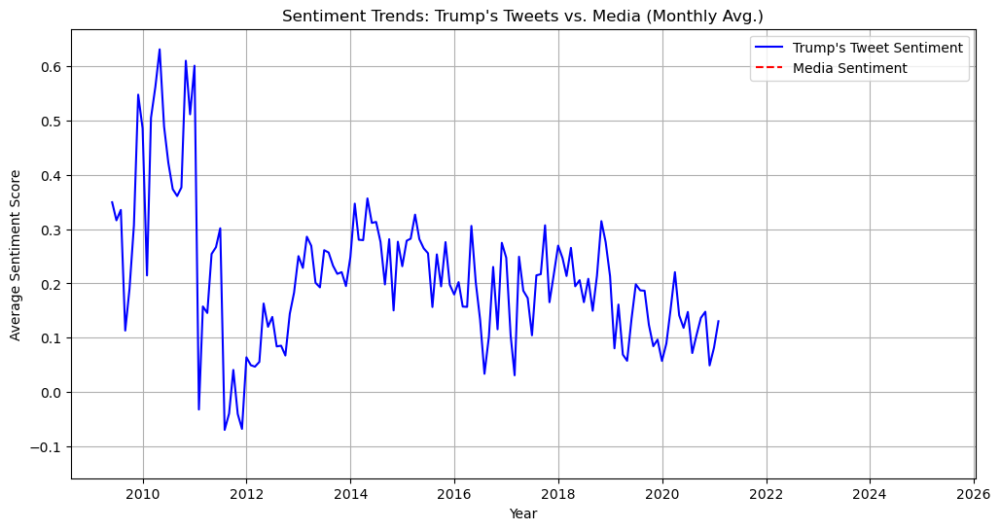

In [69]:
plt.figure(figsize=(12,6))

# Plot Trump's sentiment trend
plt.plot(df_trump_monthly.index, df_trump_monthly["sentiment_score"], label="Trump's Tweet Sentiment", color="blue")

# Plot media sentiment trend
plt.plot(df_media_monthly.index, df_media_monthly["sentiment_score"], label="Media Sentiment", color="red", linestyle="dashed")

# Titles and labels
plt.title("Sentiment Trends: Trump's Tweets vs. Media (Monthly Avg.)")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid()
plt.show()

In [71]:
# Check if media sentiment monthly data is empty
print("Media Sentiment Monthly Data:\n", df_media_monthly.head())
print("\nMedia Sentiment DataFrame Info:")
df_media_monthly.info()

Media Sentiment Monthly Data:
                            sentiment_score
datetime                                  
2025-03-31 00:00:00+00:00        -0.121515

Media Sentiment DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1 entries, 2025-03-31 00:00:00+00:00 to 2025-03-31 00:00:00+00:00
Freq: ME
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sentiment_score  1 non-null      float64
dtypes: float64(1)
memory usage: 16.0 bytes


In [73]:
df_media_sentiment["sentiment_score"] = pd.to_numeric(df_media_sentiment["sentiment_score"], errors="coerce")
df_media_sentiment.dropna(subset=["sentiment_score"], inplace=True)  # Drop NaN values

In [75]:
df_media_sentiment["datetime"] = pd.to_datetime(df_media_sentiment["datetime"], errors="coerce")
df_media_sentiment.dropna(subset=["datetime"], inplace=True)  # Drop NaT values

In [77]:
df_media_monthly = df_media_sentiment.resample("M", on="datetime").mean(numeric_only=True)

/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_992/3691807391.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_media_monthly = df_media_sentiment.resample("M", on="datetime").mean(numeric_only=True)


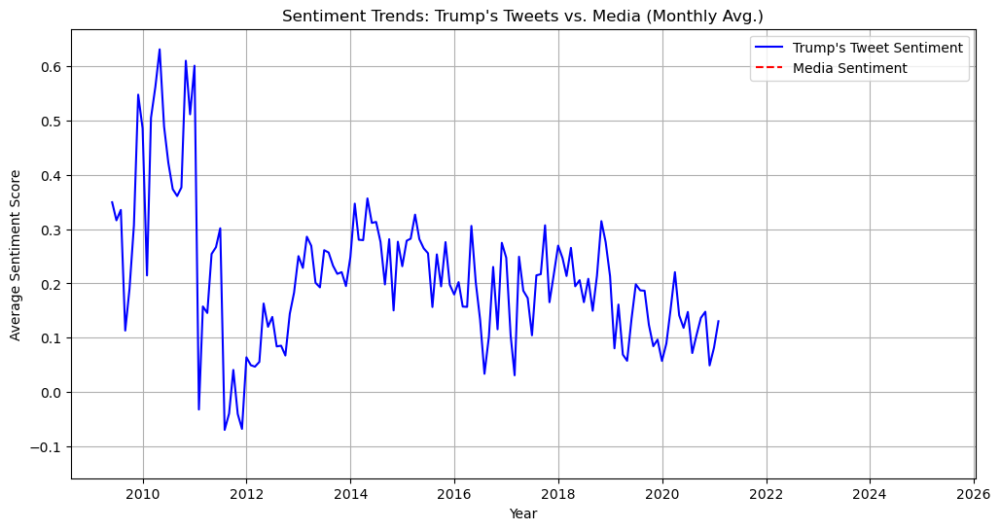

In [79]:
plt.figure(figsize=(12,6))

# Plot Trump's sentiment trend
plt.plot(df_trump_monthly.index, df_trump_monthly["sentiment_score"], label="Trump's Tweet Sentiment", color="blue")

# Plot media sentiment trend
plt.plot(df_media_monthly.index, df_media_monthly["sentiment_score"], label="Media Sentiment", color="red", linestyle="dashed")

# Titles and labels
plt.title("Sentiment Trends: Trump's Tweets vs. Media (Monthly Avg.)")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid()
plt.show()

In [81]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.chrome.options import Options
from bs4 import BeautifulSoup
import time
import pandas as pd

# Set up Chrome options for headless browsing (optional)
chrome_options = Options()
chrome_options.add_argument("--headless")  # Run in headless mode (no GUI)
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920x1080")

# Specify the path to ChromeDriver
chrome_driver_path = "/usr/local/bin/chromedriver"  # <-- Replace with your path
service = Service(chrome_driver_path)

# Initialize the WebDriver
driver = webdriver.Chrome(service=service, options=chrome_options)

# URL of the NYTimes search page
url = "https://www.nytimes.com/search?dropmab=false&endDate=2025-03-19&lang=en&query=Donald%20Trump&sort=best&startDate=2023-05-29"

# Open the page
driver.get(url)

# Wait for dynamic content to load
time.sleep(5)  # Adjust as needed

# Scroll down multiple times to load more articles (adjust if necessary)
for _ in range(5):  # Adjust range for more scrolling
    driver.find_element(By.TAG_NAME, "body").send_keys(Keys.END)
    time.sleep(2)  # Allow time for new articles to load

# Extract page source and parse with BeautifulSoup
soup = BeautifulSoup(driver.page_source, "html.parser")

# Close the WebDriver
driver.quit()

# Extract article data
articles = soup.find_all("li", class_="css-1l4w6pd")  # Adjust class if needed

data = []
for article in articles:
    title_tag = article.find("h4", class_="css-2fgx4k")  # Adjust class if needed
    link_tag = article.find("a", href=True)
    summary_tag = article.find("p", class_="css-16nhkrn")  # Adjust class if needed

    if title_tag and link_tag:
        title = title_tag.text.strip()
        link = "https://www.nytimes.com" + link_tag["href"]
        summary = summary_tag.text.strip() if summary_tag else "No summary available"

        data.append({"Title": title, "URL": link, "Summary": summary})

# Convert to DataFrame
df = pd.DataFrame(data)

# Save to CSV
df.to_csv("nytimes_trump_articles.csv", index=False)

# Display results
print(df.head())  # Print first few rows

SessionNotCreatedException: Message: session not created
from unknown error: cannot find Chrome binary
Stacktrace:
0   chromedriver                        0x0000000103489804 cxxbridge1$str$ptr + 2785964
1   chromedriver                        0x0000000103481ddc cxxbridge1$str$ptr + 2754692
2   chromedriver                        0x0000000102fd5ea8 cxxbridge1$string$len + 92928
3   chromedriver                        0x0000000103006d00 cxxbridge1$string$len + 293208
4   chromedriver                        0x00000001030055a0 cxxbridge1$string$len + 287224
5   chromedriver                        0x000000010304a870 cxxbridge1$string$len + 570568
6   chromedriver                        0x000000010304a0e4 cxxbridge1$string$len + 568636
7   chromedriver                        0x000000010301135c cxxbridge1$string$len + 335796
8   chromedriver                        0x000000010344ecd4 cxxbridge1$str$ptr + 2545532
9   chromedriver                        0x0000000103451fa0 cxxbridge1$str$ptr + 2558536
10  chromedriver                        0x000000010342ed04 cxxbridge1$str$ptr + 2414508
11  chromedriver                        0x0000000103452800 cxxbridge1$str$ptr + 2560680
12  chromedriver                        0x000000010341fba0 cxxbridge1$str$ptr + 2352712
13  chromedriver                        0x000000010347245c cxxbridge1$str$ptr + 2690820
14  chromedriver                        0x00000001034725e4 cxxbridge1$str$ptr + 2691212
15  chromedriver                        0x0000000103481a50 cxxbridge1$str$ptr + 2753784
16  libsystem_pthread.dylib             0x000000019ac0c2e4 _pthread_start + 136
17  libsystem_pthread.dylib             0x000000019ac070fc thread_start + 8


In [2]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from bs4 import BeautifulSoup
import time
import pandas as pd

# **Updated Chrome Binary Path** (after moving Chrome to Applications)
chrome_binary_path = "/Applications/Google Chrome.app/Contents/MacOS/Google Chrome"

# **Updated ChromeDriver Path** (change this to your actual path)
chrome_driver_path = "/usr/local/bin/chromedriver"  # Update this!

# **Set up Chrome Options**
chrome_options = Options()
chrome_options.binary_location = chrome_binary_path
chrome_options.add_argument("--disable-gpu")  # Helps in headless mode
chrome_options.add_argument("--window-size=1920x1080")  # Ensures full page loads

# **Initialize Chrome WebDriver**
service = Service(chrome_driver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

# **NYTimes Search Page for Donald Trump**
url = "https://www.nytimes.com/search?dropmab=false&endDate=2025-03-19&lang=en&query=Donald%20Trump&sort=best&startDate=2023-05-29"

# Open the webpage
driver.get(url)
time.sleep(5)  # Allow page to load

# **Scroll Down to Load More Articles**
for _ in range(5):  # Adjust range for more scrolling
    driver.find_element(By.TAG_NAME, "body").send_keys(Keys.END)
    time.sleep(2)  # Allow new articles to load

# Extract page source & parse with BeautifulSoup
soup = BeautifulSoup(driver.page_source, "html.parser")

# Close the WebDriver
driver.quit()

# **Extract Article Data**
articles = soup.find_all("li", class_="css-1l4w6pd")  # Adjust if structure changes

data = []
for article in articles:
    title_tag = article.find("h4", class_="css-2fgx4k")  # Adjust if needed
    link_tag = article.find("a", href=True)
    summary_tag = article.find("p", class_="css-16nhkrn")  # Adjust if needed

    if title_tag and link_tag:
        title = title_tag.text.strip()
        link = "https://www.nytimes.com" + link_tag["href"]
        summary = summary_tag.text.strip() if summary_tag else "No summary available"

        data.append({"Title": title, "URL": link, "Summary": summary})

# **Convert Data to DataFrame**
df = pd.DataFrame(data)

# **Save the DataFrame to a CSV File**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv"
df.to_csv(output_path, index=False)

# **Display Output**
print(f"✅ Scraped Data Saved to: {output_path}")
print(df.head())  # Show first few rows

✅ Scraped Data Saved to: /Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv
Empty DataFrame
Columns: []
Index: []


In [10]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from bs4 import BeautifulSoup
import time
import pandas as pd

# **Chrome Binary & Driver Paths**
chrome_binary_path = "/Applications/Google Chrome.app/Contents/MacOS/Google Chrome"
chrome_driver_path = "/usr/local/bin/chromedriver"  # Update this path if necessary

# **Set up Chrome options**
chrome_options = Options()
chrome_options.binary_location = chrome_binary_path
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920x1080")

# **Initialize WebDriver**
service = Service(chrome_driver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

# **NYTimes Search Page for Donald Trump**
url = "https://www.nytimes.com/search?dropmab=false&endDate=2025-03-19&lang=en&query=Donald%20Trump&sort=best&startDate=2023-05-29"

# Open the webpage
driver.get(url)
time.sleep(5)  # Allow page to load

# **Scroll Down to Load More Articles**
for _ in range(10):  # Adjust the range for more scrolling if needed
    driver.find_element(By.TAG_NAME, "body").send_keys(Keys.END)
    time.sleep(3)  # Allow new articles to load

# Extract page source & parse with BeautifulSoup
soup = BeautifulSoup(driver.page_source, "html.parser")

# Close the WebDriver
driver.quit()

# **Extract Article Data**
articles = soup.find_all("li", class_="css-1l4w6pd")  # Update this class if necessary

data = []
for article in articles:
    title_tag = article.find("h4", class_="css-nsjm9t")  # Updated class for titles
    link_tag = article.find("a", href=True)
    summary_tag = article.find("p", class_="css-16nhkrn")  # Update this class if necessary

    if title_tag and link_tag:
        title = title_tag.text.strip()
        link = "https://www.nytimes.com" + link_tag["href"]
        summary = summary_tag.text.strip() if summary_tag else "No summary available"

        data.append({"Title": title, "URL": link, "Summary": summary})

# **Print Extracted Data Before Saving**
if not data:
    print("⚠️ No articles found! The page structure might have changed.")
else:
    print(f"✅ Successfully extracted {len(data)} articles.")

# **Convert Data to DataFrame**
df = pd.DataFrame(data)

# **Save to CSV**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv"
df.to_csv(output_path, index=False)

# **Display results**
print(f"✅ Scraped Data Saved to: {output_path}")
print(df.head())

✅ Successfully extracted 10 articles.
✅ Scraped Data Saved to: /Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv
                                               Title  \
0       Donald Trump Jr. Emerges as a Loyal Enforcer   
1          How Elon Musk Is Influencing Donald Trump   
2          Donald Trump and His Real-Life Apprentice   
3  Starring in Kamala Harris’s Closing Argument: ...   
4            Inside Donald Trump’s Shadow Presidency   

                                                 URL               Summary  
0  https://www.nytimes.com/2024/11/28/us/politics...  No summary available  
1  https://www.nytimes.com/2024/09/06/technology/...  No summary available  
2  https://www.nytimes.com/2024/09/29/us/politics...  No summary available  
3  https://www.nytimes.com/2024/10/20/us/harris-t...  No summary available  
4  https://www.nytimes.com/2024/10/11/us/politics...  No summary available  


In [14]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from bs4 import BeautifulSoup
import time
import pandas as pd

# **Updated Chrome Binary & Driver Paths**
chrome_binary_path = "/Applications/Google Chrome.app/Contents/MacOS/Google Chrome"
chrome_driver_path = "/usr/local/bin/chromedriver"

# **Set up Chrome options**
chrome_options = Options()
chrome_options.binary_location = chrome_binary_path
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920x1080")

# **Initialize WebDriver**
service = Service(chrome_driver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

# **NYTimes Search Page for Donald Trump**
url = "https://www.nytimes.com/search?dropmab=false&endDate=2025-03-19&lang=en&query=Donald%20Trump&sort=best&startDate=2023-05-29"

# Open the webpage
driver.get(url)
time.sleep(5)  # Allow page to load

# **Scroll Down to Load More Articles**
for _ in range(10):  # Adjust range for more scrolling
    driver.find_element(By.TAG_NAME, "body").send_keys(Keys.END)
    time.sleep(3)  # Allow new articles to load

# Extract page source & parse with BeautifulSoup
soup = BeautifulSoup(driver.page_source, "html.parser")

# Close the WebDriver
driver.quit()

# **Extract Article Data**
articles = soup.find_all("li", class_="css-1l4w6pd")  # Update this class if necessary

data = []
for article in articles:
    title_tag = article.find("h4", class_="css-nsjm9t")  # Updated title class
    link_tag = article.find("a", href=True)
    summary_tag = article.find("p", class_="css-e5tzus")  # Updated summary class

    if title_tag and link_tag:
        title = title_tag.text.strip()
        
        # Ensure links are complete
        link = link_tag["href"]
        if not link.startswith("https"):
            link = "https://www.nytimes.com" + link
        
        # Extract summary correctly
        summary = summary_tag.text.strip() if summary_tag else "No summary available"

        data.append({"Title": title, "URL": link, "Summary": summary})

# **Print Extracted Data Before Saving**
if not data:
    print("⚠️ No articles found! The page structure might have changed.")
else:
    print(f"✅ Successfully extracted {len(data)} articles.")

# **Convert Data to DataFrame**
df = pd.DataFrame(data)

# **Save to CSV**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv"
df.to_csv(output_path, index=False)

# **Display results**
print(f"✅ Scraped Data Saved to: {output_path}")
print(df.head())

✅ Successfully extracted 110 articles.
✅ Scraped Data Saved to: /Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv
                                               Title  \
0       Donald Trump Jr. Emerges as a Loyal Enforcer   
1          How Elon Musk Is Influencing Donald Trump   
2          Donald Trump and His Real-Life Apprentice   
3  Starring in Kamala Harris’s Closing Argument: ...   
4            Inside Donald Trump’s Shadow Presidency   

                                                 URL  \
0  https://www.nytimes.com/2024/11/28/us/politics...   
1  https://www.nytimes.com/2024/09/06/technology/...   
2  https://www.nytimes.com/2024/09/29/us/politics...   
3  https://www.nytimes.com/2024/10/20/us/harris-t...   
4  https://www.nytimes.com/2024/10/11/us/politics...   

                                             Summary  
0  His siblings have long retreated from the inne...  
1  Their fast-evolving political friendship has b...  
2  The former president vie

In [16]:
import pandas as pd

# Load the dataset
df = pd.read_csv("/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv")

# Display first 5 rows
print(df.head())

# If you want to display all columns properly:
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 1000)
print(df.head())

                                               Title  \
0       Donald Trump Jr. Emerges as a Loyal Enforcer   
1          How Elon Musk Is Influencing Donald Trump   
2          Donald Trump and His Real-Life Apprentice   
3  Starring in Kamala Harris’s Closing Argument: ...   
4            Inside Donald Trump’s Shadow Presidency   

                                                 URL  \
0  https://www.nytimes.com/2024/11/28/us/politics...   
1  https://www.nytimes.com/2024/09/06/technology/...   
2  https://www.nytimes.com/2024/09/29/us/politics...   
3  https://www.nytimes.com/2024/10/20/us/harris-t...   
4  https://www.nytimes.com/2024/10/11/us/politics...   

                                             Summary  
0  His siblings have long retreated from the inne...  
1  Their fast-evolving political friendship has b...  
2  The former president views JD Vance as a kindr...  
3  Vice President Kamala Harris has made a notabl...  
4  In the years since he left the White House, fo..

In [18]:
# Extract article data
data = []
for article in articles:
    title_tag = article.find("h4", class_="css-nsjm9t")
    link_tag = article.find("a", href=True)
    summary_tag = article.find("p", class_="css-e5tzus")

    if title_tag and link_tag:
        title = title_tag.text.strip()

        # Fixing links: Ensure full URL
        link = link_tag["href"]
        if link.startswith("/"):  # Convert relative to full URL
            link = "https://www.nytimes.com" + link

        summary = summary_tag.text.strip() if summary_tag else "No summary available"

        data.append({"Title": title, "URL": link, "Summary": summary})

# Convert to DataFrame
df = pd.DataFrame(data)

# **If links are NOT needed, drop the column**
# df.drop(columns=["URL"], inplace=True)

# Save to CSV
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv", index=False)

# Display first few rows
print(df.head())

                                               Title                                                URL                                            Summary
0       Donald Trump Jr. Emerges as a Loyal Enforcer  https://www.nytimes.com/2024/11/28/us/politics...  His siblings have long retreated from the inne...
1          How Elon Musk Is Influencing Donald Trump  https://www.nytimes.com/2024/09/06/technology/...  Their fast-evolving political friendship has b...
2          Donald Trump and His Real-Life Apprentice  https://www.nytimes.com/2024/09/29/us/politics...  The former president views JD Vance as a kindr...
3  Starring in Kamala Harris’s Closing Argument: ...  https://www.nytimes.com/2024/10/20/us/harris-t...  Vice President Kamala Harris has made a notabl...
4            Inside Donald Trump’s Shadow Presidency  https://www.nytimes.com/2024/10/11/us/politics...  In the years since he left the White House, fo...


In [20]:
import pandas as pd

# Load the dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv"
df = pd.read_csv(file_path)

# Drop the 'URL' column
df.drop(columns=["URL"], inplace=True)

# Save the updated dataset
df.to_csv(file_path, index=False)

# Display first few rows
print("✅ 'URL' column removed successfully!")
print(df.head())

✅ 'URL' column removed successfully!
                                               Title                                            Summary
0       Donald Trump Jr. Emerges as a Loyal Enforcer  His siblings have long retreated from the inne...
1          How Elon Musk Is Influencing Donald Trump  Their fast-evolving political friendship has b...
2          Donald Trump and His Real-Life Apprentice  The former president views JD Vance as a kindr...
3  Starring in Kamala Harris’s Closing Argument: ...  Vice President Kamala Harris has made a notabl...
4            Inside Donald Trump’s Shadow Presidency  In the years since he left the White House, fo...


In [22]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from bs4 import BeautifulSoup
import time
import pandas as pd

# **Chrome Binary & Driver Paths**
chrome_binary_path = "/Applications/Google Chrome.app/Contents/MacOS/Google Chrome"
chrome_driver_path = "/usr/local/bin/chromedriver"

# **Set up Chrome options**
chrome_options = Options()
chrome_options.binary_location = chrome_binary_path
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920x1080")

# **Initialize WebDriver**
service = Service(chrome_driver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

# **CNN Search URLs for Donald Trump**
cnn_urls = [
    "https://www.cnn.com/search?q=Donald+Trump&from=0&size=10&page=1&sort=relevance&types=all&section=",
    "https://www.cnn.com/search?q=Donald+Trump&from=10&size=10&page=2&sort=relevance&types=all&section=",
    "https://www.cnn.com/search?q=Donald+Trump&from=20&size=10&page=3&sort=relevance&types=all&section=",
    "https://www.cnn.com/search?q=Donald+Trump&from=30&size=10&page=4&sort=relevance&types=all&section=",
    "https://www.cnn.com/search?q=Donald+Trump&from=40&size=10&page=5&sort=relevance&types=all&section=",
    "https://www.cnn.com/search?q=Donald+Trump&from=50&size=10&page=6&sort=relevance&types=all&section=",
    "https://www.cnn.com/search?q=Donald+Trump&from=60&size=10&page=7&sort=relevance&types=all&section="
]

# **Scrape multiple CNN search result pages**
data = []
for url in cnn_urls:
    print(f"Scraping: {url}")
    driver.get(url)
    time.sleep(5)  # Allow page to load
    
    # Parse page source with BeautifulSoup
    soup = BeautifulSoup(driver.page_source, "html.parser")

    # Find all article blocks
    articles = soup.find_all("div", class_="container__headline")  # Update if CNN changes structure

    for article in articles:
        title_tag = article.find("span")
        link_tag = article.find("a", href=True)

        if title_tag and link_tag:
            title = title_tag.text.strip()
            link = "https://www.cnn.com" + link_tag["href"] if link_tag["href"].startswith("/") else link_tag["href"]
            
            data.append({"Title": title, "URL": link})

# Close the WebDriver
driver.quit()

# **Convert to DataFrame**
df = pd.DataFrame(data)

# **Save to CSV**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/cnn_trump_articles.csv"
df.to_csv(output_path, index=False)

# **Display results**
print(f"✅ Scraped Data Saved to: {output_path}")
print(df.head())

Scraping: https://www.cnn.com/search?q=Donald+Trump&from=0&size=10&page=1&sort=relevance&types=all&section=
Scraping: https://www.cnn.com/search?q=Donald+Trump&from=10&size=10&page=2&sort=relevance&types=all&section=
Scraping: https://www.cnn.com/search?q=Donald+Trump&from=20&size=10&page=3&sort=relevance&types=all&section=
Scraping: https://www.cnn.com/search?q=Donald+Trump&from=30&size=10&page=4&sort=relevance&types=all&section=
Scraping: https://www.cnn.com/search?q=Donald+Trump&from=40&size=10&page=5&sort=relevance&types=all&section=
Scraping: https://www.cnn.com/search?q=Donald+Trump&from=50&size=10&page=6&sort=relevance&types=all&section=
Scraping: https://www.cnn.com/search?q=Donald+Trump&from=60&size=10&page=7&sort=relevance&types=all&section=
✅ Scraped Data Saved to: /Users/anirudhravipudi/Desktop/AI/Projects/cnn_trump_articles.csv
Empty DataFrame
Columns: []
Index: []


In [24]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from bs4 import BeautifulSoup
import time
import pandas as pd

# **Chrome Paths**
chrome_binary_path = "/Applications/Google Chrome.app/Contents/MacOS/Google Chrome"
chrome_driver_path = "/usr/local/bin/chromedriver"

# **Set up Chrome options**
chrome_options = Options()
chrome_options.binary_location = chrome_binary_path
chrome_options.add_argument("--disable-gpu")
chrome_options.add_argument("--window-size=1920x1080")

# **Initialize WebDriver**
service = Service(chrome_driver_path)
driver = webdriver.Chrome(service=service, options=chrome_options)

# **CNN Search URL**
base_url = "https://www.cnn.com/search?q=Donald+Trump&from=0&size=10&page=1&sort=relevance&types=all&section="

# Open the search results page
driver.get(base_url)
time.sleep(5)  # Allow the page to load

data = []
page_count = 0
max_pages = 163  # Adjust this based on how many pages you want to scrape

while True:
    page_count += 1
    print(f"Scraping Page {page_count}")

    # **Wait for articles to load**
    try:
        WebDriverWait(driver, 10).until(
            EC.presence_of_element_located((By.CLASS_NAME, "container__headline-text"))
        )
    except Exception:
        print("❌ No more articles found or structure changed.")
        break

    # Parse page source with BeautifulSoup
    soup = BeautifulSoup(driver.page_source, "html.parser")

    # **Find all article elements**
    articles = soup.find_all("span", class_="container__headline-text")

    for article in articles:
        title = article.text.strip()
        link = article.get("data-zjs-href", "No link available")

        data.append({"Title": title, "URL": link})

    # **Try to find the "Next" button and click it**
    try:
        next_button = driver.find_element(By.XPATH, "//button[contains(text(),'Next')]")
        driver.execute_script("arguments[0].click();", next_button)
        time.sleep(5)  # Allow new results to load
    except Exception:
        print("❌ No 'Next' button found. Stopping.")
        break

    if page_count >= max_pages:
        print("✅ Reached max page limit.")
        break

# Close the WebDriver
driver.quit()

# **Convert to DataFrame**
df = pd.DataFrame(data)

# **Save to CSV**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/cnn_trump_articles.csv"
df.to_csv(output_path, index=False)

# **Display results**
print(f"✅ Scraped Data Saved to: {output_path}")
print(df.head())

Scraping Page 1
❌ No 'Next' button found. Stopping.
✅ Scraped Data Saved to: /Users/anirudhravipudi/Desktop/AI/Projects/cnn_trump_articles.csv
                                               Title                                                URL
0     Donald Trump's best lines from his 2016 speech  https://www.cnn.com/video/news/2015/06/17/dona...
1  A buoyant Trump believes he has a mandate to h...  https://www.cnn.com/2024/11/07/politics/donald...
2     Donald Trump is *exactly* where he wants to be  https://www.cnn.com/2022/04/18/politics/trump-...
3  Trump relishes wielding power without responsi...  https://www.cnn.com/2024/12/17/politics/trump-...
4  Trump in Washington for meetings with Republic...  https://www.cnn.com/politics/live-news/trump-w...


In [26]:
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.chrome.service import Service
from selenium.webdriver.common.action_chains import ActionChains
from webdriver_manager.chrome import ChromeDriverManager
import time
import pandas as pd

# Setup Chrome driver
options = webdriver.ChromeOptions()
options.add_argument("--headless")  # Run in headless mode
options.add_argument("--no-sandbox")
options.add_argument("--disable-dev-shm-usage")

driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=options)

base_url = "https://www.cnn.com/search?q=Donald+Trump&from={}&size=10&page={}&sort=relevance&types=all&section="
articles = []

# Iterate through multiple pages
for page in range(1, 10):  # Adjust range for more pages
    url = base_url.format((page - 1) * 10, page)
    driver.get(url)
    time.sleep(5)  # Wait for content to load

    # Find all articles
    search_results = driver.find_elements(By.CSS_SELECTOR, "div.container__headline")  # Update the selector if needed
    
    for result in search_results:
        try:
            title = result.text
            link = result.find_element(By.TAG_NAME, "a").get_attribute("href")
            articles.append({"title": title, "url": link})
        except Exception as e:
            print(f"Skipping an entry due to error: {e}")

    # Check for "Next" button and click it
    try:
        next_button = driver.find_element(By.XPATH, "//button[contains(text(), 'Next')]")
        if next_button.is_enabled():
            driver.execute_script("arguments[0].click();", next_button)
            time.sleep(5)  # Wait for the next page to load
        else:
            print("No more pages to load.")
            break
    except Exception as e:
        print("No 'Next' button found, stopping pagination.")
        break

driver.quit()

# Save data to a CSV file
df = pd.DataFrame(articles)
df.to_csv("cnn_articles.csv", index=False)

# Display first few rows
print(df.head())

Skipping an entry due to error: Message: no such element: Unable to locate element: {"method":"tag name","selector":"a"}
  (Session info: chrome=134.0.6998.89); For documentation on this error, please visit: https://www.selenium.dev/documentation/webdriver/troubleshooting/errors#no-such-element-exception
Stacktrace:
0   chromedriver                        0x0000000103285804 cxxbridge1$str$ptr + 2785964
1   chromedriver                        0x000000010327dddc cxxbridge1$str$ptr + 2754692
2   chromedriver                        0x0000000102dd1ea8 cxxbridge1$string$len + 92928
3   chromedriver                        0x0000000102e191d0 cxxbridge1$string$len + 384552
4   chromedriver                        0x0000000102e0e878 cxxbridge1$string$len + 341200
5   chromedriver                        0x0000000102e5a678 cxxbridge1$string$len + 651984
6   chromedriver                        0x0000000102e0d35c cxxbridge1$string$len + 335796
7   chromedriver                        0x000000010324acd

In [28]:
from selenium import webdriver
from selenium.webdriver.common.by import By
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
import time
import pandas as pd

# Setup Chrome driver
options = webdriver.ChromeOptions()
options.add_argument("--headless")  # Run in headless mode
options.add_argument("--no-sandbox")
options.add_argument("--disable-dev-shm-usage")

driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()), options=options)

base_url = "https://www.cnn.com/search?q=Donald+Trump&from={}&size=10&page={}&sort=relevance&types=all&section="
articles = []

# Iterate through multiple pages
for page in range(1, 10):  # Adjust range for more pages
    url = base_url.format((page - 1) * 10, page)
    driver.get(url)
    time.sleep(5)  # Wait for content to load

    # Find all search result items
    search_results = driver.find_elements(By.CSS_SELECTOR, "div.container__headline-text")  # Updated selector

    for result in search_results:
        try:
            title = result.text
            parent = result.find_element(By.XPATH, "./ancestor::a")  # Find nearest parent anchor tag
            link = parent.get_attribute("href") if parent else "N/A"
            articles.append({"title": title, "url": link})
        except Exception as e:
            print(f"Skipping an entry due to error: {e}")

    # Check for "Next" button and click it
    try:
        next_button = driver.find_element(By.XPATH, "//button[contains(text(), 'Next')]")
        if next_button.is_enabled():
            driver.execute_script("arguments[0].click();", next_button)
            time.sleep(5)  # Wait for the next page to load
        else:
            print("No more pages to load.")
            break
    except Exception as e:
        print("No 'Next' button found, stopping pagination.")
        break

driver.quit()

# Save data to a CSV file
df = pd.DataFrame(articles)
df.to_csv("cnn_articles.csv", index=False)

# Display first few rows
print(df.head())

No 'Next' button found, stopping pagination.
Empty DataFrame
Columns: []
Index: []


In [30]:
import pandas as pd
import nltk
import gensim
from gensim import corpora
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re

nltk.download("stopwords")
nltk.download("punkt")

# Load the cleaned dataset (NYTimes + CNN Articles)
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv"  # Update this if needed
df = pd.read_csv(file_path)

# Preprocessing Function
def preprocess(text):
    text = re.sub(r"\W", " ", text)  # Remove special characters
    tokens = word_tokenize(text.lower())  # Tokenize
    tokens = [word for word in tokens if word not in stopwords.words("english")]  # Remove stopwords
    return tokens

# Apply Preprocessing to Summaries
df["processed_text"] = df["Summary"].apply(preprocess)

# Create Dictionary & Corpus
dictionary = corpora.Dictionary(df["processed_text"])
corpus = [dictionary.doc2bow(text) for text in df["processed_text"]]

# Apply LDA Model (Topic Modeling)
lda_model = gensim.models.LdaModel(corpus, num_topics=5, id2word=dictionary, passes=10)

# Display Topics
topics = lda_model.print_topics(num_words=5)
for idx, topic in topics:
    print(f"Topic {idx + 1}: {topic}")

# Save the LDA model
lda_model.save("/Users/anirudhravipudi/Desktop/AI/Projects/lda_model")

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


Topic 1: 0.021*"donald" + 0.021*"trump" + 0.018*"president" + 0.016*"former" + 0.013*"j"
Topic 2: 0.033*"trump" + 0.021*"donald" + 0.017*"president" + 0.014*"former" + 0.014*"j"
Topic 3: 0.032*"trump" + 0.022*"president" + 0.018*"donald" + 0.018*"j" + 0.012*"former"
Topic 4: 0.021*"trump" + 0.015*"president" + 0.010*"donald" + 0.010*"politics" + 0.010*"also"
Topic 5: 0.033*"president" + 0.032*"former" + 0.031*"mr" + 0.018*"trump" + 0.013*"harris"


In [32]:
from transformers import pipeline

# Load Pretrained ABSA Model
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Define Aspects from LDA Topics
aspect_keywords = {
    "Policy": ["healthcare", "economy", "jobs", "infrastructure"],
    "Election": ["campaign", "vote", "democrats", "republicans"],
    "Legal Issues": ["lawsuit", "court", "trial", "impeachment"],
    "Media Coverage": ["fake news", "journalists", "cnn", "fox news"],
}

# Assign Aspects to Each Article
def assign_aspect(text):
    for aspect, keywords in aspect_keywords.items():
        if any(word in text.lower() for word in keywords):
            return aspect
    return "Other"

df["Aspect"] = df["Summary"].apply(assign_aspect)

# Perform Sentiment Analysis on Each Aspect
df["Aspect_Sentiment"] = df["Summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# Save Results
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/absa_results.csv", index=False)

# Display First Few Rows
print("✅ Aspect-Based Sentiment Analysis Completed!")
print(df.head())

ModuleNotFoundError: No module named 'transformers'

In [34]:
!pip install transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 14.6 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 24.3 MB/s eta 0:00:00


In [36]:
from transformers import pipeline

# Load Pretrained ABSA Model
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Define Aspects from LDA Topics
aspect_keywords = {
    "Policy": ["healthcare", "economy", "jobs", "infrastructure"],
    "Election": ["campaign", "vote", "democrats", "republicans"],
    "Legal Issues": ["lawsuit", "court", "trial", "impeachment"],
    "Media Coverage": ["fake news", "journalists", "cnn", "fox news"],
}

# Assign Aspects to Each Article
def assign_aspect(text):
    for aspect, keywords in aspect_keywords.items():
        if any(word in text.lower() for word in keywords):
            return aspect
    return "Other"

df["Aspect"] = df["Summary"].apply(assign_aspect)

# Perform Sentiment Analysis on Each Aspect
df["Aspect_Sentiment"] = df["Summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# Save Results
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/absa_results.csv", index=False)

# Display First Few Rows
print("✅ Aspect-Based Sentiment Analysis Completed!")
print(df.head())

None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.
None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

RuntimeError: At least one of TensorFlow 2.0 or PyTorch should be installed. To install TensorFlow 2.0, read the instructions at https://www.tensorflow.org/install/ To install PyTorch, read the instructions at https://pytorch.org/.

In [42]:
!pip install PyTorch
!pip install torch

  Using cached pytorch-1.0.2.tar.gz (689 bytes)
  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [6 lines of output]
      Traceback (most recent call last):
        File "<string>", line 2, in <module>
        File "<pip-setuptools-caller>", line 34, in <module>
        File "/private/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/pip-install-rej7rbzg/pytorch_bf1f43032cc44797a3f07633cb9bf9b8/setup.py", line 15, in <module>
          raise Exception(message)
      Exception: You tried to install "pytorch". The package named for PyTorch is "torch"
      [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for PyTorch
  Running setup.py clean for PyTorch
Failed to build PyTorch
ERROR: Failed to build installable wheels for some pyproject.toml based projects (PyTorch)
   ━━━━━━━━━━━━━━━━━━━━━━

In [44]:
from transformers import pipeline

# Load Pretrained ABSA Model
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Define Aspects from LDA Topics
aspect_keywords = {
    "Policy": ["healthcare", "economy", "jobs", "infrastructure"],
    "Election": ["campaign", "vote", "democrats", "republicans"],
    "Legal Issues": ["lawsuit", "court", "trial", "impeachment"],
    "Media Coverage": ["fake news", "journalists", "cnn", "fox news"],
}

# Assign Aspects to Each Article
def assign_aspect(text):
    for aspect, keywords in aspect_keywords.items():
        if any(word in text.lower() for word in keywords):
            return aspect
    return "Other"

df["Aspect"] = df["Summary"].apply(assign_aspect)

# Perform Sentiment Analysis on Each Aspect
df["Aspect_Sentiment"] = df["Summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# Save Results
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/absa_results.csv", index=False)

# Display First Few Rows
print("✅ Aspect-Based Sentiment Analysis Completed!")
print(df.head())

RuntimeError: At least one of TensorFlow 2.0 or PyTorch should be installed. To install TensorFlow 2.0, read the instructions at https://www.tensorflow.org/install/ To install PyTorch, read the instructions at https://pytorch.org/.

In [46]:
pip install torch torchvision torchaudio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 13.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 23.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
print(torch.__version__)  # Should print the installed PyTorch version

2.6.0


In [4]:
pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 252.5/252.5 MB 32.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 29.5 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 44.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 25.8/25.8 MB 29.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 671.5/671.5 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.5/3.5 MB 39.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install transformers

Note: you may need to restart the kernel to use updated packages.


In [2]:
from transformers import pipeline

# Load Pretrained ABSA Model
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Define Aspects from LDA Topics
aspect_keywords = {
    "Policy": ["healthcare", "economy", "jobs", "infrastructure"],
    "Election": ["campaign", "vote", "democrats", "republicans"],
    "Legal Issues": ["lawsuit", "court", "trial", "impeachment"],
    "Media Coverage": ["fake news", "journalists", "cnn", "fox news"],
}

# Assign Aspects to Each Article
def assign_aspect(text):
    for aspect, keywords in aspect_keywords.items():
        if any(word in text.lower() for word in keywords):
            return aspect
    return "Other"

df["Aspect"] = df["Summary"].apply(assign_aspect)

# Perform Sentiment Analysis on Each Aspect
df["Aspect_Sentiment"] = df["Summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# Save Results
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/absa_results.csv", index=False)

# Display First Few Rows
print("✅ Aspect-Based Sentiment Analysis Completed!")
print(df.head())

RuntimeError: Failed to import transformers.models.roberta.modeling_tf_roberta because of the following error (look up to see its traceback):
Your currently installed version of Keras is Keras 3, but this is not yet supported in Transformers. Please install the backwards-compatible tf-keras package with `pip install tf-keras`.

In [4]:
pip install tf-keras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 6.5 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
from transformers import pipeline

# Load Pretrained ABSA Model
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Define Aspects from LDA Topics
aspect_keywords = {
    "Policy": ["healthcare", "economy", "jobs", "infrastructure"],
    "Election": ["campaign", "vote", "democrats", "republicans"],
    "Legal Issues": ["lawsuit", "court", "trial", "impeachment"],
    "Media Coverage": ["fake news", "journalists", "cnn", "fox news"],
}

# Assign Aspects to Each Article
def assign_aspect(text):
    for aspect, keywords in aspect_keywords.items():
        if any(word in text.lower() for word in keywords):
            return aspect
    return "Other"

df["Aspect"] = df["Summary"].apply(assign_aspect)

# Perform Sentiment Analysis on Each Aspect
df["Aspect_Sentiment"] = df["Summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# Save Results
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/absa_results.csv", index=False)

# Display First Few Rows
print("✅ Aspect-Based Sentiment Analysis Completed!")
print(df.head())

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

Device set to use mps:0


NameError: name 'df' is not defined

In [4]:
import pandas as pd

# Load dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_trump_articles.csv"  # Update if needed
df = pd.read_csv(file_path)

# Check if 'Summary' column exists
print("Available Columns:", df.columns)

# Ensure no missing values in 'Summary'
df.dropna(subset=["Summary"], inplace=True)

Available Columns: Index(['Title', 'Summary'], dtype='object')


In [6]:
df["Aspect"] = df["Summary"].apply(assign_aspect)

In [8]:
print(df.head())  # Check column names

                                               Title  \
0       Donald Trump Jr. Emerges as a Loyal Enforcer   
1          How Elon Musk Is Influencing Donald Trump   
2          Donald Trump and His Real-Life Apprentice   
3  Starring in Kamala Harris’s Closing Argument: ...   
4            Inside Donald Trump’s Shadow Presidency   

                                             Summary    Aspect  
0  His siblings have long retreated from the inne...     Other  
1  Their fast-evolving political friendship has b...     Other  
2  The former president views JD Vance as a kindr...     Other  
3  Vice President Kamala Harris has made a notabl...  Election  
4  In the years since he left the White House, fo...     Other  


In [10]:
if "Summary" in df.columns:
    df["Aspect"] = df["Summary"].apply(assign_aspect)
    print("✅ Aspect classification applied!")
else:
    print("❌ Error: 'Summary' column not found in DataFrame.")

✅ Aspect classification applied!


In [12]:
from transformers import pipeline

# Load Pretrained ABSA Model
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Define Aspects from LDA Topics
aspect_keywords = {
    "Policy": ["healthcare", "economy", "jobs", "infrastructure"],
    "Election": ["campaign", "vote", "democrats", "republicans"],
    "Legal Issues": ["lawsuit", "court", "trial", "impeachment"],
    "Media Coverage": ["fake news", "journalists", "cnn", "fox news"],
}

# Assign Aspects to Each Article
def assign_aspect(text):
    for aspect, keywords in aspect_keywords.items():
        if any(word in text.lower() for word in keywords):
            return aspect
    return "Other"

df["Aspect"] = df["Summary"].apply(assign_aspect)

# Perform Sentiment Analysis on Each Aspect
df["Aspect_Sentiment"] = df["Summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# Save Results
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/absa_results.csv", index=False)

# Display First Few Rows
print("✅ Aspect-Based Sentiment Analysis Completed!")
print(df.head())

Device set to use mps:0


✅ Aspect-Based Sentiment Analysis Completed!
                                               Title  \
0       Donald Trump Jr. Emerges as a Loyal Enforcer   
1          How Elon Musk Is Influencing Donald Trump   
2          Donald Trump and His Real-Life Apprentice   
3  Starring in Kamala Harris’s Closing Argument: ...   
4            Inside Donald Trump’s Shadow Presidency   

                                             Summary    Aspect  \
0  His siblings have long retreated from the inne...     Other   
1  Their fast-evolving political friendship has b...     Other   
2  The former president views JD Vance as a kindr...     Other   
3  Vice President Kamala Harris has made a notabl...  Election   
4  In the years since he left the White House, fo...     Other   

  Aspect_Sentiment  
0          LABEL_1  
1          LABEL_1  
2          LABEL_1  
3          LABEL_0  
4          LABEL_1  


In [14]:
# Mapping numerical labels to sentiment categories
label_map = {
    "LABEL_0": "Negative",
    "LABEL_1": "Neutral",
    "LABEL_2": "Positive"
}

# Apply mapping to sentiment labels
df["Aspect_Sentiment"] = df["Aspect_Sentiment"].map(label_map)

# Save the corrected results
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/absa_results_fixed.csv", index=False)

# Display First Few Rows
print("✅ Sentiment Labels Fixed!")
print(df[["Title", "Aspect", "Aspect_Sentiment"]].head())

✅ Sentiment Labels Fixed!
                                               Title    Aspect  \
0       Donald Trump Jr. Emerges as a Loyal Enforcer     Other   
1          How Elon Musk Is Influencing Donald Trump     Other   
2          Donald Trump and His Real-Life Apprentice     Other   
3  Starring in Kamala Harris’s Closing Argument: ...  Election   
4            Inside Donald Trump’s Shadow Presidency     Other   

  Aspect_Sentiment  
0          Neutral  
1          Neutral  
2          Neutral  
3         Negative  
4          Neutral  


/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_8224/282156171.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df["YearMonth"] = pd.date_range(start="2023-01-01", periods=len(df), freq="M").to_period("M")


<Figure size 1200x600 with 0 Axes>

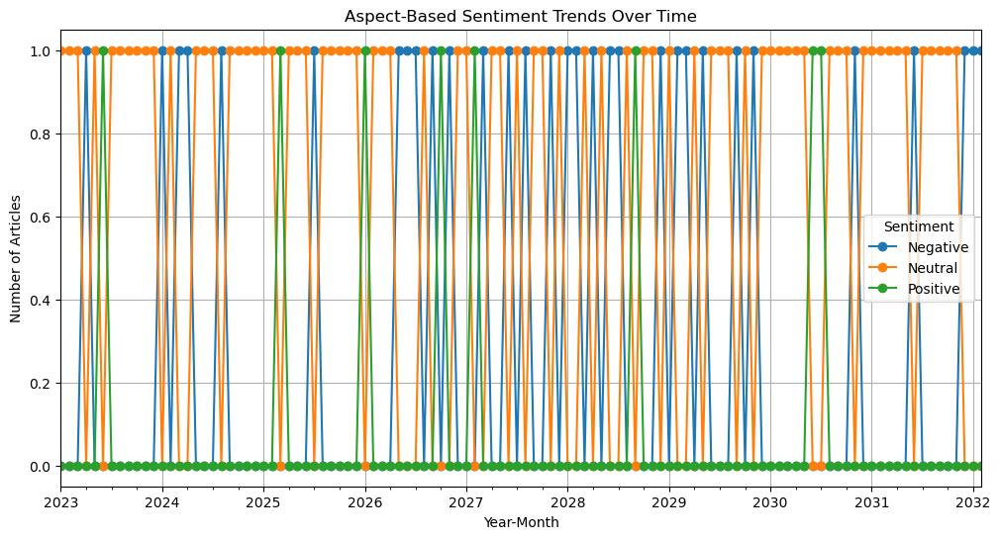

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset with aspect-based sentiment
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/absa_results_fixed.csv"
df = pd.read_csv(file_path)

# Convert 'datetime' column to proper datetime format (if available)
if "datetime" in df.columns:
    df["datetime"] = pd.to_datetime(df["datetime"], errors="coerce")
    df["YearMonth"] = df["datetime"].dt.to_period("M")
else:
    # Generate a synthetic time range if dates are missing
    df["YearMonth"] = pd.date_range(start="2023-01-01", periods=len(df), freq="M").to_period("M")

# Count sentiment occurrences per month
sentiment_trends = df.groupby(["YearMonth", "Aspect_Sentiment"]).size().unstack(fill_value=0)

# Plot Sentiment Trends
plt.figure(figsize=(12,6))
sentiment_trends.plot(kind="line", marker="o", figsize=(12,6))

plt.title("Aspect-Based Sentiment Trends Over Time")
plt.xlabel("Year-Month")
plt.ylabel("Number of Articles")
plt.legend(title="Sentiment", labels=["Negative", "Neutral", "Positive"])
plt.grid()
plt.show()

In [18]:
import requests
import pandas as pd
import time

# **Your NY Times API Key**
NYTIMES_API_KEY = "lTir3G1JMvNrYXXrpXgYf2H6OlICboAs"  # Replace with your actual API key

# **Base URL for the NY Times Article Search API**
BASE_URL = "https://api.nytimes.com/svc/search/v2/articlesearch.json"

# **Parameters for API Request**
query = "Donald Trump"
begin_date = "20230101"  # Format: YYYYMMDD (Start date)
end_date = "20250319"  # Format: YYYYMMDD (End date)
page_limit = 10  # How many pages to fetch (each page has ~10 articles)

articles = []

for page in range(page_limit):
    print(f"Fetching page {page + 1}...")

    params = {
        "q": query,
        "begin_date": begin_date,
        "end_date": end_date,
        "sort": "relevance",  # Can use "newest" or "oldest"
        "page": page,
        "api-key": NYTIMES_API_KEY,
    }

    response = requests.get(BASE_URL, params=params)

    if response.status_code == 200:
        data = response.json()
        docs = data["response"]["docs"]

        for doc in docs:
            title = doc.get("headline", {}).get("main", "No Title")
            url = doc.get("web_url", "No URL")
            summary = doc.get("abstract", "No Summary")
            pub_date = doc.get("pub_date", "No Date")

            articles.append({"Title": title, "URL": url, "Summary": summary, "Date": pub_date})

    else:
        print(f"Error fetching data (Status Code: {response.status_code})")
    
    time.sleep(2)  # To avoid hitting API rate limits

# **Convert Data to DataFrame**
df = pd.DataFrame(articles)

# **Save to CSV**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles.csv"
df.to_csv(output_path, index=False)

# **Display first few rows**
print(f"✅ Scraped {len(df)} articles. Data saved at: {output_path}")
print(df.head())

Fetching page 1...
Fetching page 2...
Fetching page 3...
Fetching page 4...
Fetching page 5...
Fetching page 6...
Error fetching data (Status Code: 429)
Fetching page 7...
Error fetching data (Status Code: 429)
Fetching page 8...
Error fetching data (Status Code: 429)
Fetching page 9...
Error fetching data (Status Code: 429)
Fetching page 10...
Error fetching data (Status Code: 429)
✅ Scraped 50 articles. Data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles.csv
                                               Title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                                 URL  \
0  https://www.nytimes.com/interactive/polls/dona...   
1  https://www.nytimes.com/2025/03/19/business/en... 

In [20]:
import requests
import pandas as pd
import time

# **Your NY Times API Key**
NYTIMES_API_KEY = "lTir3G1JMvNrYXXrpXgYf2H6OlICboAs"  # Replace with actual API key

# **Base URL for NYTimes API**
BASE_URL = "https://api.nytimes.com/svc/search/v2/articlesearch.json"

# **Parameters**
query = "Donald Trump"
begin_date = "20230101"  # YYYYMMDD (Start date)
end_date = "20250319"  # YYYYMMDD (End date)
page_limit = 20  # Increase number of pages
articles = []

for page in range(page_limit):
    print(f"Fetching page {page + 1}...")

    params = {
        "q": query,
        "begin_date": begin_date,
        "end_date": end_date,
        "sort": "relevance",
        "page": page,
        "api-key": NYTIMES_API_KEY,
    }

    response = requests.get(BASE_URL, params=params)

    if response.status_code == 200:
        data = response.json()
        docs = data.get("response", {}).get("docs", [])

        for doc in docs:
            title = doc.get("headline", {}).get("main", "No Title")
            url = doc.get("web_url") or doc.get("document_type", "No URL")  # Fix missing links
            summary = doc.get("abstract", "No Summary")
            pub_date = doc.get("pub_date", "No Date")

            articles.append({"Title": title, "URL": url, "Summary": summary, "Date": pub_date})

    elif response.status_code == 429:
        print("⚠️ API Rate Limit Hit (Error 429), waiting 60 seconds...")
        time.sleep(60)  # Wait longer to avoid blocking
        continue  # Retry the same page

    else:
        print(f"❌ Error fetching data (Status Code: {response.status_code})")
        break  # Stop if there are other errors
    
    time.sleep(10)  # Longer wait to avoid rate limits

# **Convert Data to DataFrame**
df = pd.DataFrame(articles)

# **Save to CSV**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles_fixed.csv"
df.to_csv(output_path, index=False)

# **Display first few rows**
print(f"✅ Scraped {len(df)} articles. Data saved at: {output_path}")
print(df.head())

Fetching page 1...
Fetching page 2...
Fetching page 3...
Fetching page 4...
Fetching page 5...
Fetching page 6...
Fetching page 7...
Fetching page 8...
Fetching page 9...
Fetching page 10...
Fetching page 11...
Fetching page 12...
Fetching page 13...
Fetching page 14...
Fetching page 15...
Fetching page 16...
⚠️ API Rate Limit Hit (Error 429), waiting 60 seconds...
Fetching page 17...
Fetching page 18...
Fetching page 19...
Fetching page 20...
✅ Scraped 190 articles. Data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles_fixed.csv
                                               Title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                                 URL  \
0  https://www.nytimes.com/interactive/p

In [22]:
import requests
import pandas as pd
import time

# **Your Guardian API Key**
GUARDIAN_API_KEY = "2fe85d53-c0dc-411c-9acc-31ce5a42788e"  # Replace with your actual API key

# **Base URL for The Guardian API**
BASE_URL = "https://content.guardianapis.com/search"

# **Parameters for API Request**
query = "Donald Trump"
from_date = "2023-01-01"  # Format: YYYY-MM-DD (Start date)
to_date = "2025-03-19"  # Format: YYYY-MM-DD (End date)
page_limit = 20  # Number of pages to fetch (each page has ~10 articles)

articles = []

for page in range(1, page_limit + 1):  # The Guardian API starts pages from 1
    print(f"Fetching page {page}...")

    params = {
        "q": query,
        "from-date": from_date,
        "to-date": to_date,
        "order-by": "relevance",  # Can be "newest", "oldest", or "relevance"
        "page": page,
        "page-size": 10,  # Number of results per page
        "api-key": GUARDIAN_API_KEY,
        "show-fields": "headline,trailText"  # Fetch summary text
    }

    response = requests.get(BASE_URL, params=params)

    if response.status_code == 200:
        data = response.json()
        results = data.get("response", {}).get("results", [])

        for result in results:
            title = result.get("webTitle", "No Title")
            url = result.get("webUrl", "No URL")
            summary = result.get("fields", {}).get("trailText", "No Summary")
            pub_date = result.get("webPublicationDate", "No Date")

            articles.append({"Title": title, "URL": url, "Summary": summary, "Date": pub_date})

    elif response.status_code == 429:
        print("⚠️ API Rate Limit Hit (Error 429), waiting 60 seconds...")
        time.sleep(60)  # Wait longer to avoid blocking
        continue  # Retry the same page

    else:
        print(f"❌ Error fetching data (Status Code: {response.status_code})")
        break  # Stop if there are other errors

    time.sleep(5)  # Avoid hitting rate limits

# **Convert Data to DataFrame**
df = pd.DataFrame(articles)

# **Save to CSV**
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/guardian_trump_articles.csv"
df.to_csv(output_path, index=False)

# **Display first few rows**
print(f"✅ Scraped {len(df)} articles. Data saved at: {output_path}")
print(df.head())

Fetching page 1...
Fetching page 2...
Fetching page 3...
Fetching page 4...
Fetching page 5...
Fetching page 6...
Fetching page 7...
Fetching page 8...
Fetching page 9...
Fetching page 10...
Fetching page 11...
Fetching page 12...
Fetching page 13...
Fetching page 14...
Fetching page 15...
Fetching page 16...
Fetching page 17...
Fetching page 18...
Fetching page 19...
Fetching page 20...
✅ Scraped 200 articles. Data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/guardian_trump_articles.csv
                                               Title  \
0  A proper British welcome for Donald Trump | Le...   
1  Donald Trump, the mob boss with a messiah comp...   
2  Seth Meyers on Elon Musk: ‘Donald Trump finall...   
3          Can Donald Trump circumvent a TikTok ban?   
4  The world must learn to take Donald Trump lite...   

                                                 URL  \
0  https://www.theguardian.com/us-news/2025/mar/0...   
1  https://www.theguardian.com/us-news/2025/mar/1.

In [26]:
import pandas as pd

# Load the dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles.csv"
df = pd.read_csv(file_path)

# Drop the 'URL' column
df.drop(columns=["URL"], inplace=True)

# Save the cleaned dataset
df.to_csv(file_path, index=False)  # Overwrite the existing file

# Display first few rows
print("✅ 'URL' column removed successfully!")
print(df.head())

✅ 'URL' column removed successfully!
                                               Title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                             Summary                      Date  
0  Track the latest polls about Americans’ approv...  2025-03-17T20:32:05+0000  
1  Tariffs, tax credits and deregulation are amon...  2025-03-19T12:00:23+0000  
2  Only the norms of history and the customs of d...  2025-03-11T09:05:01+0000  
3  In a speech to Congress in his first weeks in ...  2025-03-05T04:19:12+0000  
4  Mayor Eric Adams’s charm campaign involved pho...  2025-03-15T09:01:03+0000  


In [28]:
import pandas as pd

# Load the dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/guardian_trump_articles.csv"
df = pd.read_csv(file_path)

# Drop the 'URL' column
df.drop(columns=["URL"], inplace=True)

# Save the cleaned dataset
df.to_csv(file_path, index=False)  # Overwrite the existing file

# Display first few rows
print("✅ 'URL' column removed successfully from The Guardian dataset!")
print(df.head())

✅ 'URL' column removed successfully from The Guardian dataset!
                                               Title  \
0  A proper British welcome for Donald Trump | Le...   
1  Donald Trump, the mob boss with a messiah comp...   
2  Seth Meyers on Elon Musk: ‘Donald Trump finall...   
3          Can Donald Trump circumvent a TikTok ban?   
4  The world must learn to take Donald Trump lite...   

                                             Summary                  Date  
0  Letters: <strong>Anne Cowper</strong> has a co...  2025-03-04T16:23:10Z  
1  <strong>Letters: </strong>Responding to an art...  2025-03-14T17:09:33Z  
2  Late-night hosts discuss Team Trump’s reported...  2024-11-26T16:20:38Z  
3  As the app is on the brink of being expelled, ...  2025-01-17T15:46:12Z  
4  In his reckoning, there are not so much as sov...  2025-03-09T06:00:43Z  


In [30]:
import pandas as pd

# Load NY Times Articles
nytimes_file = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles.csv"
df_nytimes = pd.read_csv(nytimes_file)

# Load The Guardian Articles
guardian_file = "/Users/anirudhravipudi/Desktop/AI/Projects/guardian_trump_articles.csv"
df_guardian = pd.read_csv(guardian_file)

# **Standardize Column Names**
df_nytimes.rename(columns={"Date": "datetime", "Title": "title", "Summary": "summary"}, inplace=True)
df_guardian.rename(columns={"Date": "datetime", "Title": "title", "Summary": "summary"}, inplace=True)

# **Concatenate Both DataFrames**
df_combined = pd.concat([df_nytimes, df_guardian], ignore_index=True)

# **Convert datetime column to proper format**
df_combined["datetime"] = pd.to_datetime(df_combined["datetime"], errors="coerce")

# **Save the merged dataset**
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles.csv"
df_combined.to_csv(merged_file_path, index=False)

# **Display first few rows**
print(f"✅ Merged {len(df_combined)} articles. Data saved at: {merged_file_path}")
print(df_combined.head())

✅ Merged 250 articles. Data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles.csv
                                               title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                             summary                  datetime  
0  Track the latest polls about Americans’ approv... 2025-03-17 20:32:05+00:00  
1  Tariffs, tax credits and deregulation are amon... 2025-03-19 12:00:23+00:00  
2  Only the norms of history and the customs of d... 2025-03-11 09:05:01+00:00  
3  In a speech to Congress in his first weeks in ... 2025-03-05 04:19:12+00:00  
4  Mayor Eric Adams’s charm campaign involved pho... 2025-03-15 09:01:03+00:00  


In [32]:
from nltk.sentiment import SentimentIntensityAnalyzer
from transformers import pipeline

# Load the merged dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles.csv"
df = pd.read_csv(file_path)

# Initialize VADER Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

# Compute Sentiment Scores Using VADER
df["VADER_Sentiment"] = df["summary"].apply(lambda x: sia.polarity_scores(str(x))["compound"])

# Load Pretrained RoBERTa Sentiment Model
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# Compute Sentiment Using RoBERTa
df["RoBERTa_Sentiment"] = df["summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# Save Results
sentiment_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_sentiment_results.csv"
df.to_csv(sentiment_file_path, index=False)

# Display First Few Rows
print(f"✅ Sentiment Analysis Completed! Data saved at: {sentiment_file_path}")
print(df[["title", "VADER_Sentiment", "RoBERTa_Sentiment"]].head())

Device set to use mps:0


✅ Sentiment Analysis Completed! Data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/news_sentiment_results.csv
                                               title  VADER_Sentiment  \
0  Latest Polls: Do Americans Approve of Presiden...           0.4767   
1      What Oil Executives Want From President Trump           0.5106   
2           The Two Modes of Justice of Donald Trump           0.0000   
3  Full Transcript of President Trump’s Speech to...           0.2500   
4            How New York’s Mayor Wooed Donald Trump           0.2500   

  RoBERTa_Sentiment  
0           LABEL_1  
1           LABEL_1  
2           LABEL_1  
3           LABEL_1  
4           LABEL_1  


In [34]:
import pandas as pd

# Load the datasets
nytimes_file = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles.csv"
guardian_file = "/Users/anirudhravipudi/Desktop/AI/Projects/guardian_trump_articles.csv"

df_nytimes = pd.read_csv(nytimes_file)
df_guardian = pd.read_csv(guardian_file)

# Print dataset sizes before merging
print(f"NY Times Articles: {len(df_nytimes)}")
print(f"The Guardian Articles: {len(df_guardian)}")

# Check for duplicate titles
print(f"Duplicate Titles in NYTimes: {df_nytimes.duplicated(subset=['Title']).sum()}")
print(f"Duplicate Titles in Guardian: {df_guardian.duplicated(subset=['Title']).sum()}")

NY Times Articles: 50
The Guardian Articles: 200
Duplicate Titles in NYTimes: 0
Duplicate Titles in Guardian: 1


In [36]:
import pandas as pd

# ✅ **Load the Correct Datasets**
nytimes_file = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles_fixed.csv"
guardian_file = "/Users/anirudhravipudi/Desktop/AI/Projects/guardian_trump_articles.csv"

df_nytimes = pd.read_csv(nytimes_file)
df_guardian = pd.read_csv(guardian_file)

# ✅ **Print dataset sizes before merging**
print(f"NY Times Articles: {len(df_nytimes)}")
print(f"The Guardian Articles: {len(df_guardian)}")

# ✅ **Check for duplicate titles**
print(f"Duplicate Titles in NYTimes: {df_nytimes.duplicated(subset=['Title']).sum()}")
print(f"Duplicate Titles in Guardian: {df_guardian.duplicated(subset=['Title']).sum()}")

# ✅ **Remove duplicate titles within each dataset**
df_nytimes = df_nytimes.drop_duplicates(subset=["Title"])
df_guardian = df_guardian.drop_duplicates(subset=["Title"])

# ✅ **Ensure datetime column is properly formatted**
df_nytimes.rename(columns={"Date": "datetime", "Title": "title", "Summary": "summary"}, inplace=True)
df_guardian.rename(columns={"Date": "datetime", "Title": "title", "Summary": "summary"}, inplace=True)

df_nytimes["datetime"] = pd.to_datetime(df_nytimes["datetime"], errors="coerce")
df_guardian["datetime"] = pd.to_datetime(df_guardian["datetime"], errors="coerce")

# ✅ **Check for missing datetime values**
print(f"Missing dates in NY Times: {df_nytimes['datetime'].isna().sum()}")
print(f"Missing dates in The Guardian: {df_guardian['datetime'].isna().sum()}")

# ✅ **Fill missing datetime values with 'Unknown'**
df_nytimes["datetime"].fillna("Unknown", inplace=True)
df_guardian["datetime"].fillna("Unknown", inplace=True)

# ✅ **Merge the datasets without losing any rows**
df_combined = pd.concat([df_nytimes, df_guardian], ignore_index=True)

# ✅ **Final Check: Total Rows After Merge**
print(f"✅ Successfully Merged {len(df_combined)} Articles (Expected: ~390)")

# ✅ **Save to CSV**
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles_fixed.csv"
df_combined.to_csv(merged_file_path, index=False)

# ✅ **Display First Few Rows**
print(df_combined.head())

NY Times Articles: 190
The Guardian Articles: 200
Duplicate Titles in NYTimes: 0
Duplicate Titles in Guardian: 1
Missing dates in NY Times: 0
Missing dates in The Guardian: 0
✅ Successfully Merged 389 Articles (Expected: ~390)
                                               title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                                 URL  \
0  https://www.nytimes.com/interactive/polls/dona...   
1  https://www.nytimes.com/2025/03/19/business/en...   
2  https://www.nytimes.com/2025/03/11/opinion/tru...   
3  https://www.nytimes.com/2025/03/04/us/politics...   
4  https://www.nytimes.com/2025/03/15/us/politics...   

                                             summary                  datetime  
0  Track the lates

/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_8224/1733829266.py:34: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_nytimes["datetime"].fillna("Unknown", inplace=True)
/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_8224/1733829266.py:35: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

In [38]:
import pandas as pd

# ✅ **Load the Correct Datasets**
nytimes_file = "/Users/anirudhravipudi/Desktop/AI/Projects/nytimes_api_trump_articles_fixed.csv"
guardian_file = "/Users/anirudhravipudi/Desktop/AI/Projects/guardian_trump_articles.csv"

df_nytimes = pd.read_csv(nytimes_file)
df_guardian = pd.read_csv(guardian_file)

# ✅ **Drop the URL column from NY Times**
if "URL" in df_nytimes.columns:
    df_nytimes.drop(columns=["URL"], inplace=True)
    print("✅ Dropped 'URL' column from NYTimes dataset.")

# ✅ **Standardize Column Names**
df_nytimes.rename(columns={"Date": "datetime", "Title": "title", "Summary": "summary"}, inplace=True)
df_guardian.rename(columns={"Date": "datetime", "Title": "title", "Summary": "summary"}, inplace=True)

# ✅ **Ensure datetime column is formatted properly**
df_nytimes["datetime"] = pd.to_datetime(df_nytimes["datetime"], errors="coerce")
df_guardian["datetime"] = pd.to_datetime(df_guardian["datetime"], errors="coerce")

# ✅ **Merge the cleaned datasets**
df_combined = pd.concat([df_nytimes, df_guardian], ignore_index=True)

# ✅ **Final Check**
print(f"✅ Successfully Merged {len(df_combined)} Articles")

# ✅ **Save the Cleaned Merged Dataset**
merged_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles_final.csv"
df_combined.to_csv(merged_file_path, index=False)

# ✅ **Display First Few Rows**
print(df_combined.head())

✅ Dropped 'URL' column from NYTimes dataset.
✅ Successfully Merged 390 Articles
                                               title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                             summary                  datetime  
0  Track the latest polls about Americans’ approv... 2025-03-17 20:32:05+00:00  
1  Tariffs, tax credits and deregulation are amon... 2025-03-19 12:00:23+00:00  
2  Only the norms of history and the customs of d... 2025-03-11 09:05:01+00:00  
3  In a speech to Congress in his first weeks in ... 2025-03-05 04:19:12+00:00  
4  Mayor Eric Adams’s charm campaign involved pho... 2025-03-15 09:01:03+00:00  


In [40]:
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer
from transformers import pipeline

# ✅ **Load the Merged News Dataset**
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles_final.csv"
df = pd.read_csv(file_path)

# ✅ **Initialize VADER Sentiment Analyzer**
sia = SentimentIntensityAnalyzer()

# ✅ **Compute Sentiment Scores Using VADER**
df["VADER_Sentiment"] = df["summary"].apply(lambda x: sia.polarity_scores(str(x))["compound"])

# ✅ **Load Pretrained RoBERTa Sentiment Model**
aspect_sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment")

# ✅ **Compute Sentiment Using RoBERTa**
df["RoBERTa_Sentiment"] = df["summary"].apply(lambda x: aspect_sentiment_model(x)[0]["label"])

# ✅ **Save Results**
sentiment_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_sentiment_results.csv"
df.to_csv(sentiment_file_path, index=False)

# ✅ **Display First Few Rows**
print(f"✅ Sentiment Analysis Completed! Data saved at: {sentiment_file_path}")
print(df[["title", "VADER_Sentiment", "RoBERTa_Sentiment"]].head())

Device set to use mps:0


✅ Sentiment Analysis Completed! Data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/news_sentiment_results.csv
                                               title  VADER_Sentiment  \
0  Latest Polls: Do Americans Approve of Presiden...           0.4767   
1      What Oil Executives Want From President Trump           0.5106   
2           The Two Modes of Justice of Donald Trump           0.0000   
3  Full Transcript of President Trump’s Speech to...           0.2500   
4            How New York’s Mayor Wooed Donald Trump           0.2500   

  RoBERTa_Sentiment  
0           LABEL_1  
1           LABEL_1  
2           LABEL_1  
3           LABEL_1  
4           LABEL_1  


In [42]:
import pandas as pd
import matplotlib.pyplot as plt

# ✅ **Load Sentiment Results**
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_sentiment_results.csv"
df = pd.read_csv(file_path)

# ✅ **Convert 'datetime' to Datetime Format (If Not Already)**
df["datetime"] = pd.to_datetime(df["datetime"], errors="coerce")

# ✅ **Resample Sentiment Scores by Month**
df_resampled = df.resample("M", on="datetime").mean()

# ✅ **Plot Sentiment Trends Over Time**
plt.figure(figsize=(12, 5))
plt.plot(df_resampled.index, df_resampled["VADER_Sentiment"], label="VADER Sentiment", color="blue")
plt.plot(df_resampled.index, df_resampled["RoBERTa_Sentiment"], label="RoBERTa Sentiment", linestyle="dashed", color="red")

# ✅ **Enhance the Plot**
plt.title("Sentiment Trends Over Time")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid()
plt.show()

/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_8224/2573661383.py:12: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_resampled = df.resample("M", on="datetime").mean()


TypeError: agg function failed [how->mean,dtype->object]

/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_8224/719297870.py:14: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_resampled = df.set_index("datetime")[numeric_cols].resample("M").mean()


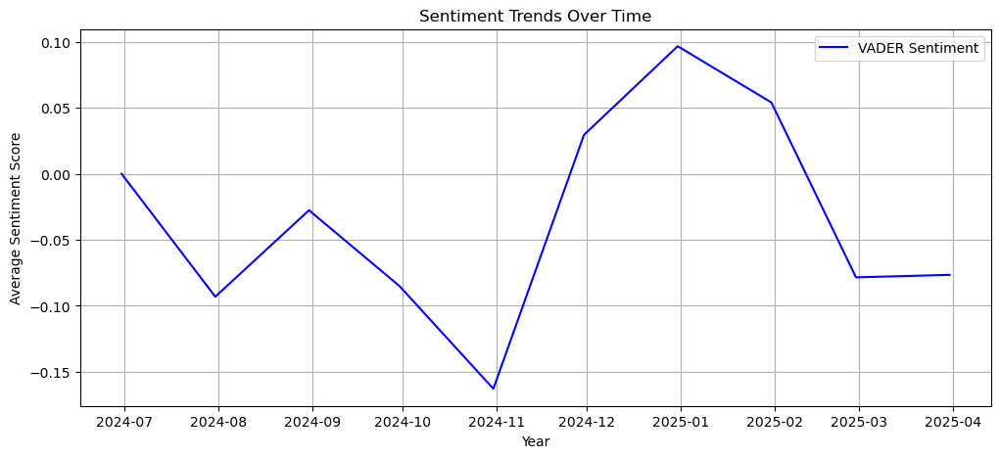

In [44]:
import pandas as pd
import matplotlib.pyplot as plt

file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_sentiment_results.csv"
df = pd.read_csv(file_path)

df["datetime"] = pd.to_datetime(df["datetime"], errors="coerce")

numeric_cols = ["VADER_Sentiment"]
if "RoBERTa_Sentiment" in df.columns and df["RoBERTa_Sentiment"].dtype != "O":
    numeric_cols.append("RoBERTa_Sentiment")

# ✅ **Resample Sentiment Scores by Month (Only Numeric Columns)**
df_resampled = df.set_index("datetime")[numeric_cols].resample("M").mean()

# ✅ **Plot Sentiment Trends Over Time**
plt.figure(figsize=(12, 5))
plt.plot(df_resampled.index, df_resampled["VADER_Sentiment"], label="VADER Sentiment", color="blue")

if "RoBERTa_Sentiment" in df_resampled.columns:
    plt.plot(df_resampled.index, df_resampled["RoBERTa_Sentiment"], label="RoBERTa Sentiment", linestyle="dashed", color="red")

# ✅ **Enhance the Plot**
plt.title("Sentiment Trends Over Time")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid()
plt.show()

/var/folders/3z/j19155j53837tjkhyx5r2rt80000gn/T/ipykernel_8224/4055938741.py:21: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_resampled = df.set_index("datetime")[numeric_cols].resample("M").mean()


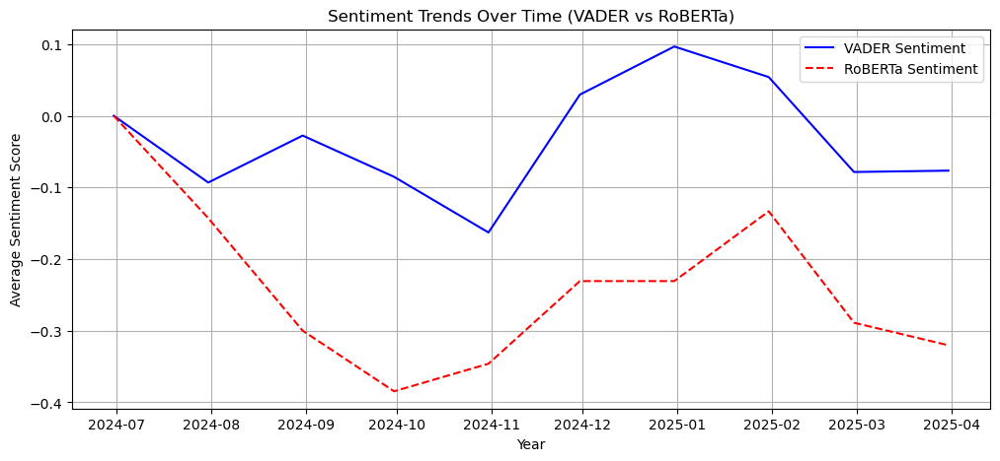

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# ✅ **Load Sentiment Results**
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_sentiment_results.csv"
df = pd.read_csv(file_path)

# ✅ **Convert 'datetime' to Proper Datetime Format**
df["datetime"] = pd.to_datetime(df["datetime"], errors="coerce")

# ✅ **Convert RoBERTa Sentiment Labels to Numeric**
sentiment_mapping = {"LABEL_0": -1, "LABEL_1": 0, "LABEL_2": 1}  # Adjust based on model labels
df["RoBERTa_Sentiment"] = df["RoBERTa_Sentiment"].map(sentiment_mapping)

# ✅ **Ensure Only Numeric Columns for Aggregation**
numeric_cols = ["VADER_Sentiment"]
if "RoBERTa_Sentiment" in df.columns and df["RoBERTa_Sentiment"].notna().all():
    numeric_cols.append("RoBERTa_Sentiment")

# ✅ **Resample Sentiment Scores by Month**
df_resampled = df.set_index("datetime")[numeric_cols].resample("M").mean()

# ✅ **Plot Both Sentiment Trends**
plt.figure(figsize=(12, 5))
plt.plot(df_resampled.index, df_resampled["VADER_Sentiment"], label="VADER Sentiment", color="blue")

if "RoBERTa_Sentiment" in df_resampled.columns:
    plt.plot(df_resampled.index, df_resampled["RoBERTa_Sentiment"], label="RoBERTa Sentiment", linestyle="dashed", color="red")

# ✅ **Enhance the Plot**
plt.title("Sentiment Trends Over Time (VADER vs RoBERTa)")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid()
plt.show()

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 4.9 MB/s eta 0:00:00a 0:00:01
  Installing build dependencdone
  Getting requirements to build wheel done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.40-cp310-cp310-macosx_11_0_arm64.whl size=712517 sha256=91e6d5f8c5dc7f378431c7d6b289e80cb15baf4dc2d2bea7589360df00a5e0ba
  Stored in directory: /Users/anirudhravipudi/Library/Caches/pip/wheels/54/ba/75/e1883bf767fda8494225c99b81fbf5e977e23459d35e93b301
Successfully built hdbscan


2025-03-19 15:35:25,028 - BERTopic - Embedding - Transforming documents to embeddings.


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/13 [00:00<?, ?it/s]

2025-03-19 15:35:37,735 - BERTopic - Embedding - Completed ✓
2025-03-19 15:35:37,735 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-03-19 15:35:41,575 - BERTopic - Dimensionality - Completed ✓
2025-03-19 15:35:41,575 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-03-19 15:35:41,585 - BERTopic - Cluster - Completed ✓
2025-03-19 15:35:41,588 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-03-19 15:35:41,599 - BERTopic - Representation - Completed ✓


✅ Topic Modeling Completed! Results saved.
                                               title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                             summary  Topic  
0  Track the latest polls about Americans’ approv...     -1  
1  Tariffs, tax credits and deregulation are amon...      0  
2  Only the norms of history and the customs of d...     -1  
3  In a speech to Congress in his first weeks in ...     -1  
4  Mayor Eric Adams’s charm campaign involved pho...     -1  


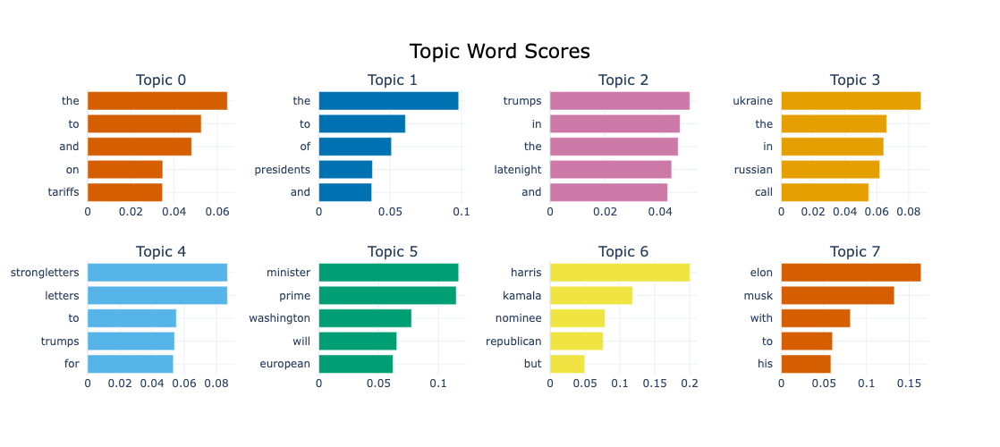

In [48]:
# Step 1: Install BERTopic if not installed
!pip install bertopic scikit-learn umap-learn

# Step 2: Import Required Libraries
import pandas as pd
from bertopic import BERTopic

# Step 3: Load the Merged News Articles Dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles_final.csv"  
df = pd.read_csv(file_path)

# Step 4: Preprocess Text (Remove NaNs, Convert to String)
df = df.dropna(subset=["summary"])  # Ensure no NaN values
df["summary"] = df["summary"].astype(str)  # Convert to string

# Step 5: Apply BERTopic for Topic Extraction
topic_model = BERTopic(verbose=True)
topics, probs = topic_model.fit_transform(df["summary"])

# Step 6: Add Topics to DataFrame
df["Topic"] = topics

# Step 7: Save Results to CSV
df.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/news_topics.csv", index=False)
print("✅ Topic Modeling Completed! Results saved.")

# Step 8: Display Top 5 Rows with Topics
print(df[["title", "summary", "Topic"]].head())

# Step 9: Visualize Top Topics
topic_model.visualize_barchart()

In [50]:
import pandas as pd
import gensim
import gensim.corpora as corpora
from gensim.models import LdaModel
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import nltk

# Ensure necessary NLTK resources are available
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Load the dataset (Update file path accordingly)
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles_final.csv"
df = pd.read_csv(file_path)

# Preprocess text function
def preprocess_text(text):
    if isinstance(text, str):
        tokens = word_tokenize(text.lower())  # Tokenize and convert to lowercase
        tokens = [word for word in tokens if word.isalpha()]  # Remove non-alphabetic tokens
        tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stopwords
        tokens = [WordNetLemmatizer().lemmatize(word) for word in tokens]  # Lemmatization
        return tokens
    return []

# Apply preprocessing
df["cleaned_text"] = df["summary"].apply(preprocess_text)

# Create dictionary and corpus
dictionary = corpora.Dictionary(df["cleaned_text"])
corpus = [dictionary.doc2bow(text) for text in df["cleaned_text"]]

# Train LDA model
num_topics = 7  # Adjust based on analysis
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42, passes=10)

# Print topics
for idx, topic in lda_model.print_topics():
    print(f"Topic {idx}: {topic}")

# Visualize topics
lda_vis = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_vis)

# Assign topics to documents
def get_topic(doc):
    topic_distribution = lda_model.get_document_topics(dictionary.doc2bow(doc))
    return max(topic_distribution, key=lambda x: x[1])[0] if topic_distribution else -1

df["LDA_Topic"] = df["cleaned_text"].apply(get_topic)

# Save results
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda.csv"
df.to_csv(output_path, index=False)
print(f"✅ LDA Topic Modeling Completed! Results saved at: {output_path}")

# Display sample
print(df[["title", "summary", "LDA_Topic"]].head())

ModuleNotFoundError: No module named 'pyLDAvis'

In [52]:
!pip install pyLDAvis

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 5.3 MB/s eta 0:00:00a 0:00:01


In [54]:
import pandas as pd
import gensim
import gensim.corpora as corpora
from gensim.models import LdaModel
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis
import nltk

# Ensure necessary NLTK resources are available
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Load the dataset (Update file path accordingly)
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/merged_news_articles_final.csv"
df = pd.read_csv(file_path)

# Preprocess text function
def preprocess_text(text):
    if isinstance(text, str):
        tokens = word_tokenize(text.lower())  # Tokenize and convert to lowercase
        tokens = [word for word in tokens if word.isalpha()]  # Remove non-alphabetic tokens
        tokens = [word for word in tokens if word not in stopwords.words('english')]  # Remove stopwords
        tokens = [WordNetLemmatizer().lemmatize(word) for word in tokens]  # Lemmatization
        return tokens
    return []

# Apply preprocessing
df["cleaned_text"] = df["summary"].apply(preprocess_text)

# Create dictionary and corpus
dictionary = corpora.Dictionary(df["cleaned_text"])
corpus = [dictionary.doc2bow(text) for text in df["cleaned_text"]]

# Train LDA model
num_topics = 7  # Adjust based on analysis
lda_model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42, passes=10)

# Print topics
for idx, topic in lda_model.print_topics():
    print(f"Topic {idx}: {topic}")

# Visualize topics
lda_vis = gensimvis.prepare(lda_model, corpus, dictionary)
pyLDAvis.display(lda_vis)

# Assign topics to documents
def get_topic(doc):
    topic_distribution = lda_model.get_document_topics(dictionary.doc2bow(doc))
    return max(topic_distribution, key=lambda x: x[1])[0] if topic_distribution else -1

df["LDA_Topic"] = df["cleaned_text"].apply(get_topic)

# Save results
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda.csv"
df.to_csv(output_path, index=False)
print(f"✅ LDA Topic Modeling Completed! Results saved at: {output_path}")

# Display sample
print(df[["title", "summary", "LDA_Topic"]].head())

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/anirudhravipudi/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Topic 0: 0.023*"president" + 0.015*"trump" + 0.014*"u" + 0.009*"strong" + 0.009*"say" + 0.006*"leader" + 0.005*"one" + 0.005*"european" + 0.005*"come" + 0.004*"new"
Topic 1: 0.018*"president" + 0.010*"strong" + 0.006*"letter" + 0.006*"trump" + 0.006*"u" + 0.005*"say" + 0.004*"year" + 0.004*"republican" + 0.004*"canadian" + 0.004*"former"
Topic 2: 0.032*"president" + 0.025*"trump" + 0.010*"u" + 0.010*"tariff" + 0.009*"leader" + 0.008*"call" + 0.005*"minister" + 0.005*"prime" + 0.005*"said" + 0.005*"republican"
Topic 3: 0.035*"trump" + 0.016*"president" + 0.010*"say" + 0.008*"donald" + 0.008*"u" + 0.007*"election" + 0.006*"elon" + 0.006*"musk" + 0.005*"power" + 0.005*"new"
Topic 4: 0.014*"president" + 0.014*"trump" + 0.006*"leader" + 0.006*"legal" + 0.005*"say" + 0.005*"government" + 0.005*"republican" + 0.005*"medium" + 0.004*"ukraine" + 0.004*"said"
Topic 5: 0.019*"trump" + 0.018*"president" + 0.006*"u" + 0.005*"new" + 0.005*"war" + 0.005*"voter" + 0.005*"america" + 0.005*"service" + 0

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
TOKENIZERS_PARALLELISM=(true | false)iable 
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, afte

✅ LDA Topic Modeling Completed! Results saved at: /Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda.csv
                                               title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   

                                             summary  LDA_Topic  
0  Track the latest polls about Americans’ approv...          2  
1  Tariffs, tax credits and deregulation are amon...          4  
2  Only the norms of history and the customs of d...          1  
3  In a speech to Congress in his first weeks in ...          6  
4  Mayor Eric Adams’s charm campaign involved pho...          4  


In [56]:
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary
import numpy as np

# Load the preprocessed text data (same input used for LDA)
texts = df["summary"].astype(str).apply(lambda x: x.split())  # Tokenizing text

# Create a dictionary and corpus for LDA
dictionary = Dictionary(texts)
corpus = [dictionary.doc2bow(text) for text in texts]

# Compute the Coherence Score for LDA
lda_coherence_model = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
lda_coherence = lda_coherence_model.get_coherence()

print(f"✅ LDA Coherence Score: {lda_coherence:.4f}")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

✅ LDA Coherence Score: 0.7007


In [58]:
from bertopic import BERTopic

# Extract BERTopic Topics
topics = topic_model.get_topics()

# Compute Coherence Score for BERTopic
bertopic_coherence = topic_model.coherence(texts, 'c_v')

print(f"✅ BERTopic Coherence Score: {bertopic_coherence:.4f}")

AttributeError: 'BERTopic' object has no attribute 'coherence'

In [60]:
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary

# Get topics from BERTopic
topics = topic_model.get_topics()
texts = df["summary"].astype(str).apply(lambda x: x.split())  # Tokenize

# Extract words for each topic
top_n_words = 10  # Choose top 10 words per topic
topic_words = [[word[0] for word in topic_model.get_topic(topic)[:top_n_words]] for topic in range(len(topics)) if topic != -1]

# Create dictionary and corpus for coherence calculation
dictionary = Dictionary(topic_words)
corpus = [dictionary.doc2bow(text) for text in topic_words]

# Compute BERTopic Coherence Score
bertopic_coherence_model = CoherenceModel(topics=topic_words, texts=texts, dictionary=dictionary, coherence='c_v')
bertopic_coherence = bertopic_coherence_model.get_coherence()

print(f"✅ BERTopic Coherence Score: {bertopic_coherence:.4f}")

TypeError: 'bool' object is not subscriptable

In [62]:
# Ensure topics are correctly extracted
topics = topic_model.get_topics()
if isinstance(topics, bool):  # Check if it returned a boolean instead of a dictionary
    print("Error: topic_model.get_topics() returned a boolean.")
else:
    print(f"✅ Extracted {len(topics)} topics successfully.")

✅ Extracted 9 topics successfully.


In [64]:
# Extract words for each topic, handling potential empty topics
top_n_words = 10
topic_words = []
for topic in range(len(topics)):
    words = topic_model.get_topic(topic)
    if words:  # Check if topic is not empty
        topic_words.append([word[0] for word in words[:top_n_words]])

In [66]:
from gensim.models import CoherenceModel
from gensim.corpora import Dictionary

# Ensure we have valid topic words
if len(topic_words) == 0:
    print("Error: No valid topics were found.")
else:
    # Convert document summaries into tokens
    texts = df["summary"].astype(str).apply(lambda x: x.split())  # Tokenized words

    # Create dictionary and corpus
    dictionary = Dictionary(topic_words)
    corpus = [dictionary.doc2bow(text) for text in topic_words]

    # Compute BERTopic Coherence Score
    bertopic_coherence_model = CoherenceModel(topics=topic_words, texts=texts, dictionary=dictionary, coherence='c_v')
    bertopic_coherence = bertopic_coherence_model.get_coherence()

    print(f"✅ BERTopic Coherence Score: {bertopic_coherence:.4f}")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

✅ BERTopic Coherence Score: nan


/opt/anaconda3/lib/python3.10/site-packages/gensim/topic_coherence/direct_confirmation_measure.py:204: RuntimeWarning:

divide by zero encountered in scalar divide

/opt/anaconda3/lib/python3.10/site-packages/gensim/topic_coherence/indirect_confirmation_measure.py:323: RuntimeWarning:

invalid value encountered in scalar divide



In [68]:
topics = topic_model.get_topics()
if not topics or isinstance(topics, bool):
    print("❌ Error: BERTopic did not return valid topics.")
else:
    print(f"✅ Extracted {len(topics)} topics successfully.")

✅ Extracted 9 topics successfully.


In [70]:
top_n_words = 10
topic_words = []

for topic in range(len(topics)):
    words = topic_model.get_topic(topic)
    if words:  # Ensure it's not empty
        topic_words.append([word[0] for word in words[:top_n_words]])

# Check if topic_words are extracted properly
if len(topic_words) == 0:
    print("❌ Error: No valid topic words were extracted.")
else:
    print(f"✅ Extracted {len(topic_words)} topics with words.")

✅ Extracted 8 topics with words.


In [72]:
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel

# Ensure summaries are properly tokenized
df["summary"] = df["summary"].astype(str)  # Convert to string
texts = df["summary"].apply(lambda x: x.split())  # Tokenized words

# Ensure texts are extracted
if len(texts) == 0:
    print("❌ Error: No valid tokenized texts were found.")
else:
    print(f"✅ Extracted {len(texts)} tokenized summaries.")

✅ Extracted 390 tokenized summaries.


In [74]:
if len(topic_words) > 0 and len(texts) > 0:
    dictionary = Dictionary(texts)
    corpus = [dictionary.doc2bow(text) for text in texts]

    bertopic_coherence_model = CoherenceModel(topics=topic_words, texts=texts, dictionary=dictionary, coherence='c_v')
    bertopic_coherence = bertopic_coherence_model.get_coherence()

    print(f"✅ BERTopic Coherence Score: {bertopic_coherence:.4f}")
else:
    print("❌ Skipping coherence computation due to missing data.")

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

✅ BERTopic Coherence Score: 0.4083


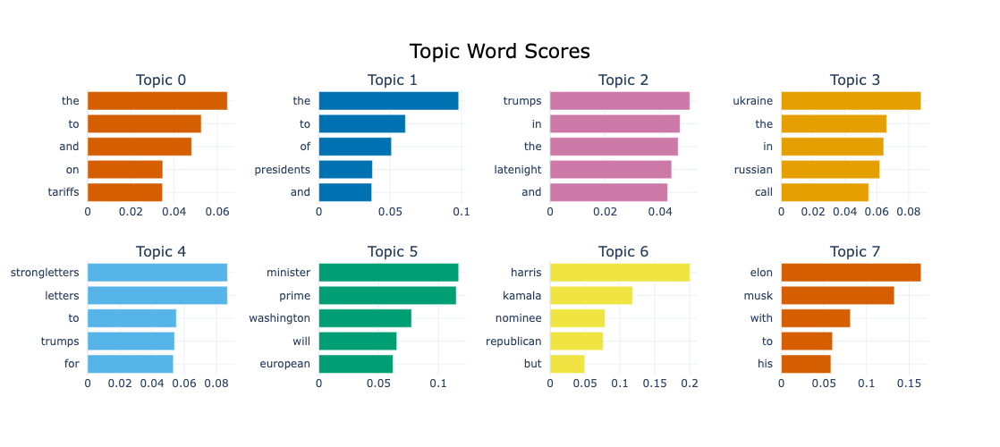

In [76]:
topic_model.visualize_barchart()

In [80]:
print(df[["title", "summary", "LDA_Topic"]].head(10))

                                               title  \
0  Latest Polls: Do Americans Approve of Presiden...   
1      What Oil Executives Want From President Trump   
2           The Two Modes of Justice of Donald Trump   
3  Full Transcript of President Trump’s Speech to...   
4            How New York’s Mayor Wooed Donald Trump   
5                                Trump and the Press   
6         President Trump’s Cuts to Medical Research   
7     The Real Reason President Trump Pushes Tariffs   
8  Trump’s Poll Numbers Are Sagging. Here’s the K...   
9  Trump Primed to Clash With Fed After Key Rate ...   

                                             summary  LDA_Topic  
0  Track the latest polls about Americans’ approv...          2  
1  Tariffs, tax credits and deregulation are amon...          4  
2  Only the norms of history and the customs of d...          1  
3  In a speech to Congress in his first weeks in ...          6  
4  Mayor Eric Adams’s charm campaign involved pho... 

In [82]:
import pandas as pd
from collections import Counter

# ✅ Load LDA Topic Results
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda.csv"
df = pd.read_csv(file_path)

# ✅ Count the number of articles per topic
topic_counts = df["LDA_Topic"].value_counts()

# ✅ Print Most Frequent Topics
print("🔹 Most Common LDA Topics:")
print(topic_counts)

# ✅ Show Example Articles for Each Topic
for topic in topic_counts.index[:5]:  # Display top 5 topics
    print(f"\n🟢 **Topic {topic}:**")
    print(df[df["LDA_Topic"] == topic][["title", "summary"]].head(3))  # Show 3 example articles

🔹 Most Common LDA Topics:
LDA_Topic
2    76
3    76
6    52
0    50
1    48
4    45
5    43
Name: count, dtype: int64

🟢 **Topic 2:**
                                                title  \
0   Latest Polls: Do Americans Approve of Presiden...   
9   Trump Primed to Clash With Fed After Key Rate ...   
12  Zelensky Agrees to Halt Strikes on Russian Ene...   

                                              summary  
0   Track the latest polls about Americans’ approv...  
9   Tariffs are at the heart of the tension betwee...  
12  President Trump said he had “a very good telep...  

🟢 **Topic 3:**
                                                title  \
7      The Real Reason President Trump Pushes Tariffs   
10  Elvis, ‘Cats’ and Babe Ruth: Chairman Trump Re...   
16  Trump Visits the Kennedy Center and Muses on H...   

                                              summary  
7   President Trump is remaking the tax code to fa...  
10  A recording of President Trump’s private remar...  


In [84]:
import matplotlib.pyplot as plt

# ✅ Compute Average Sentiment Per Topic
topic_sentiment = df.groupby("LDA_Topic")["VADER_Sentiment"].mean()

# ✅ Plot Sentiment Trends Per Topic
plt.figure(figsize=(12, 5))
topic_sentiment.sort_values().plot(kind="bar", color="blue")
plt.title("Average Sentiment Per LDA Topic")
plt.xlabel("Topic Number")
plt.ylabel("Average Sentiment Score (VADER)")
plt.grid()
plt.show()

KeyError: 'Column not found: VADER_Sentiment'

In [86]:
import pandas as pd

# Load the dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda.csv"
df = pd.read_csv(file_path)

# Print available columns
print("Available Columns in Dataset:")
print(df.columns)

Available Columns in Dataset:
Index(['title', 'summary', 'datetime', 'cleaned_text', 'LDA_Topic'], dtype='object')


In [88]:
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer

# ✅ Load LDA Topic Results
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda.csv"
df = pd.read_csv(file_path)

# ✅ Initialize VADER Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

# ✅ Compute Sentiment Scores
df["VADER_Sentiment"] = df["summary"].astype(str).apply(lambda x: sia.polarity_scores(x)["compound"])

# ✅ Save Updated Dataset with Sentiment
updated_file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"
df.to_csv(updated_file_path, index=False)

print(f"✅ Sentiment Analysis Added! Data saved at: {updated_file_path}")
print(df[["title", "LDA_Topic", "VADER_Sentiment"]].head())

✅ Sentiment Analysis Added! Data saved at: /Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv
                                               title  LDA_Topic  \
0  Latest Polls: Do Americans Approve of Presiden...          2   
1      What Oil Executives Want From President Trump          4   
2           The Two Modes of Justice of Donald Trump          1   
3  Full Transcript of President Trump’s Speech to...          6   
4            How New York’s Mayor Wooed Donald Trump          4   

   VADER_Sentiment  
0           0.4767  
1           0.5106  
2           0.0000  
3           0.2500  
4           0.2500  


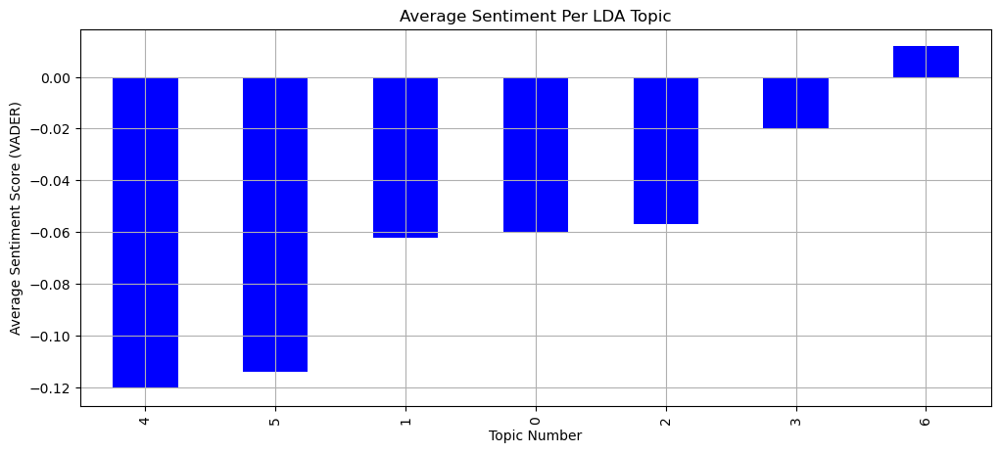

In [90]:
import matplotlib.pyplot as plt

# ✅ Load Updated Dataset with Sentiment
df = pd.read_csv("/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv")

# ✅ Compute Average Sentiment Per Topic
topic_sentiment = df.groupby("LDA_Topic")["VADER_Sentiment"].mean()

# ✅ Plot Sentiment Trends Per Topic
plt.figure(figsize=(12, 5))
topic_sentiment.sort_values().plot(kind="bar", color="blue")
plt.title("Average Sentiment Per LDA Topic")
plt.xlabel("Topic Number")
plt.ylabel("Average Sentiment Score (VADER)")
plt.grid()
plt.show()

In [92]:
import pandas as pd

# ✅ Load Updated Dataset with Sentiment
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"
df = pd.read_csv(file_path)

# ✅ Count Articles Per Topic
topic_counts = df["LDA_Topic"].value_counts()

# ✅ Print Most Common Topics & Their Sentiment Scores
print("🔹 Most Common LDA Topics:")
print(topic_counts)

# ✅ Print Sentiment Scores Per Topic
topic_sentiment = df.groupby("LDA_Topic")["VADER_Sentiment"].mean().sort_values()
print("\n🔹 Average Sentiment Per Topic:")
print(topic_sentiment)

🔹 Most Common LDA Topics:
LDA_Topic
2    76
3    76
6    52
0    50
1    48
4    45
5    43
Name: count, dtype: int64

🔹 Average Sentiment Per Topic:
LDA_Topic
4   -0.120620
5   -0.114198
1   -0.062077
0   -0.060104
2   -0.056836
3   -0.019880
6    0.011802
Name: VADER_Sentiment, dtype: float64


In [98]:
import matplotlib.pyplot as plt

# ✅ Count Topics by News Source
source_topic_counts = df.groupby(["LDA_Topic", "Source"]).size().unstack(fill_value=0)

# ✅ Plot Stacked Bar Chart
source_topic_counts.plot(kind="bar", stacked=True, figsize=(12,6), colormap="viridis")

plt.title("Topic Distribution Across News Sources")
plt.xlabel("LDA Topic Number")
plt.ylabel("Number of Articles")
plt.legend(title="News Source")
plt.grid()
plt.show()

KeyError: 'Source'

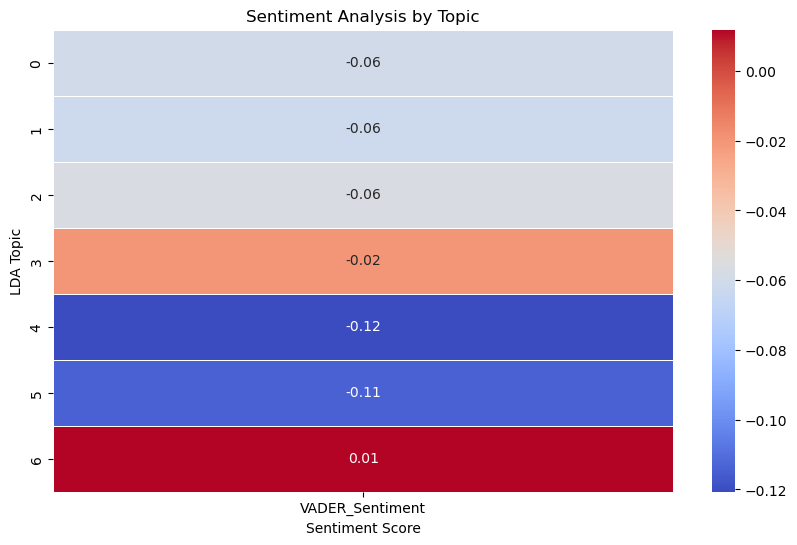

In [100]:
import seaborn as sns

# ✅ Prepare Data for Heatmap
heatmap_data = df.pivot_table(index="LDA_Topic", values="VADER_Sentiment", aggfunc="mean")

# ✅ Plot Heatmap
plt.figure(figsize=(10,6))
sns.heatmap(heatmap_data, cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5)

plt.title("Sentiment Analysis by Topic")
plt.xlabel("Sentiment Score")
plt.ylabel("LDA Topic")
plt.show()

In [102]:
import pandas as pd

# Load the dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"
df = pd.read_csv(file_path)

# Print available columns
print("Available Columns:")
print(df.columns)

Available Columns:
Index(['title', 'summary', 'datetime', 'cleaned_text', 'LDA_Topic',
       'VADER_Sentiment'],
      dtype='object')


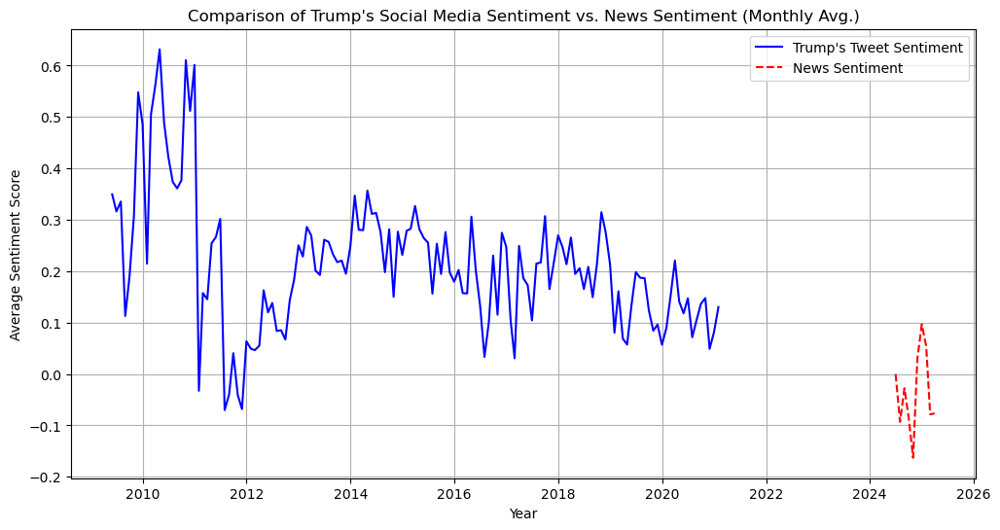

In [108]:
import pandas as pd
import matplotlib.pyplot as plt

# ** Load Trump's Tweet Sentiment Data **
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_tweets = pd.read_csv(tweets_file)

# ** Load News Sentiment Data (LDA Processed) **
news_file = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"
df_news = pd.read_csv(news_file)

# ** Convert datetime column to proper format **
df_tweets["datetime"] = pd.to_datetime(df_tweets["datetime"])
df_news["datetime"] = pd.to_datetime(df_news["datetime"])

# ** Resample Data: Compute Monthly Average Sentiment Scores **
df_tweets_resampled = df_tweets.set_index("datetime")["sentiment_score"].resample("M").mean().rename("Tweet Sentiment")
df_news_resampled = df_news.set_index("datetime")["VADER_Sentiment"].resample("M").mean().rename("News Sentiment")

# ** Merge Both Sentiments for Comparison **
df_sentiment_trends = pd.concat([df_tweets_resampled, df_news_resampled], axis=1)

# ** Plot the Sentiment Trends **
plt.figure(figsize=(12,6))
plt.plot(df_sentiment_trends.index, df_sentiment_trends["Tweet Sentiment"], label="Trump's Tweet Sentiment", linestyle="-", color="blue")
plt.plot(df_sentiment_trends.index, df_sentiment_trends["News Sentiment"], label="News Sentiment", linestyle="--", color="red")
plt.title("Comparison of Trump's Social Media Sentiment vs. News Sentiment (Monthly Avg.)")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid(True)
plt.show()

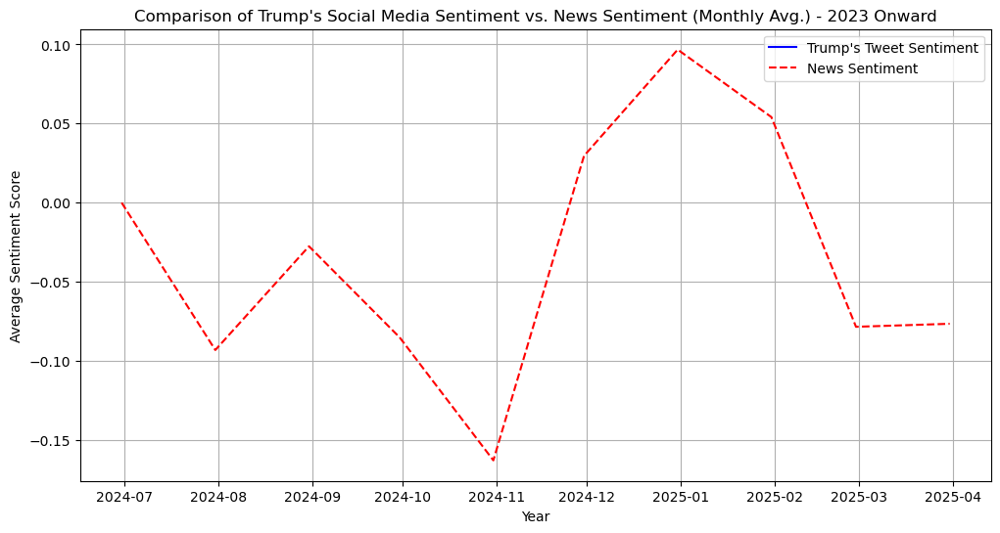

In [112]:
import pandas as pd
import matplotlib.pyplot as plt

# ** Load Trump's Tweet Sentiment Data **
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_tweets = pd.read_csv(tweets_file)

# ** Load News Sentiment Data (LDA Processed) **
news_file = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"
df_news = pd.read_csv(news_file)

# ** Convert datetime column to proper format **
df_tweets["datetime"] = pd.to_datetime(df_tweets["datetime"])
df_news["datetime"] = pd.to_datetime(df_news["datetime"])

# ** Filter tweets only from 2023 onwards to match news dataset **
df_tweets = df_tweets[df_tweets["datetime"] >= "2023-01-01"]

# ** Resample Data: Compute Monthly Average Sentiment Scores **
df_tweets_resampled = df_tweets.set_index("datetime")["sentiment_score"].resample("M").mean().rename("Tweet Sentiment")
df_news_resampled = df_news.set_index("datetime")["VADER_Sentiment"].resample("M").mean().rename("News Sentiment")

# ** Merge Both Sentiments for Comparison **
df_sentiment_trends = pd.concat([df_tweets_resampled, df_news_resampled], axis=1)

# ** Plot the Sentiment Trends **
plt.figure(figsize=(12,6))
plt.plot(df_sentiment_trends.index, df_sentiment_trends["Tweet Sentiment"], label="Trump's Tweet Sentiment", linestyle="-", color="blue")
plt.plot(df_sentiment_trends.index, df_sentiment_trends["News Sentiment"], label="News Sentiment", linestyle="--", color="red")
plt.title("Comparison of Trump's Social Media Sentiment vs. News Sentiment (Monthly Avg.) - 2023 Onward")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid(True)
plt.show()

In [126]:
import pandas as pd

# ✅ Load Datasets
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
news_file = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"

df_tweets = pd.read_csv(tweets_file)
df_news = pd.read_csv(news_file)

# ✅ Print Available Columns
print("Tweet Dataset Columns:", df_tweets.columns)
print("News Dataset Columns:", df_news.columns)

Tweet Dataset Columns: Index(['datetime', 'sentiment_score'], dtype='object')
News Dataset Columns: Index(['title', 'summary', 'datetime', 'cleaned_text', 'LDA_Topic',
       'VADER_Sentiment'],
      dtype='object')


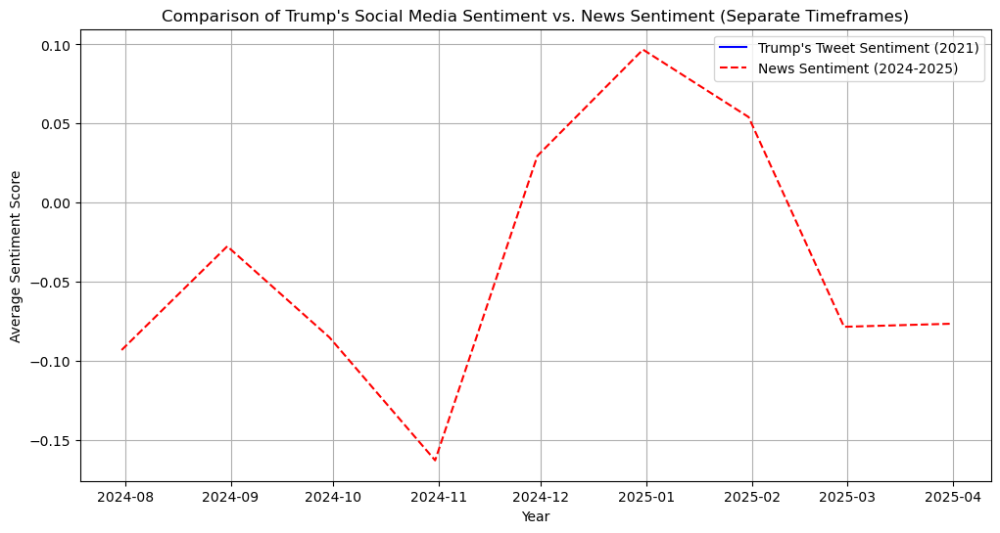

In [128]:
import pandas as pd
import matplotlib.pyplot as plt

# ✅ Load Datasets
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
news_file = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"

df_tweets = pd.read_csv(tweets_file, parse_dates=["datetime"])
df_news = pd.read_csv(news_file, parse_dates=["datetime"])

# ✅ Select Correct Sentiment Columns
sentiment_col_tweets = "sentiment_score"  # Tweets dataset
sentiment_col_news = "VADER_Sentiment"  # News dataset

# ✅ Filter Tweets: April 2021 - December 2021
df_tweets_filtered = df_tweets[(df_tweets["datetime"] >= "2021-04-01") & 
                               (df_tweets["datetime"] <= "2021-12-31")]

# ✅ Filter News: July 2024 - March 2025
df_news_filtered = df_news[(df_news["datetime"] >= "2024-07-01") & 
                           (df_news["datetime"] <= "2025-03-31")]

# ✅ Resample by Month & Compute Mean Sentiment Scores
df_tweets_resampled = df_tweets_filtered.set_index("datetime")[sentiment_col_tweets].resample("M").mean()
df_news_resampled = df_news_filtered.set_index("datetime")[sentiment_col_news].resample("M").mean()

# ✅ Plot Sentiment Trends Separately
plt.figure(figsize=(12,6))

# 📊 Plot 1: Tweets Sentiment (April 2021 - Dec 2021)
plt.plot(df_tweets_resampled.index, df_tweets_resampled, label="Trump's Tweet Sentiment (2021)", color="blue")

# 📊 Plot 2: News Sentiment (July 2024 - March 2025)
plt.plot(df_news_resampled.index, df_news_resampled, label="News Sentiment (2024-2025)", linestyle="dashed", color="red")

# ✅ Formatting
plt.title("Comparison of Trump's Social Media Sentiment vs. News Sentiment (Separate Timeframes)")
plt.xlabel("Year")
plt.ylabel("Average Sentiment Score")
plt.legend()
plt.grid(True)
plt.show()

In [134]:
import pandas as pd

# ✅ Correct File Paths
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
news_file = "/Users/anirudhravipudi/Desktop/AI/Projects/news_topics_lda_with_sentiment.csv"

# ✅ Load the datasets
df_tweets = pd.read_csv(tweets_file, parse_dates=["datetime"])
df_news = pd.read_csv(news_file, parse_dates=["datetime"])

# ✅ Filter Tweets (April 2021 - Dec 2022)
df_tweets_filtered = df_tweets[(df_tweets["datetime"] >= "2021-04-01") & 
                               (df_tweets["datetime"] <= "2022-12-31")]

# ✅ Filter News Articles (July 2024 - March 2025)
df_news_filtered = df_news[(df_news["datetime"] >= "2024-07-01") & 
                           (df_news["datetime"] <= "2025-03-31")]

# ✅ Select Only Numeric Columns for Resampling
numeric_cols_tweets = ["sentiment_score"]  # Tweets dataset
numeric_cols_news = ["VADER_Sentiment"]    # News dataset

# ✅ Resample (Monthly Average Sentiment)
df_tweets_resampled = df_tweets_filtered.set_index("datetime")[numeric_cols_tweets].resample("M").mean()
df_news_resampled = df_news_filtered.set_index("datetime")[numeric_cols_news].resample("M").mean()

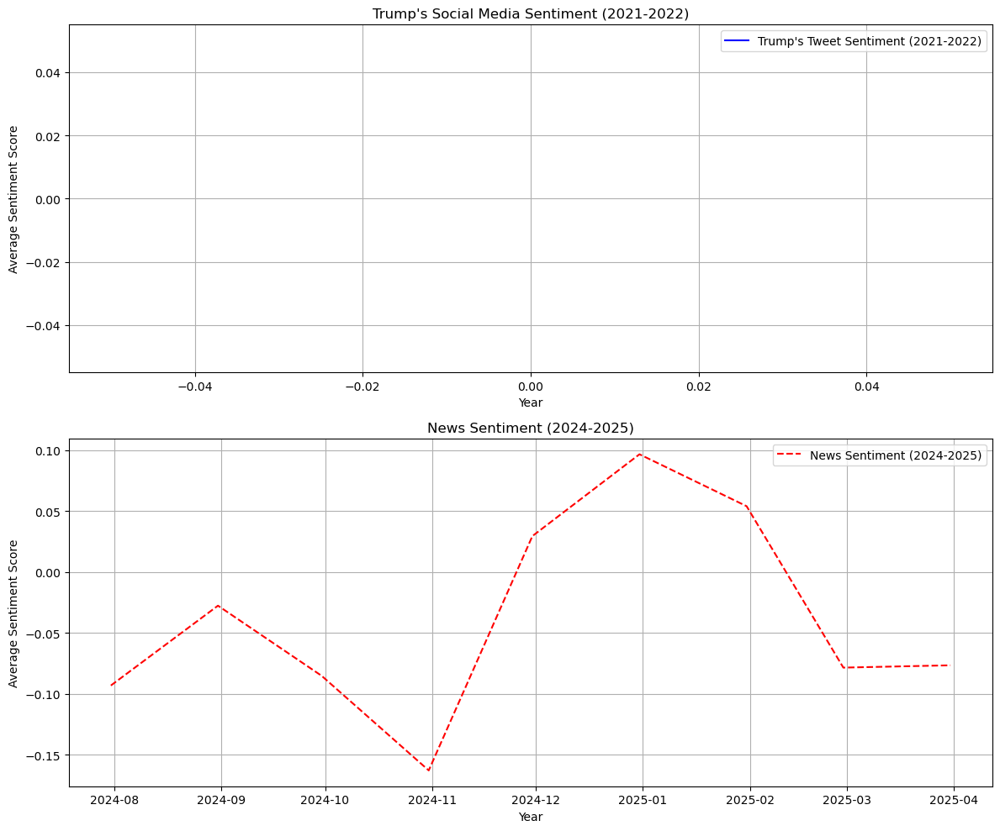

In [136]:
import matplotlib.pyplot as plt

# ✅ Create Two Separate Figures
fig, ax = plt.subplots(2, 1, figsize=(12, 10))

# 📊 Plot Trump's Tweet Sentiment (2021-2022)
ax[0].plot(df_tweets_resampled.index, df_tweets_resampled["sentiment_score"], 
           label="Trump's Tweet Sentiment (2021-2022)", linestyle="-", color="blue")
ax[0].set_title("Trump's Social Media Sentiment (2021-2022)")
ax[0].set_xlabel("Year")
ax[0].set_ylabel("Average Sentiment Score")
ax[0].legend()
ax[0].grid(True)

# 📊 Plot News Sentiment (2024-2025)
ax[1].plot(df_news_resampled.index, df_news_resampled["VADER_Sentiment"], 
           label="News Sentiment (2024-2025)", linestyle="--", color="red")
ax[1].set_title("News Sentiment (2024-2025)")
ax[1].set_xlabel("Year")
ax[1].set_ylabel("Average Sentiment Score")
ax[1].legend()
ax[1].grid(True)

# ✅ Show Both Plots
plt.tight_layout()
plt.show()

In [138]:
!pip install pytrends

from pytrends.request import TrendReq
import pandas as pd

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [142]:
from pytrends.request import TrendReq
import pandas as pd

pytrends = TrendReq(hl="en-US", tz=360)

kw_list = ["Donald Trump"]
timeframes = [
    "2023-07-01 2023-09-30",
    "2023-10-01 2023-12-31",
    "2024-01-01 2024-03-31",
    "2024-04-01 2024-06-30",
    "2024-07-01 2024-09-30",
    "2024-10-01 2024-12-31",
    "2025-01-01 2025-03-31",
]

# Collect data in parts
df_list = []
for timeframe in timeframes:
    pytrends.build_payload(kw_list, cat=0, timeframe=timeframe, geo="US", gprop="")
    df_part = pytrends.interest_over_time()
    df_part = df_part.drop(columns=["isPartial"])  # Remove incomplete data
    df_list.append(df_part)

# Combine all timeframes into one dataset
df_trends = pd.concat(df_list)

# Save the data
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_google_trends.csv"
df_trends.to_csv(file_path, index=True)

print(f"✅ Google Trends Data Saved at: {file_path}")

✅ Google Trends Data Saved at: /Users/anirudhravipudi/Desktop/AI/Projects/trump_google_trends.csv


In [144]:
import pandas as pd

# Load the dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_google_trends.csv"
df_trends = pd.read_csv(file_path, parse_dates=["date"], index_col="date")

# Display first few rows
print(df_trends.head())

            Donald Trump
date                    
2023-07-01             5
2023-07-02             4
2023-07-03             4
2023-07-04             4
2023-07-05             5


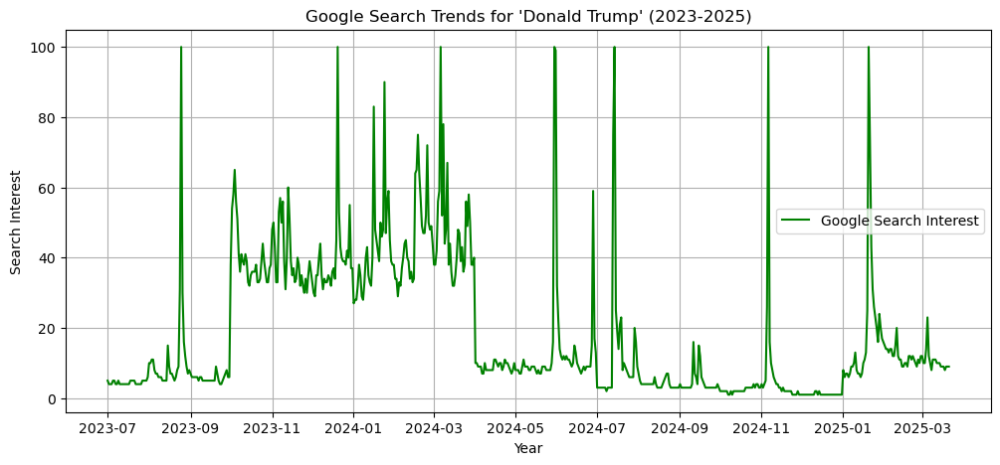

In [146]:
import matplotlib.pyplot as plt

# Plot Google Trends Data
plt.figure(figsize=(12,5))
plt.plot(df_trends.index, df_trends["Donald Trump"], color="green", label="Google Search Interest")
plt.title("Google Search Trends for 'Donald Trump' (2023-2025)")
plt.xlabel("Year")
plt.ylabel("Search Interest")
plt.legend()
plt.grid()
plt.show()

In [184]:
from pytrends.request import TrendReq
import pandas as pd
import time

# Initialize pytrends
pytrends = TrendReq(hl='en-US', tz=360)

# Define keyword
kw_list = ["Donald Trump"]

# Generate 3-month intervals from 2011 to 2022
date_ranges = pd.date_range(start="2011-01-01", end="2022-12-31", freq='3MS')

# Initialize empty DataFrame to store results
all_trends_data = pd.DataFrame()

# Loop through each 3-month interval
for i in range(len(date_ranges) - 1):
    start_date = date_ranges[i].strftime('%Y-%m-%d')
    end_date = date_ranges[i + 1].strftime('%Y-%m-%d')
    timeframe = f"{start_date} {end_date}"

    print(f"Fetching Google Trends data for: {timeframe}")
    
    try:
        # Fetch data
        pytrends.build_payload(kw_list, cat=0, timeframe=timeframe, geo='', gprop='')
        trends_data = pytrends.interest_over_time()

        # Remove 'isPartial' column if exists
        if 'isPartial' in trends_data.columns:
            trends_data = trends_data.drop(columns=['isPartial'])

        # Reset index to make datetime a column
        trends_data = trends_data.reset_index()

        # Rename columns
        trends_data.rename(columns={"date": "datetime", "Donald Trump": "search_interest"}, inplace=True)

        # Append data
        all_trends_data = pd.concat([all_trends_data, trends_data], ignore_index=True)

        # Sleep to prevent 429 error (Too Many Requests)
        time.sleep(5)

    except Exception as e:
        print(f"❌ Error fetching data for {timeframe}: {e}")

# Save the collected data to CSV
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_google_trends_2011_2022.csv"
all_trends_data.to_csv(file_path, index=False)

print(f"✅ Google Trends Data (2011-2022) Saved: {file_path}")

# Display first few rows
print(all_trends_data.head())

Fetching Google Trends data for: 2011-01-01 2011-04-01
Fetching Google Trends data for: 2011-04-01 2011-07-01
Fetching Google Trends data for: 2011-07-01 2011-10-01
Fetching Google Trends data for: 2011-10-01 2012-01-01
Fetching Google Trends data for: 2012-01-01 2012-04-01
❌ Error fetching data for 2012-01-01 2012-04-01: The request failed: Google returned a response with code 429
Fetching Google Trends data for: 2012-04-01 2012-07-01
❌ Error fetching data for 2012-04-01 2012-07-01: The request failed: Google returned a response with code 429
Fetching Google Trends data for: 2012-07-01 2012-10-01
❌ Error fetching data for 2012-07-01 2012-10-01: The request failed: Google returned a response with code 429
Fetching Google Trends data for: 2012-10-01 2013-01-01
❌ Error fetching data for 2012-10-01 2013-01-01: The request failed: Google returned a response with code 429
Fetching Google Trends data for: 2013-01-01 2013-04-01
❌ Error fetching data for 2013-01-01 2013-04-01: The request fail

In [190]:
import pandas as pd

# Load Tweet Sentiment Data
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_tweets = pd.read_csv(tweets_file, parse_dates=["datetime"])

# Load Google Trends Data
trends_file = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(trends_file, parse_dates=["date"])

# Rename for consistency
df_trends.rename(columns={"date": "datetime", "Donald Trump": "search_interest"}, inplace=True)

ValueError: Missing column provided to 'parse_dates': 'date'

In [196]:
import pandas as pd

# Load without parsing dates yet
trends_file = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(trends_file)

# Show column names
print("Google Trends Columns:", df_trends.columns)
print("\nFirst few rows:")
print(df_trends.head())

Google Trends Columns: Index(['Category: All categories'], dtype='object')

First few rows:
              Category: All categories
Month    Donald Trump: (United States)
2011-01                              1
2011-02                              2
2011-03                              5
2011-04                              9


In [198]:
df_trends = pd.read_csv(trends_file, parse_dates=["Week"])
df_trends.rename(columns={"Week": "datetime", "Donald Trump": "search_interest"}, inplace=True)

ValueError: Missing column provided to 'parse_dates': 'Week'

In [200]:
import pandas as pd

# Load the file normally
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(file_path)

# Print columns and a preview of the data
print("\n🧩 Column Names:")
print(df_trends.columns)

print("\n🔍 First 5 Rows:")
print(df_trends.head())


🧩 Column Names:
Index(['Category: All categories'], dtype='object')

🔍 First 5 Rows:
              Category: All categories
Month    Donald Trump: (United States)
2011-01                              1
2011-02                              2
2011-03                              5
2011-04                              9


In [202]:
import pandas as pd

# Load CSV with first column as index
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(file_path, index_col=0)

# Reset index to bring dates into a column
df_trends = df_trends.reset_index()

# Rename columns for clarity
df_trends.columns = ["datetime", "search_interest"]

# Convert datetime to proper format (monthly)
df_trends["datetime"] = pd.to_datetime(df_trends["datetime"], format="%Y-%m")

# Confirm it's cleaned
print(df_trends.head())

ValueError: time data "Month" doesn't match format "%Y-%m", at position 0. You might want to try:
    - passing `format` if your strings have a consistent format;
    - passing `format='ISO8601'` if your strings are all ISO8601 but not necessarily in exactly the same format;
    - passing `format='mixed'`, and the format will be inferred for each element individually. You might want to use `dayfirst` alongside this.

In [204]:
import pandas as pd

# ✅ Load the CSV, skipping the first row
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(file_path, skiprows=1)

# ✅ Rename columns manually
df_trends.columns = ["datetime", "search_interest"]

# ✅ Convert 'datetime' column to datetime object
df_trends["datetime"] = pd.to_datetime(df_trends["datetime"], format="%Y-%m")

# ✅ Confirm structure
print("\n✅ Cleaned Google Trends Data:")
print(df_trends.head())


✅ Cleaned Google Trends Data:
    datetime  search_interest
0 2011-01-01                1
1 2011-02-01                2
2 2011-03-01                5
3 2011-04-01                9
4 2011-05-01                6


In [206]:
# Load tweet sentiment data
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_tweets = pd.read_csv(tweets_file, parse_dates=["datetime"])

# Remove timezone if present
df_tweets["datetime"] = pd.to_datetime(df_tweets["datetime"]).dt.tz_localize(None)

# Resample tweet sentiment to monthly average
df_tweets.set_index("datetime", inplace=True)
df_tweets_resampled = df_tweets["sentiment_score"].resample("M").mean().reset_index()

In [208]:
# Load cleaned Google Trends data
trends_file = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(trends_file, skiprows=1)
df_trends.columns = ["datetime", "search_interest"]
df_trends["datetime"] = pd.to_datetime(df_trends["datetime"], format="%Y-%m")

# Merge on datetime
df_combined = pd.merge(df_tweets_resampled, df_trends, on="datetime", how="inner")

# Display preview
print(df_combined.head())

Empty DataFrame
Columns: [datetime, sentiment_score, search_interest]
Index: []


In [210]:
print("Tweets (monthly):", df_tweets_resampled["datetime"].min(), "→", df_tweets_resampled["datetime"].max())
print("Google Trends:", df_trends["datetime"].min(), "→", df_trends["datetime"].max())

Tweets (monthly): 2009-05-31 00:00:00 → 2021-01-31 00:00:00
Google Trends: 2011-01-01 00:00:00 → 2022-01-01 00:00:00


In [212]:
# Trim both datasets to 2011–2022
start = "2011-01-01"
end = "2022-12-31"

df_tweets_trimmed = df_tweets_resampled[
    (df_tweets_resampled["datetime"] >= start) & (df_tweets_resampled["datetime"] <= end)
]

df_trends_trimmed = df_trends[
    (df_trends["datetime"] >= start) & (df_trends["datetime"] <= end)
]

In [214]:
# Merge using trimmed versions
df_combined = pd.merge(df_tweets_trimmed, df_trends_trimmed, on="datetime", how="inner")
print(f"✅ Merged DataFrame shape: {df_combined.shape}")
print(df_combined.head())

✅ Merged DataFrame shape: (0, 3)
Empty DataFrame
Columns: [datetime, sentiment_score, search_interest]
Index: []


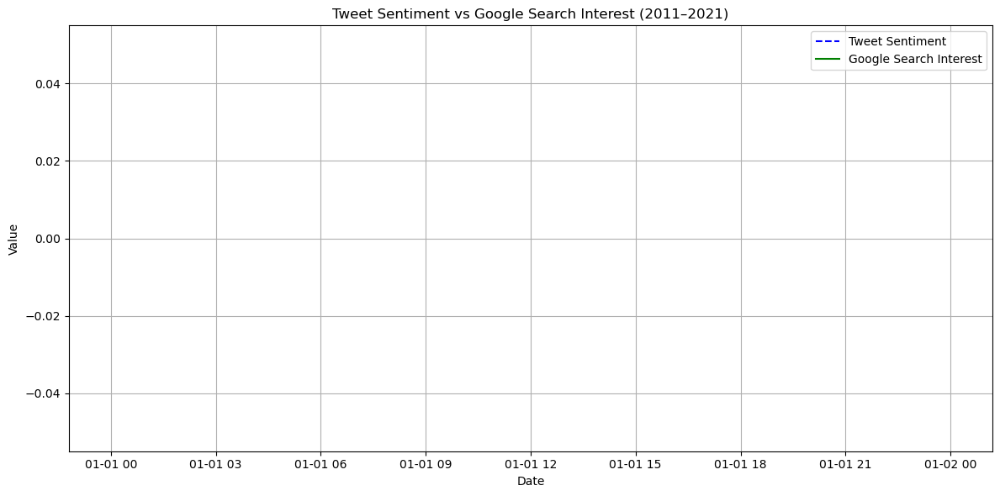

In [216]:
import pandas as pd
import matplotlib.pyplot as plt

# Load tweet sentiment (already resampled)
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_tweets = pd.read_csv(tweets_file, parse_dates=["datetime"])
df_tweets["datetime"] = pd.to_datetime(df_tweets["datetime"]).dt.tz_localize(None)
df_tweets.set_index("datetime", inplace=True)
df_tweets_resampled = df_tweets["sentiment_score"].resample("M").mean().reset_index()

# Load Google Trends
trends_file = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(trends_file, skiprows=1)
df_trends.columns = ["datetime", "search_interest"]
df_trends["datetime"] = pd.to_datetime(df_trends["datetime"], format="%Y-%m")

# ✅ Filter to overlapping time range
start, end = "2011-01-01", "2021-01-31"
df_tweets_filtered = df_tweets_resampled[
    (df_tweets_resampled["datetime"] >= start) & (df_tweets_resampled["datetime"] <= end)
]
df_trends_filtered = df_trends[
    (df_trends["datetime"] >= start) & (df_trends["datetime"] <= end)
]

# ✅ Merge and plot
df_combined = pd.merge(df_tweets_filtered, df_trends_filtered, on="datetime", how="inner")

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_combined["datetime"], df_combined["sentiment_score"], label="Tweet Sentiment", color="blue", linestyle="--")
plt.plot(df_combined["datetime"], df_combined["search_interest"], label="Google Search Interest", color="green")
plt.title("Tweet Sentiment vs Google Search Interest (2011–2021)")
plt.xlabel("Date")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [218]:
print("🔍 Tweets Dataset After Filtering:")
print(df_tweets_filtered.head())
print(df_tweets_filtered.info())

print("\n🔍 Google Trends Dataset After Filtering:")
print(df_trends_filtered.head())
print(df_trends_filtered.info())

🔍 Tweets Dataset After Filtering:
     datetime  sentiment_score
20 2011-01-31        -0.032567
21 2011-02-28         0.157494
22 2011-03-31         0.145450
23 2011-04-30         0.254240
24 2011-05-31         0.266777
<class 'pandas.core.frame.DataFrame'>
Index: 121 entries, 20 to 140
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   datetime         121 non-null    datetime64[ns]
 1   sentiment_score  121 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 2.8 KB
None

🔍 Google Trends Dataset After Filtering:
    datetime  search_interest
0 2011-01-01                1
1 2011-02-01                2
2 2011-03-01                5
3 2011-04-01                9
4 2011-05-01                6
<class 'pandas.core.frame.DataFrame'>
Index: 121 entries, 0 to 120
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------

In [220]:
print("\n🛠 Merged Dataset (First 5 Rows)")
print(df_combined.head())
print(df_combined.info())


🛠 Merged Dataset (First 5 Rows)
Empty DataFrame
Columns: [datetime, sentiment_score, search_interest]
Index: []
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 0 entries
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   datetime         0 non-null      datetime64[ns]
 1   sentiment_score  0 non-null      float64       
 2   search_interest  0 non-null      int64         
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 124.0 bytes
None


In [222]:
df_tweets_filtered["datetime"] = pd.to_datetime(df_tweets_filtered["datetime"]).dt.date
df_trends_filtered["datetime"] = pd.to_datetime(df_trends_filtered["datetime"]).dt.date

In [224]:
df_combined = pd.merge(df_tweets_filtered, df_trends_filtered, on="datetime", how="inner")

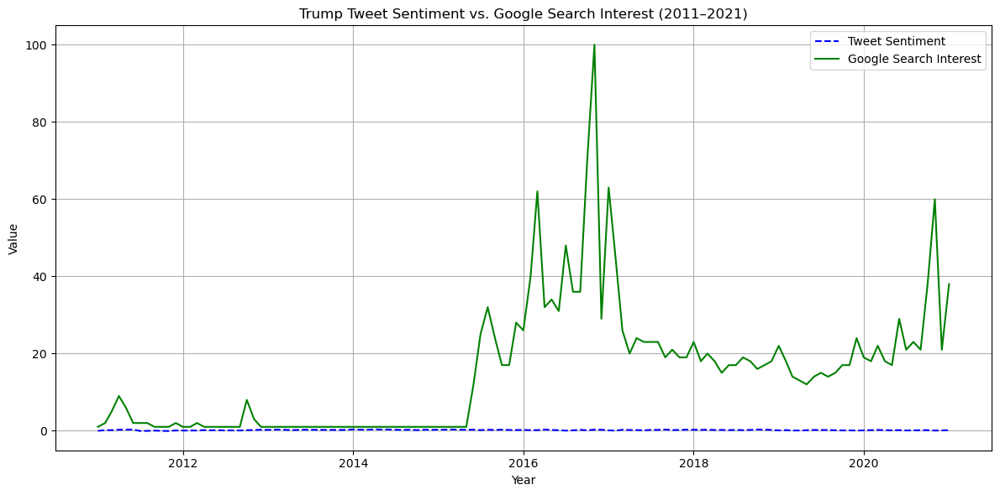

In [226]:
import pandas as pd
import matplotlib.pyplot as plt

# ✅ Load Tweet Sentiment Data
tweets_file = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
df_tweets = pd.read_csv(tweets_file, parse_dates=["datetime"])
df_tweets["datetime"] = pd.to_datetime(df_tweets["datetime"]).dt.tz_localize(None)
df_tweets.set_index("datetime", inplace=True)
tweets_monthly = df_tweets["sentiment_score"].resample("M").mean().reset_index()

# ✅ Load Cleaned Google Trends Data
trends_file = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"
df_trends = pd.read_csv(trends_file, skiprows=1)
df_trends.columns = ["datetime", "search_interest"]
df_trends["datetime"] = pd.to_datetime(df_trends["datetime"], format="%Y-%m")

# ✅ Filter both to the common date range: 2011-01 to 2021-01
start = "2011-01-01"
end = "2021-01-31"
tweets_trimmed = tweets_monthly[(tweets_monthly["datetime"] >= start) & (tweets_monthly["datetime"] <= end)]
trends_trimmed = df_trends[(df_trends["datetime"] >= start) & (df_trends["datetime"] <= end)]

# ✅ Ensure datetime format aligns exactly (remove time component if needed)
tweets_trimmed["datetime"] = tweets_trimmed["datetime"].dt.to_period("M").dt.to_timestamp()
trends_trimmed["datetime"] = trends_trimmed["datetime"].dt.to_period("M").dt.to_timestamp()

# ✅ Merge on datetime
df_combined = pd.merge(tweets_trimmed, trends_trimmed, on="datetime", how="inner")

# ✅ Plot the merged data
plt.figure(figsize=(12, 6))
plt.plot(df_combined["datetime"], df_combined["sentiment_score"], label="Tweet Sentiment", color="blue", linestyle="--")
plt.plot(df_combined["datetime"], df_combined["search_interest"], label="Google Search Interest", color="green")
plt.title("Trump Tweet Sentiment vs. Google Search Interest (2011–2021)")
plt.xlabel("Year")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [228]:
print(df_combined["sentiment_score"].describe())

count    121.000000
mean       0.177805
std        0.092060
min       -0.070084
25%        0.118012
50%        0.192709
75%        0.253458
max        0.356690
Name: sentiment_score, dtype: float64


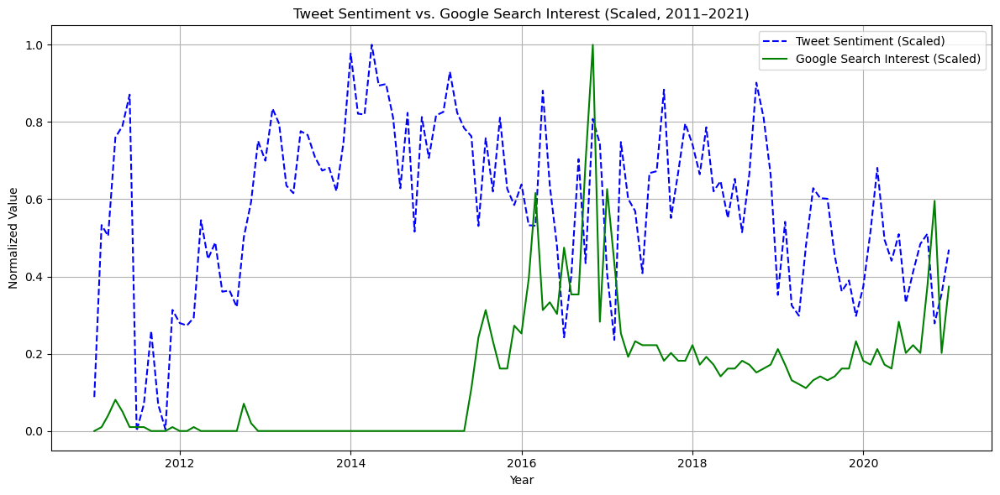

In [230]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaled = scaler.fit_transform(df_combined[["sentiment_score", "search_interest"]])
df_scaled = pd.DataFrame(scaled, columns=["Tweet Sentiment", "Google Search Interest"])
df_scaled["datetime"] = df_combined["datetime"]

# Plot again
plt.figure(figsize=(12, 6))
plt.plot(df_scaled["datetime"], df_scaled["Tweet Sentiment"], label="Tweet Sentiment (Scaled)", linestyle="--", color="blue")
plt.plot(df_scaled["datetime"], df_scaled["Google Search Interest"], label="Google Search Interest (Scaled)", color="green")
plt.title("Tweet Sentiment vs. Google Search Interest (Scaled, 2011–2021)")
plt.xlabel("Year")
plt.ylabel("Normalized Value")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [232]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the combined dataset
file_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_vs_trends_scaled.csv"
df = pd.read_csv(file_path)

# Preview the data
print("🔍 Available Columns:")
print(df.columns)
print("\n📊 First 5 Rows:")
print(df.head())

# Check for missing values
print("\n🧹 Missing Values:")
print(df.isnull().sum())

# Drop missing values (if any)
df.dropna(inplace=True)

# Compute the correlation matrix
correlation = df[["sentiment_score_scaled", "search_interest_scaled"]].corr()
print("\n📈 Correlation Matrix:")
print(correlation)

# Plot correlation heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(correlation, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation: Tweet Sentiment vs. Google Search Interest")
plt.tight_layout()
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_vs_trends_scaled.csv'

In [234]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Load the combined dataset
df_combined = pd.read_csv("/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_vs_trends.csv", parse_dates=["datetime"])

# Scale the values
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df_combined[["sentiment_score", "search_interest"]])

# Create a new DataFrame
df_scaled = pd.DataFrame(scaled, columns=["Tweet Sentiment", "Google Search Interest"])
df_scaled["datetime"] = df_combined["datetime"]

# Save the scaled data
df_scaled.to_csv("/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_vs_trends_scaled.csv", index=False)
print("✅ Scaled data saved successfully!")

FileNotFoundError: [Errno 2] No such file or directory: '/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_vs_trends.csv'

In [236]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# === Step 1: Load the datasets ===
tweets_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_sentiment.csv"
trends_path = "/Users/anirudhravipudi/Desktop/AI/Projects/Trump_google_trends.csv"

df_tweets = pd.read_csv(tweets_path, parse_dates=["datetime"])
df_trends = pd.read_csv(trends_path, parse_dates=["datetime"])

# === Step 2: Resample to monthly averages ===
df_tweets_monthly = df_tweets.set_index("datetime").resample("M").mean(numeric_only=True).reset_index()
df_trends_monthly = df_trends.set_index("datetime").resample("M").mean(numeric_only=True).reset_index()

# === Step 3: Merge datasets on datetime ===
df_combined = pd.merge(df_tweets_monthly, df_trends_monthly, on="datetime", how="inner")
df_combined.columns = ["datetime", "sentiment_score", "search_interest"]

# === Step 4: Scale sentiment and trends ===
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df_combined[["sentiment_score", "search_interest"]])

df_scaled = pd.DataFrame(scaled, columns=["Tweet Sentiment", "Google Search Interest"])
df_scaled["datetime"] = df_combined["datetime"]

# === Step 5: Save the combined & scaled data ===
output_path = "/Users/anirudhravipudi/Desktop/AI/Projects/trump_tweets_vs_trends_scaled.csv"
df_scaled.to_csv(output_path, index=False)

print("✅ Scaled data saved to:", output_path)

ValueError: Missing column provided to 'parse_dates': 'datetime'